In [ ]:
# Version V1.1:
# Separate file for segmentation re-do. Multiple files can be re-segmented at the same time using modelNames. 
# Script loops through all datapaths and modelNames. 

## surface segmentation using ilastik, from h5 files

In [1]:
import ilastik.experimental.api
from ilastik.experimental.api import from_project_file
from xarray import DataArray

#### Load Libraries

In [1]:
# The environment to use here is: celltraj_env
#%%capture
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
sys.path.insert(0,'/home/wsltools/programs/celltraj/celltraj')
import trajectory
import imageprep as imprep
import utilities
import features
import model
import h5py
import pickle
import os
import subprocess
import time
#import bootstrap
import umap
import pyemma.coordinates as coor
import scipy
import csaps
import skimage
from IPython.display import clear_output
import os
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
np.float=np.dtype(float)
np.int=int
import msmtools
import pandas
import itertools
import ray

Solver suite is petsc
{'python': '3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) | [GCC 12.3.0]', 'fipy': '3.4.4', 'numpy': '1.26.4', 'pysparse': 'not installed', 'scipy': '1.13.0', 'matplotlib': '3.8.4', 'mpi4py': '3.1.6', 'petsc4py': '3.21.1', 'pyamgx': 'not installed', 'PyTrilinos': 'not installed', 'mayavi': '4.8.2.dev0', 'gmsh': 'not installed', 'solver': 'petsc'}


2024-12-19 14:26:06,429	INFO util.py:154 -- Outdated packages:
  ipywidgets==7.8.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


#### Load File Details

In [2]:
#%%capture

# This date is to make folders of analysis based off the date you do the analysis. 
date = '17dec24'
os.system(f'mkdir -p {date}')

# Make sure the model names are correct since these are what the file names have been called. If you want to rename
# the files, use script 'file_rename'
modelNames = [f'20241004_OS17lungInh2_RM'] 

datapaths=['/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last']

#### Loop through the segmented files

In [3]:
#%%capture
import imageprep as imprep
import itertools

modelLists = [None]*len(modelNames)
inds_imagingSet=[]
for idataset in range(len(modelNames)):
    modelLists[idataset]=imprep.list_images(f'{datapaths[idataset]}/{modelNames[idataset]}_xy*_roi*.h5')
    inds_dataset=[idataset]*len(modelLists[idataset])
    inds_imagingSet.append(inds_dataset)

inds_imagingSet=list(itertools.chain(*inds_imagingSet))

for ilist in range(len(modelLists)):
    print(f'movies: {modelLists[ilist]}')

movies: ['/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5', '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5', '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5', '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5', '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5', '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5']


#### Surface segmentation

In [10]:
def get_surf_fmask_lung_cancer(img_ilastik,ilastik_model,cdict_ilp,cdict_surf,histp=None,sigma=5,thresh=0.2,return_prediction=False):
    image = DataArray(img_ilastik, dims=("y", "x", "c"))
    prediction = ilastik_model.predict(image)
    prediction=prediction.to_numpy()
    for ichannel in range(prediction.shape[2]):
        pred=prediction[...,ichannel]
        if sigma is not None:
            pred=scipy.ndimage.gaussian_filter(pred,sigma=sigma)
        if histp is not None:
            plow, phigh = np.percentile(pred, (histp[0], histp[1]))
            pred=(pred-plow)/(phigh-plow)
        prediction[...,ichannel]=pred
    max_pred=np.argmax(prediction,axis=2)
    fmasks=np.zeros((img_ilastik.shape[0],img_ilastik.shape[1],2)).astype(bool)
    fmasks[...,0]=(prediction[...,cdict_ilp['lung']]-prediction[...,cdict_ilp['airway']]>thresh)
    fmasks[...,1]=(prediction[...,cdict_ilp['live-cancer']]+prediction[...,cdict_ilp['dead-cancer']]-prediction[...,cdict_ilp['lung']]-prediction[...,cdict_ilp['airway']]>thresh)
    if return_prediction:
        return prediction,fmasks
    else:
        return fmasks
    return fmasks

In [11]:
def show_3dseg_proj(fig,im3d,labels,surfaces=None,surf_cmaps=None,labels2=None,fmsk=None,zscale=None,label_color='black',label2_color='red',img_cmap=plt.cm.gray_r):
    if zscale is not None:
        im3d=skimage.transform.rescale(im3d,(zscale,1,1),anti_aliasing=False)
        labels=skimage.transform.rescale(labels,(zscale,1,1),order=0)
        for isurf in range(len(surfaces)):
            surfaces[isurf]=skimage.transform.rescale(surfaces[isurf],(zscale,1,1),order=0)
        if labels2 is not None:
            labels2=skimage.transform.rescale(labels2,(zscale,1,1),order=0)
    if surf_cmaps is None and surfaces is not None:
        print(len(surfaces))
        surf_cmaps=[plt.cm.Blues,plt.cm.Greens,plt.cm.Reds,plt.cm.Purples,plt.cm.Oranges,plt.cm.Blues,plt.cm.Greens]
    if label_color is None:
        label_color='black'
    if label2_color is None:
        label2_color='red'
    if img_cmap is None:
        img_cmap=plt.cm.gray_r
    zproj=np.sum(im3d,axis=0)
    xproj=np.sum(im3d,axis=1)
    yproj=np.sum(im3d,axis=2)
    labels_zproj=np.max(labels,axis=0)
    labels_xproj=np.max(labels,axis=1)
    labels_yproj=np.max(labels,axis=2)
    plt.subplot(1,3,1)
    plt.imshow(zproj,cmap=img_cmap)
    plt.contour(labels_zproj,levels=np.arange(np.max(labels_zproj)),colors=label_color,linewidths=1)
    if surfaces is not None:
        for isurf in range(len(surfaces)):
            surf_viz=np.sum(surfaces[isurf],axis=0)
            plt.imshow(np.ma.masked_where(np.logical_not(surf_viz>0),surf_viz),alpha=.5,cmap=surf_cmaps[isurf])#,clim=(0,1))
    if labels2 is not None:
        labels2_zproj=np.max(labels2,axis=0)
        plt.contour(labels2_zproj,levels=np.arange(np.max(labels2_zproj)),colors=label2_color,linewidths=1)  
    plt.axis('equal');plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(xproj,cmap=img_cmap)
    plt.contour(labels_xproj,levels=np.arange(np.max(labels_xproj)),colors=label_color,linewidths=1)
    if surfaces is not None:
        for isurf in range(len(surfaces)):
            surf_viz=np.sum(surfaces[isurf],axis=1)
            plt.imshow(np.ma.masked_where(np.logical_not(surf_viz>0),surf_viz),alpha=.5,cmap=surf_cmaps[isurf])#,clim=(0,1))
    if labels2 is not None:
        labels2_xproj=np.max(labels2,axis=1)
        plt.contour(labels2_xproj,levels=np.arange(np.max(labels2_xproj)),colors=label2_color,linewidths=1)
    plt.axis('equal');plt.axis('off')
    plt.subplot(1,3,3)
    plt.imshow(yproj,cmap=img_cmap)
    plt.contour(labels_yproj,levels=np.arange(np.max(labels_yproj)),colors=label_color,linewidths=1)
    if labels2 is not None:
        labels2_yproj=np.max(labels2,axis=2)
        plt.contour(labels2_yproj,levels=np.arange(np.max(labels2_yproj)),colors=label2_color,linewidths=1)
    if surfaces is not None:
        for isurf in range(len(surfaces)):
            surf_viz=np.sum(surfaces[isurf],axis=2)
            plt.imshow(np.ma.masked_where(np.logical_not(surf_viz>0),surf_viz),alpha=.5,cmap=surf_cmaps[isurf])#,clim=(0,1)) 
    plt.axis('equal');plt.axis('off')

In [12]:
cdict_ilp={'cancer':0,'lung':1,'airway':2}
cdict_surf={'cancer':0,'lung':1,'airway':2}
fmask_channels=['foreground','nuc','lung','cancer']

n_fmasks=2
ndimage=scipy.ndimage
nucl=25                                 #typical nucleus linear diameter pixels
micron_per_pixel=.33                    #lateral resolution (image pixel size)
micron_per_z=3.0                        #axial resolution between z-slices
nucl=25
rsmooth=nucl/4
thresh=0.2
zscale=micron_per_z/micron_per_pixel

ilastik_modelpath='/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/Death3_20241218.ilp'
ilastik_model = from_project_file(ilastik_modelpath)

vizpath='/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241217_surfseg'
pathexists = os.path.isdir(vizpath)     #create image folder if it doesn't exist already
if not pathexists:
    os.mkdir(vizpath)
    
visual=True
modelList_flat=list(itertools.chain(*modelLists))

NameError: name 'from_project_file' is not defined

In [24]:
# Actual surface segmentation
modelList_flat=list(itertools.chain(*modelLists))
modelSet=[None]*len(modelList_flat)
for i in [15,26,27,32]: #range(len(modelList_flat)): 
    try:
        h5filename=modelList_flat[i]
        modelSet[i]=trajectory.Trajectory(h5filename=h5filename)
        sctm=modelSet[i]
        moviename=sctm.figid.decode() #unique for each h5 file
        #status=modelSet[i].load_from_h5('/cell_data_m0/')
        modelSet[i].get_image_shape()                             #some missing info, add in to metadata in future
        fore_fmsk_channel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        try:
            nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
            nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
            nuc_msk_channel=None
            fore_msk_channel=None
        except Exception as e:
            print(e)
            nuc_msk_channel=np.where(sctm.mask_channels==np.array(['nuc']).astype('S32'))[0][0]
            fore_msk_channel=np.where(sctm.mask_channels==np.array(['nuc']).astype('S32'))[0][0]
            nuc_fmsk_channel=None
            fore_fmsk_channel=None
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel
        sctm.mskchannel=0
        nt_roi=sctm.nt;nx_roi=sctm.nx;ny_roi=sctm.ny;nz_roi=sctm.nz
        sctm.ilastik_modelpath=ilastik_modelpath
        sctm.fmask_channels=fmask_channels
        sctm.save_to_h5('/metadata/',['ilastik_modelpath','fmask_channels'],overwrite=True)
        print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel}') 
        nuc_channel=nuc_img_channel
        rep_channel=erk_img_channel
        bf_channel=bf_img_channel
        for iS in range(nt_roi):
            fstr=f'/images/img_{iS}/fmsk'
            with h5py.File(h5filename,'r') as h:
                try:
                    fmsk_df=h[fstr]
                    print(f'{fstr} shape {fmsk_df[...].shape}')
                    fmsk_dim=fmsk_df[...].shape[3]
                except Exception as e:
                    print(e)
                    fmsk_dim=0
            if True: #fmsk_dim!=4: #comment in if the dimentions are not equal in one of the xys.
                img=sctm.get_image_data(iS)
                msk=sctm.get_mask_data(iS)
                if nuc_fmsk_channel is not None:
                    fmsk_fore=sctm.get_fmask_data(iS,channel=fore_fmsk_channel)
                    fmsk_nuc=sctm.get_fmask_data(iS,channel=nuc_fmsk_channel)
                else:
                    fmsk_fore=msk[...,fore_msk_channel]>0
                    fmsk_nuc=msk[...,nuc_msk_channel]>0
                im3d_nuc=utilities.rescale_to_int(imprep.znorm(img[...,nuc_channel]))
                im3d_rep=utilities.rescale_to_int(imprep.znorm(img[...,rep_channel]))
                im3d_bf=imprep.znorm(img[...,bf_channel])
                im3d_bf=skimage.filters.difference_of_gaussians(im3d_bf,.5,1.5)
                im3d_bf=utilities.rescale_to_int(im3d_bf)
                cellpose_img=np.zeros((nz_roi,3,nx_roi,ny_roi)).astype(np.uint16)
                cellpose_img[:,0,:,:]=im3d_bf #add in nuc so not hollow
                cellpose_img[:,1,:,:]=im3d_rep
                cellpose_img[:,2,:,:]=im3d_nuc
                fmasks=np.zeros((nz_roi,nx_roi,ny_roi,n_fmasks)).astype(bool)
                predictions=np.zeros((nz_roi,nx_roi,ny_roi,len(cdict_ilp)))
                for iz in range(nz_roi):
                    print(f'getting ilastik prediction frame {iS} slice {iz} of {nz_roi}')
                    img_ilastik=cellpose_img[iz,...]
                    img_ilastik=np.swapaxes(img_ilastik,0,2);img_ilastik=np.swapaxes(img_ilastik,0,1)
                    predictions[iz,...],fmasks[iz,...]=get_surf_fmask_lung_cancer(img_ilastik,ilastik_model,cdict_ilp,cdict_surf,sigma=rsmooth,thresh=thresh,return_prediction=True)
                #predictions=(predictions*(2**16-1)).astype(int)
                #img=np.concatenate((img,predictions),axis=3)
                #img=np.concatenate((img[...,0:len(sctm.channels)],predictions[...,0][...,np.newaxis]),axis=3)
                fmsks=np.concatenate((fmsk_fore[...,np.newaxis],fmsk_nuc[...,np.newaxis],fmasks),axis=3)
                imprep.save_frame_h5(sctm.h5filename,iS,img=img,msks=msk,fmsk=fmsks,overwrite=True,timestamp=None)
                if visual:
                    clear_output(wait=True)
                    show_3dseg_proj(plt.figure(figsize=(12,5)),img[...,erk_img_channel],msk[...,0],surfaces=[fmsks[...,2],fmsks[...,3]],zscale=sctm.zscale,label_color='green')
                    plt.title(f'{moviename} frame {iS}')
                    plt.savefig(f'{vizpath}/surf_proj_{moviename}_f{iS}.png')
                    plt.show()
    except Exception as e:
        print(e)
        pass

loading /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
saving attributes ['ilastik_modelpath', 'fmask_channels'] to /metadata/ in /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5
overwrote existing and saved ilastik_modelpath to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5//metadata/
overwrote existing and saved fmask_channels to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5//metadata/
loaded /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy23_roi0.h5 with [b'cyto'] mask channels, [b'CFP' b'Cy5' b'TRITC' b'YFP' b'DAPI' b'BF'] image channels, cell index on 0
/images/img_0/fms

In [10]:
#inds_missing=[]
#inds_finished=[]
inds_nosurf=[]
for i in range(len(modelList_flat)): 
    h5filename=modelList_flat[i]
    try:
        with h5py.File(h5filename,'r+') as f:
            #del f['/image/fmskchannel']
            fmsk=f['/images/img_96/fmsk']
            print(fmsk[...].shape)
            cpath=f['/metadata/cellpose_modelpath'][...]
            print(cpath)
            ipath=f['/metadata/ilastik_modelpath'][...]
            print(ipath)
            if fmsk.shape[3]!=4:
                #inds_finished.append(i)  
                inds_nosurf.append(i)
    except:
            print(f'problem on {h5filename}')
            #inds_missing.append(i)

print(np.array(modelList_flat)[inds_nosurf])

(15, 674, 638, 4)
b'/home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/models/OS17_E500_cyto3__GB_20241211'
b'/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/Death3_20241218.ilp'
(15, 702, 678, 4)
b'/home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/models/OS17_E500_cyto3__GB_20241211'
b'/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/Death3_20241218.ilp'
(15, 638, 662, 4)
b'/home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/models/OS17_E500_cyto3__GB_20241211'
b'/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/Death3_20241218.ilp'
(15, 660, 688, 4)
b'/home/wsltools/projects/Rawan/20240715_segmentation/cellpose_trainingdata/models/OS17_E500_cyto3__GB_20241211'
b'/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/Death3_20241218.ilp'
(15, 665, 704, 4)
b'/home/wsltools/p

### featurize and track, including MVE boundary features

In [5]:
#@ray.remote(num_cpus=4)
def get_cellfeatures_distributed(h5filename):
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename)
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        #sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
        #output_message=f'{output_message} loaded cell data...'
        sctm.get_frames()
        sctm.get_cell_index(verbose=True,save_h5=True,overwrite=True)
        ntrans=[1,1,1]
        maxt=[0.,0.,0.]
        tf_matrix_set=sctm.get_stack_trans(mskchannel=sctm.mskchannel,ntrans=ntrans,maxt=maxt,dist_function=utilities.get_pairwise_distance_sum,save_h5=True,overwrite=True,do_global=False) #,contact_transform=True,r0=100.,d0=100.,n=6,m=12)
        clear_output(wait=True)
        x=sctm.get_cell_positions(mskchannel=sctm.mskchannel,save_h5=True,overwrite=True)
        clear_output(wait=True)
        tf_matrix_set_pad,pad_dims=imprep.get_registration_expansions(sctm.tf_matrix_set,sctm.nz,sctm.nx,sctm.ny)
        sctm.pad_dims=np.array(pad_dims)
        sctm.save_to_h5(f'/cell_data_m{mskchannel}/',['pad_dims'])
        clear_output(wait=True)
        ot_costs,linSet=sctm.get_lineage_min_otcost(distcut=0.5*sctm.cellpose_diam,return_cost=True,ot_cost_cut=np.inf,border_resolution=1.33,visual=False,save_h5=True,overwrite=True)
        output_message=f'{output_message} tracked...'
        clear_output(wait=True)
        #Bright field features with cyto masks
        Xf,feature_list=sctm.get_cell_features((features.featZernike,features.featHaralick,features.featBoundary),indcells=None,imgchannel=bf_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True,save_h5=True,overwrite=True)
        #foreground mask boundary features
        clear_output(wait=True)
        bordersize=int(sctm.cellpose_diam/5.)
        Xf,feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,imgchannel=0,mskchannel=cyto_msk_channel,use_fmask_for_intensity_image=True,fmskchannel=foreground_fmskchannel,bordersize=bordersize,return_feature_list=True,save_h5=True,overwrite=True,concatenate_features=True)
        clear_output(wait=True)
        #boundary features to monitor cancer cell neighbors
        Xf,feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,use_mask_for_intensity_image=True,apply_contact_transform=True,bordersize=int(bordersize/2),imgchannel=cyto_msk_channel,mskchannel=cyto_msk_channel,return_feature_list=True,save_h5=True,overwrite=True,concatenate_features=True)
        output_message=f'{output_message} bf features...'
        clear_output(wait=True)
        #motility features
        #Xf_com=sctm.get_motility_features(mskchannel=cyto_msk_channel,save_h5=True,overwrite=True)
        #output_message=f'{output_message} motility features...'
        clear_output(wait=True)
        #signaling features
        corrc_erk=sctm.get_cell_channel_crosscorr(mskchannel=cyto_msk_channel,imgchannel1=nuc_img_channel,imgchannel2=erk_img_channel,save_h5=True,overwrite=True)
        corrc_erk=1.-corrc_erk
        clear_output(wait=True)
        cratio_erk=sctm.get_cell_compartment_ratio(imgchannel=erk_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,remove_background_perframe=True,inverse_ratio=False,save_h5=True,overwrite=True)
        clear_output(wait=True)
        corrc_akt=sctm.get_cell_channel_crosscorr(mskchannel=cyto_msk_channel,imgchannel1=nuc_img_channel,imgchannel2=akt_img_channel,save_h5=True,overwrite=True)
        corrc_akt=1.-corrc_akt
        clear_output(wait=True)
        cratio_akt=sctm.get_cell_compartment_ratio(imgchannel=akt_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,remove_background_perframe=True,make_disjoint=True,inverse_ratio=False,save_h5=True,overwrite=True)
        clear_output(wait=True)
        output_message=f'{output_message} signaling features...'
        #nuclear features with cyto masks
        Xf1,feature_list1=sctm.get_cell_features((features.featZernike,features.featHaralick),indcells=None,imgchannel=nuc_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True)
        #nuclear shape features with cyto masks, nuc masks as intensity image
        Xf2,feature_list2=sctm.get_cell_features((features.featNucBoundary),mskchannel=cyto_msk_channel,indcells=None,use_fmask_for_intensity_image=True,fmskchannel=nuc_fmskchannel,return_feature_list=True)
        nucintensity_DAPI=sctm.get_cell_compartment_ratio(imgchannel=nuc_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,remove_background_perframe=True,inverse_ratio=True,noratio=True)
        #cyto mask with reporter channel features
        Xf3,feature_list3=sctm.get_cell_features((features.featSize,features.meanIntensity,features.totalIntensity),indcells=None,imgchannel=erk_img_channel,mskchannel=cyto_msk_channel,return_feature_list=True)
        #nuclear shape features with cyto masks, nuc masks as intensity image
        Xf_death=np.concatenate((Xf1,Xf2,nucintensity_DAPI[:,np.newaxis],Xf3),axis=1)
        feature_list_death=feature_list1+feature_list2+['nucintensity_DAPI']+feature_list3
        sctm.Xf_death=Xf_death
        sctm.feature_list_death=feature_list_death
        sctm.save_to_h5(f'/cell_data_m{mskchannel}/',['Xf_death','feature_list_death'])
        nucintensity_fra1=sctm.get_cell_compartment_ratio(imgchannel=fra1_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,remove_background_perframe=True,inverse_ratio=True,noratio=True)
        sctm.nucintensity_fra1=nucintensity_fra1
        sctm.save_to_h5(f'/cell_data_m{mskchannel}/',['nucintensity_fra1'])
        output_message=f'{output_message} added fra1 nuc intensity...'
        sctm.get_cellboundary_library(surface_fmask_channels=[2,3],border_resolution=1.33,visual=False,save_h5=True,overwrite=True)
        output_message=f'{output_message} added MVE boundary features...'
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [ ]:
results = [get_cellfeatures_distributed(h5filename) for h5filename in np.array(modelList_flat)]

In [7]:
modelList_flat=list(itertools.chain(*modelLists))

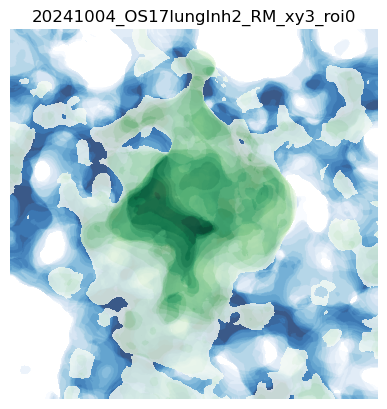

In [12]:
#create consensus surface masks and save to h5 ##ONLY RUN WHEN EVERYTHING IS DONE
for i in range(len(modelList_flat)): 
    h5filename=modelList_flat[i]
    sctm=trajectory.Trajectory(h5filename=h5filename)
    sctm.get_image_shape()
    print(f'{sctm.nmaskchannels}')
    cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
    nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
    mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
    sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
    fmsks=np.zeros((sctm.nz,sctm.nx,sctm.ny,sctm.nt)).astype(bool)
    for iS in range(sctm.nt):
        fmsks[...,iS]=sctm.get_fmask_data(iS,channel=3)    
    fmsk_cancer=np.median(fmsks,axis=3).astype(bool)
    fmsks=np.zeros((sctm.nz,sctm.nx,sctm.ny,sctm.nt)).astype(bool)
    for iS in range(sctm.nt):
        fmsks[...,iS]=sctm.get_fmask_data(iS,channel=2)    
    fmsk_lung=np.median(fmsks,axis=3).astype(bool)    
    sctm.fmsk_cancer=fmsk_cancer
    sctm.fmsk_lung=fmsk_lung
    sctm.save_to_h5(f'/cell_data_m{sctm.mskchannel}/',['fmsk_cancer','fmsk_lung'])
    clear_output(wait=True)
    plt.imshow(np.ma.masked_where(np.logical_not(np.max(fmsk_lung,axis=0)),np.sum(fmsk_lung,axis=0)),cmap=plt.cm.Blues,alpha=.8)
    plt.imshow(np.ma.masked_where(np.logical_not(np.max(fmsk_cancer,axis=0)),np.sum(fmsk_cancer,axis=0)),cmap=plt.cm.Greens,alpha=.8)
    plt.axis('off')
    plt.title(f'{sctm.figid.decode()}')
    plt.savefig(f'{date}/{sctm.figid.decode()}_consensus_surf.png')
    plt.show()

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5:/cell_data_m0/
/images/img_0/fmsk shape (15, 674, 638, 4)
/images/img_1/fmsk shape (15, 674, 638, 4)
/images/img_2/fmsk shape (15, 674, 638, 4)
/images/img_3/fmsk shape (15, 674, 638, 4)
/images/img_4/fmsk shape (15, 674, 638, 4)
/images/img_5/fmsk shape (15, 674, 638, 4)
/images/img_6/fmsk shape (15, 674, 638, 4)
/images/img_7/fmsk shape (15, 674, 638, 4)
/images/img_8/fmsk shape (15, 674, 638, 4)
/images/img_9/fmsk shape (15, 674, 638, 4)
/images/img_10/fmsk shape (15, 674, 638, 4)
/images/img_11/fmsk shape (15, 674, 638, 4)
/images/img_12/fmsk shape (15, 674, 638, 4)
/images/img_13/fmsk shape (15, 674, 638, 4)
/images

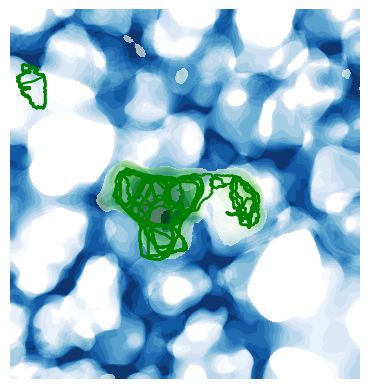

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5:/cell_data_m0/
/images/img_0/fmsk shape (15, 702, 678, 4)
/images/img_1/fmsk shape (15, 702, 678, 4)
/images/img_2/fmsk shape (15, 702, 678, 4)
/images/img_3/fmsk shape (15, 702, 678, 4)
/images/img_4/fmsk shape (15, 702, 678, 4)
/images/img_5/fmsk shape (15, 702, 678, 4)
/images/img_6/fmsk shape (15, 702, 678, 4)
/images/img_7/fmsk shape (15, 702, 678, 4)
/images/img_8/fmsk shape (15, 702, 678, 4)
/images/img_9/fmsk shape (15, 702, 678, 4)
/images/img_10/fmsk shape (15, 702, 678, 4)
/images/img_11/fmsk shape (15, 702, 678, 4)
/images/img_12/fmsk shape (15, 702, 678, 4)
/images/img_13/fmsk shape (15, 702, 678, 4)
/imag

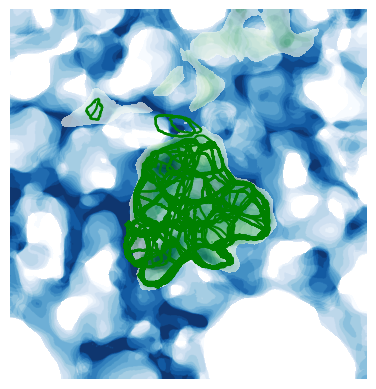

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5:/cell_data_m0/
/images/img_0/fmsk shape (15, 638, 662, 4)
/images/img_1/fmsk shape (15, 638, 662, 4)
/images/img_2/fmsk shape (15, 638, 662, 4)
/images/img_3/fmsk shape (15, 638, 662, 4)
/images/img_4/fmsk shape (15, 638, 662, 4)
/images/img_5/fmsk shape (15, 638, 662, 4)
/images/img_6/fmsk shape (15, 638, 662, 4)
/images/img_7/fmsk shape (15, 638, 662, 4)
/images/img_8/fmsk shape (15, 638, 662, 4)
/images/img_9/fmsk shape (15, 638, 662, 4)
/images/img_10/fmsk shape (15, 638, 662, 4)
/images/img_11/fmsk shape (15, 638, 662, 4)
/images/img_12/fmsk shape (15, 638, 662, 4)
/images/img_13/fmsk shape (15, 638, 662, 4)
/imag

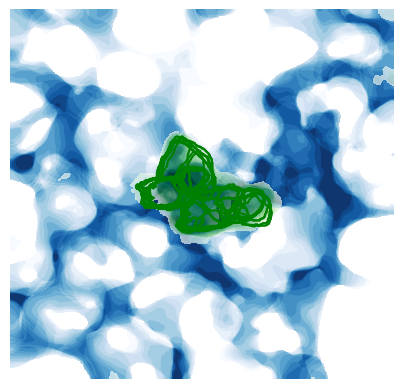

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5:/cell_data_m0/
/images/img_0/fmsk shape (15, 660, 688, 4)
/images/img_1/fmsk shape (15, 660, 688, 4)
/images/img_2/fmsk shape (15, 660, 688, 4)
/images/img_3/fmsk shape (15, 660, 688, 4)
/images/img_4/fmsk shape (15, 660, 688, 4)
/images/img_5/fmsk shape (15, 660, 688, 4)
/images/img_6/fmsk shape (15, 660, 688, 4)
/images/img_7/fmsk shape (15, 660, 688, 4)
/images/img_8/fmsk shape (15, 660, 688, 4)
/images/img_9/fmsk shape (15, 660, 688, 4)
/images/img_10/fmsk shape (15, 660, 688, 4)
/images/img_11/fmsk shape (15, 660, 688, 4)
/images/img_12/fmsk shape (15, 660, 688, 4)
/images/img_13/fmsk shape (15, 660, 688, 4)
/imag

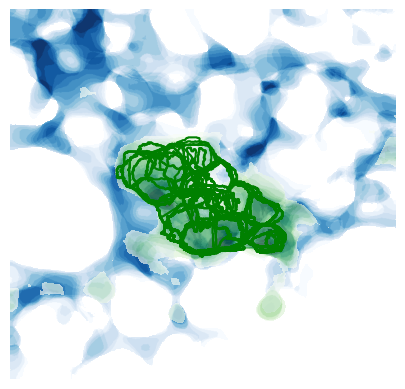

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5:/cell_data_m0/
/images/img_0/fmsk shape (15, 665, 704, 4)
/images/img_1/fmsk shape (15, 665, 704, 4)
/images/img_2/fmsk shape (15, 665, 704, 4)
/images/img_3/fmsk shape (15, 665, 704, 4)
/images/img_4/fmsk shape (15, 665, 704, 4)
/images/img_5/fmsk shape (15, 665, 704, 4)
/images/img_6/fmsk shape (15, 665, 704, 4)
/images/img_7/fmsk shape (15, 665, 704, 4)
/images/img_8/fmsk shape (15, 665, 704, 4)
/images/img_9/fmsk shape (15, 665, 704, 4)
/images/img_10/fmsk shape (15, 665, 704, 4)
/images/img_11/fmsk shape (15, 665, 704, 4)
/images/img_12/fmsk shape (15, 665, 704, 4)
/images/img_13/fmsk shape (15, 665, 704, 4)
/imag

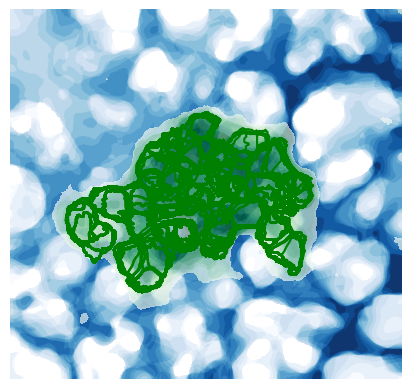

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5:/cell_data_m0/
/images/img_0/fmsk shape (15, 689, 685, 4)
/images/img_1/fmsk shape (15, 689, 685, 4)
/images/img_2/fmsk shape (15, 689, 685, 4)
/images/img_3/fmsk shape (15, 689, 685, 4)
/images/img_4/fmsk shape (15, 689, 685, 4)
/images/img_5/fmsk shape (15, 689, 685, 4)
/images/img_6/fmsk shape (15, 689, 685, 4)
/images/img_7/fmsk shape (15, 689, 685, 4)
/images/img_8/fmsk shape (15, 689, 685, 4)
/images/img_9/fmsk shape (15, 689, 685, 4)
/images/img_10/fmsk shape (15, 689, 685, 4)
/images/img_11/fmsk shape (15, 689, 685, 4)
/images/img_12/fmsk shape (15, 689, 685, 4)
/images/img_13/fmsk shape (15, 689, 685, 4)
/images

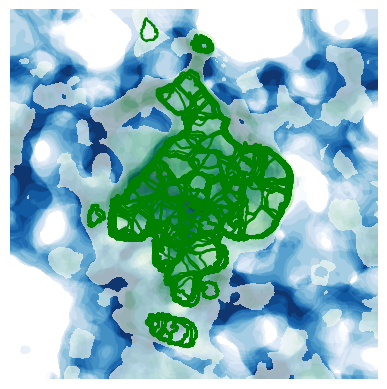

In [13]:
#create consensus surface masks and save to h5 ##ONLY RUN WHEN EVERYTHING IS DONE
for i in range(len(modelList_flat)): 
    h5filename=modelList_flat[i]
    sctm=trajectory.Trajectory(h5filename=h5filename)
    sctm.get_image_shape()
    print(f'{sctm.nmaskchannels}')
    cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
    nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
    mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
    sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
    plt.figure()
    for iS in range(sctm.nt):
        fstr=f'/images/img_{iS}/fmsk'
        with h5py.File(h5filename,'r+') as h:
            fmsk_df=h[fstr]
            print(f'{fstr} shape {fmsk_df[...].shape}')
            fmsks=fmsk_df[...]  
            fmsks_set=np.concatenate((fmsks,sctm.fmsk_lung[...,np.newaxis],sctm.fmsk_cancer[...,np.newaxis]),axis=3)
            del h[fstr]
            h[fstr]=fmsks_set
        if iS%20==0:
            msk=sctm.get_mask_data(iS)
            #plt.imshow(np.ma.masked_where(np.logical_not(np.max(fmsks[...,2],axis=0)),np.sum(fmsks[...,2],axis=0)),cmap=plt.cm.Purples,alpha=.5)
            plt.imshow(np.ma.masked_where(np.logical_not(np.max(sctm.fmsk_lung,axis=0)),np.sum(sctm.fmsk_lung,axis=0)),cmap=plt.cm.Blues,alpha=.5)
            plt.imshow(np.ma.masked_where(np.logical_not(np.max(sctm.fmsk_cancer,axis=0)),np.sum(sctm.fmsk_cancer,axis=0)),cmap=plt.cm.Greens,alpha=.5)
            #plt.imshow(np.ma.masked_where(np.logical_not(np.max(fmsks[...,3],axis=0)),np.sum(fmsks[...,3],axis=0)),cmap=plt.cm.Wistia,alpha=.5)
            plt.contour(np.max(msk[...,0],axis=0),levels=np.unique(np.max(msk[...,0],axis=0)),colors='green')
            plt.axis('off')
    plt.savefig(f'{date}/{sctm.figid}_cyto_consensus_surf.png')
    plt.show()

In [15]:
indbad_surf=np.array([]).astype(int)
indgood_surf=np.setdiff1d(np.arange(len(modelList_flat)).astype(int),indbad_surf)

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5:/cell_data_m0/
Extracting boundary library from frame 0
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.00
cell 1 state 4 contact fraction 0.85
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.06
cell 2 state 4 contact fraction 0.94
cell 3 state 1 contact fraction 0.69
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.31
cell 4 state 1 contact fraction 0.50
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.44
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.68
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.24
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


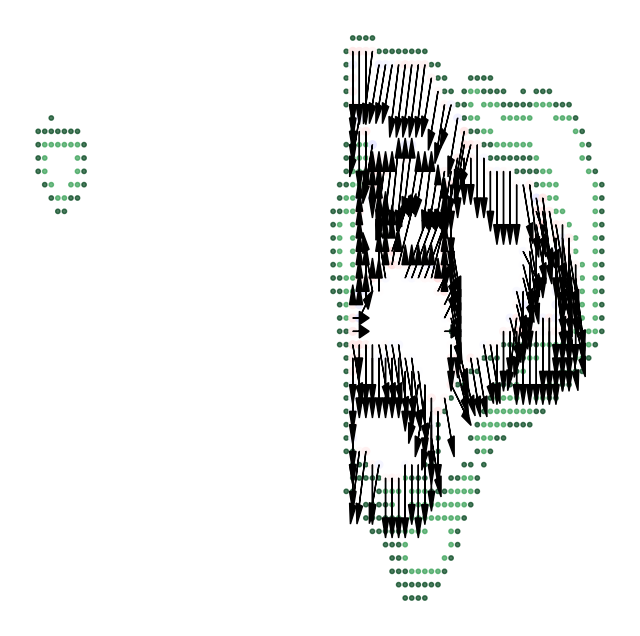

Extracting boundary library from frame 1
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1887
label 2, pixels 3296
label 3, pixels 318
label 4, pixels 2508
label 5, pixels 1186
label 6, pixels 1099
label 8, pixels 8345
label 9, pixels 878485
cell 1 state 1 contact fraction 0.12
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 state 4 contact fraction 0.85
cell 2 state 1 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.59
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.93
cell 4 state 1 contact fraction 0.45
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.65
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


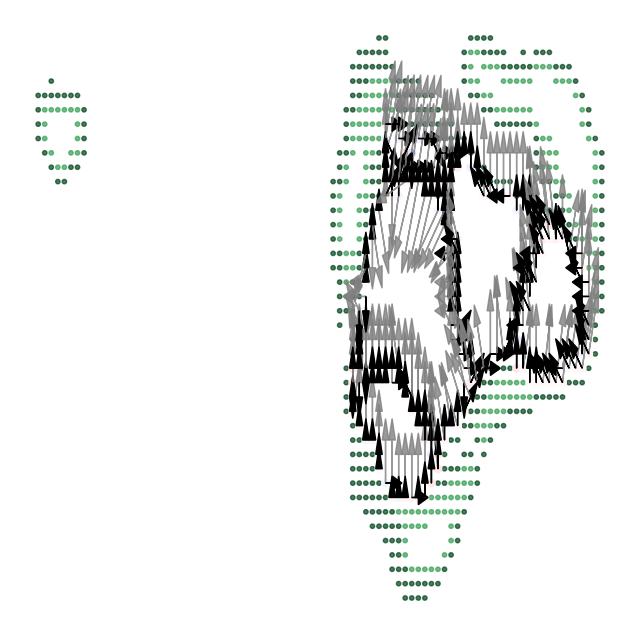

Extracting boundary library from frame 2
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1830
label 2, pixels 285
label 3, pixels 2420
label 4, pixels 3542
label 5, pixels 1200
label 6, pixels 1066
label 8, pixels 8453
label 9, pixels 878328
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.01
cell 1 state 4 contact fraction 0.85
cell 2 state 1 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.66
cell 4 state 1 contact fraction 0.45
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.63
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.58


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


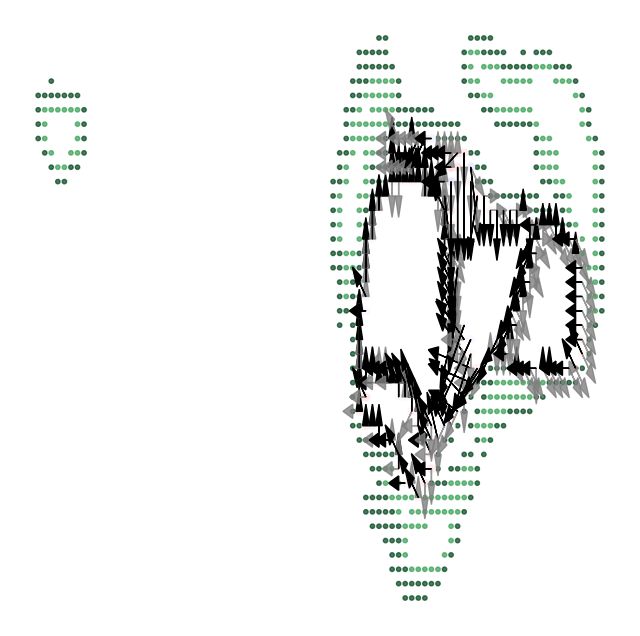

Extracting boundary library from frame 3
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 1826
label 2, pixels 88
adjusted knn: 17 npts: 71
label 3, pixels 171
label 4, pixels 3108
label 5, pixels 624
label 6, pixels 2348
label 7, pixels 96
label 8, pixels 66
adjusted knn: 16 npts: 65
label 9,

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.56
cell 5 state 1 contact fraction 0.66
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.63
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.28
cell 8 state 1 contact fraction 0.94
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.06
cell 9 state 1 contact fraction 0.35
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.01
cell 9 state 4 contact fraction 0.65
cell 10 state 1 contact fraction 0.35
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.16
cell 10 state 4 contact fraction 0.49


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


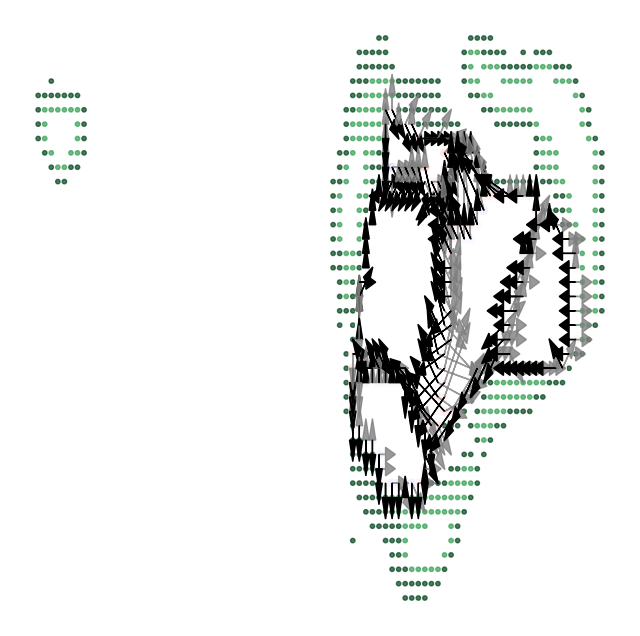

Extracting boundary library from frame 4
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2007
label 2, pixels 303
label 3, pixels 106
label 4, pixels 98
label 5, pixels 2480
label 6, pixels 3352
label 7, pixels 1281
label 8, pixels 1181
label 10, pixels 8297
label 11, pixels 878019
cell 1 state 1 contact fraction 0.15
cell 1 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.81
cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.92
cell 3 state 1 contact fraction 0.58
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.41
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.93
cell 5 state 1 contact fraction 0.48
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.34
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.36
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


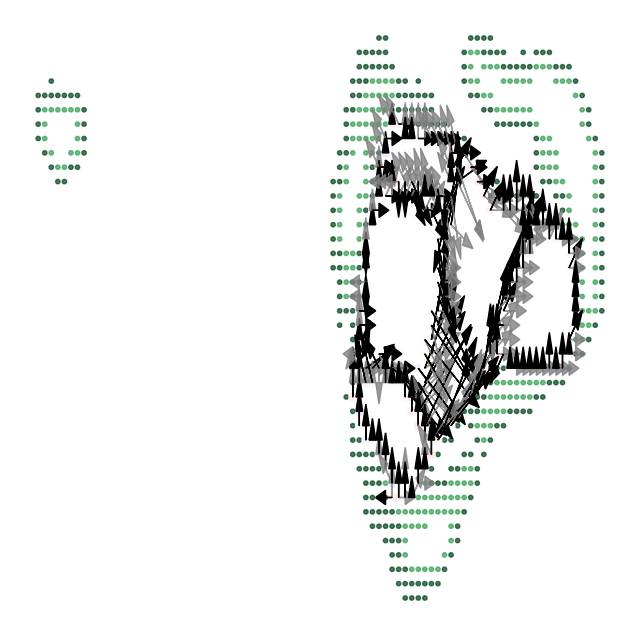

Extracting boundary library from frame 5
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2228
label 2, pixels 220
label 3, pixels 92
label 4, pixels 3007
label 5, pixels 2363
label 6, pixels 1347
label 7, pixels 1310
label 9, pixels 8372
label 10, pixels 878185
cell 1 state 1 contact fraction 0.17
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.04
cell 1 s

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.92
cell 3 state 1 contact fraction 0.71
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.26
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.51
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.57


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


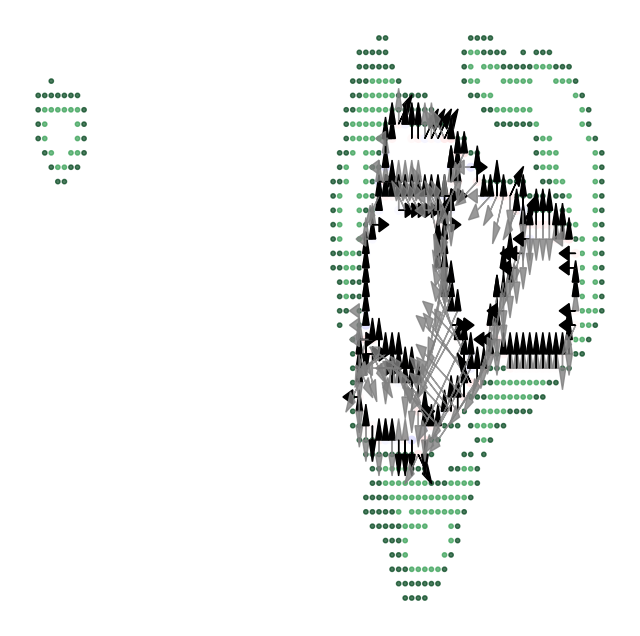

Extracting boundary library from frame 6
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 70
adjusted knn: 16 npts: 66
label 2, pixels 2228
label 3, pixels 65
adjusted knn: 15 npts: 63
label 4, pixels 404
label 5, pixels 2985
label 6, pixels 2437
label 7, pixels 1358
label 8, pixels 1354
label 10, pixels 8378
label 11, pixels 877845
cell 1 state 1 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.69
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.53


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


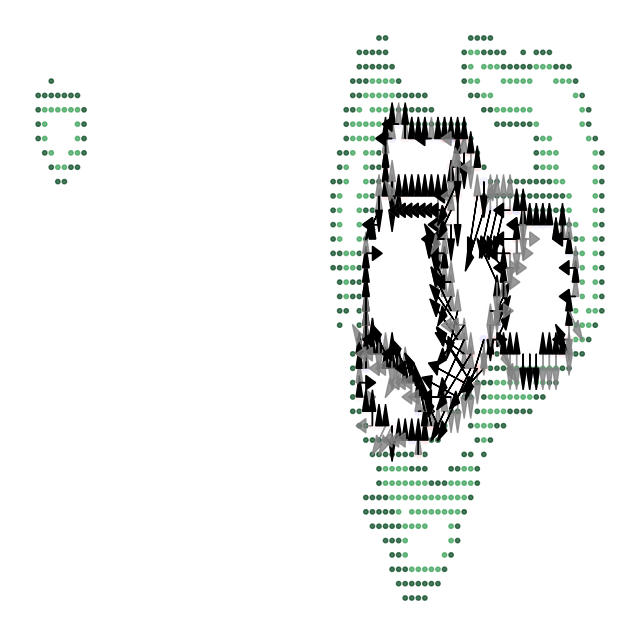

Extracting boundary library from frame 7
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2158
label 2, pixels 236
label 3, pixels 91
label 4, pixels 2319
label 5, pixels 1942
label 6, pixels 1113
label 7, pixels 1361
label 8, pixels 1236
label 10, pixels 8459
label 11, pixels 878209
cell 1 state 1 contact fraction 0.15
cell 1 state 2 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.59
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.69
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.50


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


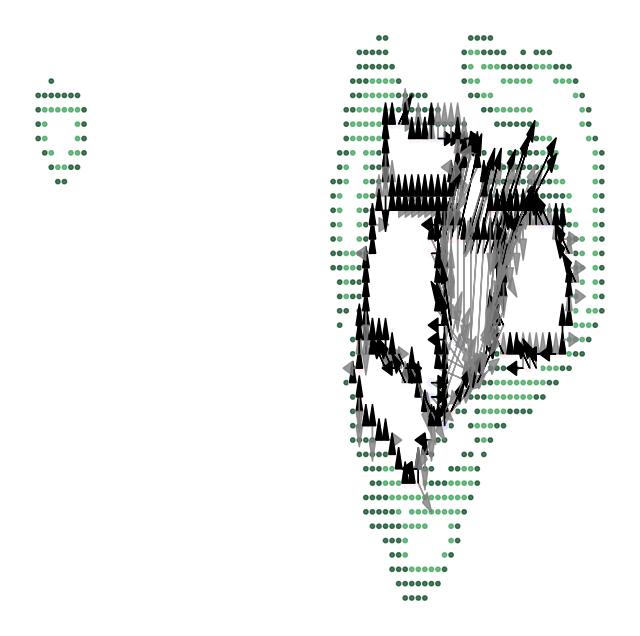

Extracting boundary library from frame 8
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 144
label 2, pixels 2291
label 3, pixels 71
adjusted knn: 17 npts: 68
label 4, pixels 288
label 5, pixels 76
adjusted knn: 17 npts: 71
label 6, pixels 2325
label 7, pixels 3128
label 8, pixels 1373
label 9, pixels 1362
label 11, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.47
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.50
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.29
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.69
cell 9 state 1 contact fraction 0.45
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.08
cell 9 state 4 contact fraction 0.48


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


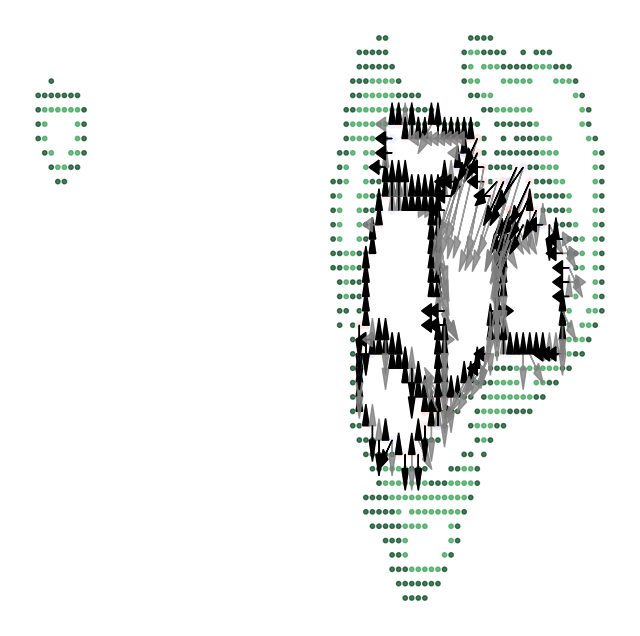

Extracting boundary library from frame 9
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 175
label 2, pixels 2085
label 3, pixels 342
label 4, pixels 2339
label 5, pixels 2880
label 6, pixels 1322
label 7, pixels 1301
label 8, pixels 193
label 10, pixels 8452
label 11, pixels 878035
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.70
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.63
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.32


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


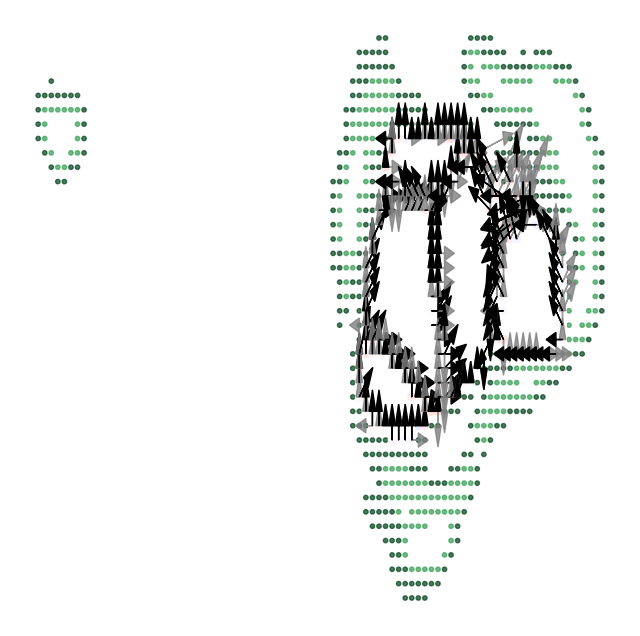

Extracting boundary library from frame 10
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 120
label 2, pixels 2188
label 3, pixels 218
label 4, pixels 2435
label 5, pixels 2500
label 6, pixels 1362
label 7, pixels 1529
label 8, pixels 327
label 10, pixels 8593
label 11, pixels 877852
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.83
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.60
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.59
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.33


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


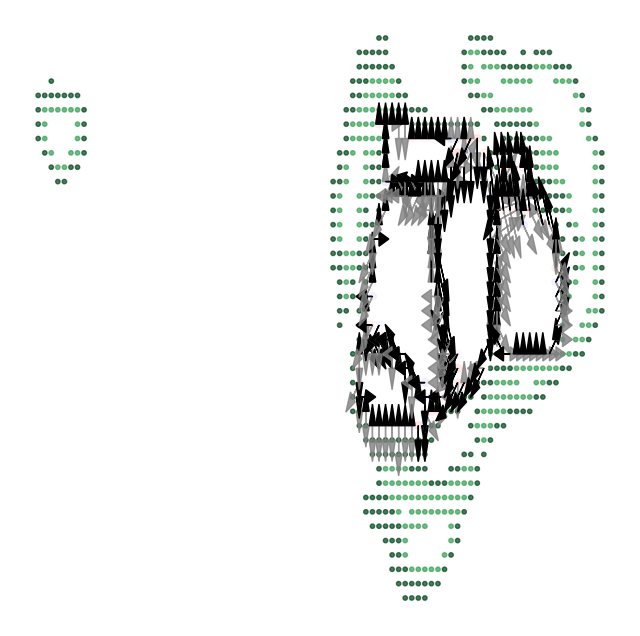

Extracting boundary library from frame 11
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 210
label 2, pixels 2081
label 3, pixels 354
label 4, pixels 2576
label 5, pixels 2443
label 6, pixels 1230
label 7, pixels 1985
label 9, pixels 8418
label 10, pixels 877827
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.15
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.84
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.97
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.71
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.55


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


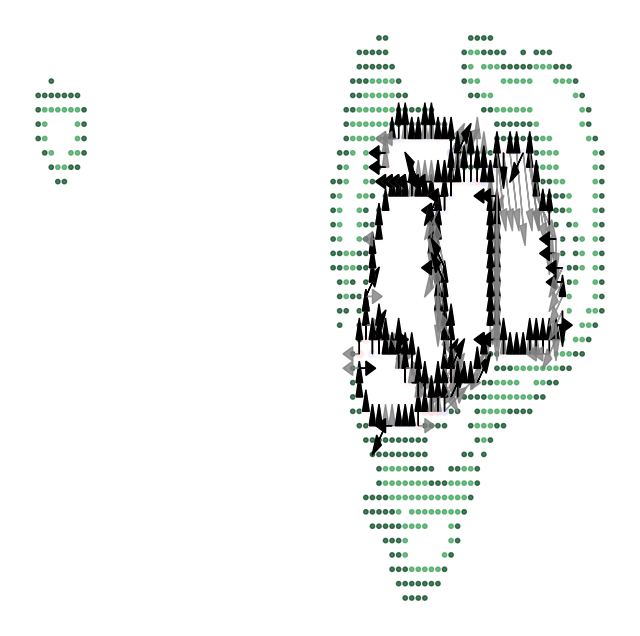

Extracting boundary library from frame 12
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 217
label 2, pixels 2222
label 3, pixels 141
label 4, pixels 437
label 5, pixels 2519
label 6, pixels 2258
label 7, pixels 2078
label 8, pixels 1333
label 10, pixels 8335
label 11, pixels 877584
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.85
cell 3 state 1 contact fraction 0.09
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.91
cell 4 state 1 contact fraction 0.27
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.70
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.27
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


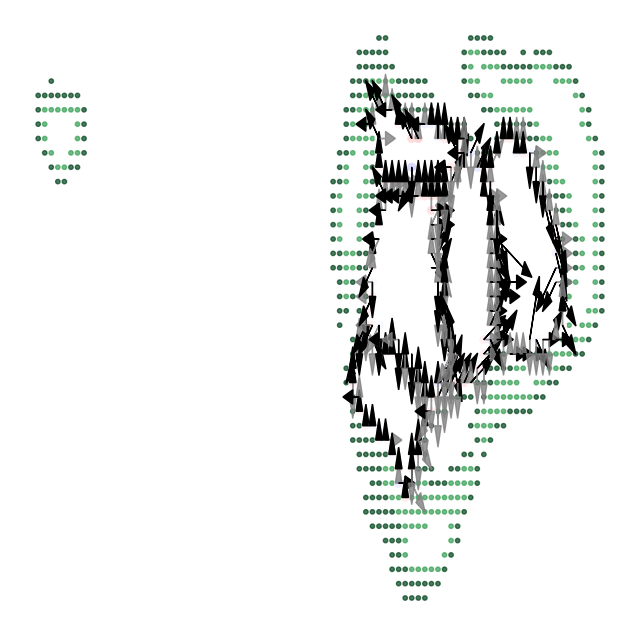

Extracting boundary library from frame 13
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 185
label 2, pixels 2127
label 3, pixels 437
label 4, pixels 2608
label 5, pixels 2312
label 6, pixels 1259
label 7, pixels 1306
label 8, pixels 607
label 10, pixels 8328
label 11, pixels 877955
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.85
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.95
cell 4 state 1 contact fraction 0.44
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.60
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.37
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.73
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.10
cell 8 state 4 contact fraction 0.17


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


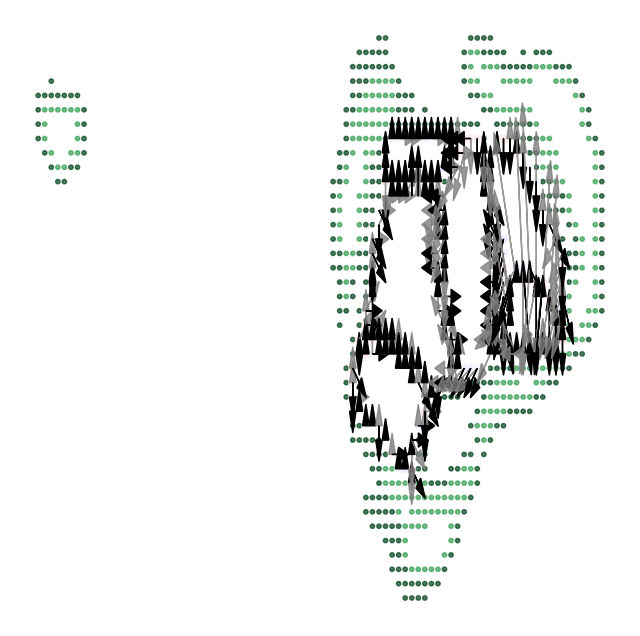

Extracting boundary library from frame 14
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 169
label 2, pixels 90
label 3, pixels 2009
label 4, pixels 95
label 5, pixels 340
label 6, pixels 2511
label 7, pixels 2382
label 8, pixels 1304
label 9, pixels 2102
label 11, pixels 8374
label 12, pixels 877748
cell 1 state 1 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.45
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.69
cell 9 state 1 contact fraction 0.35
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
cell 9 state 4 contact fraction 0.59


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


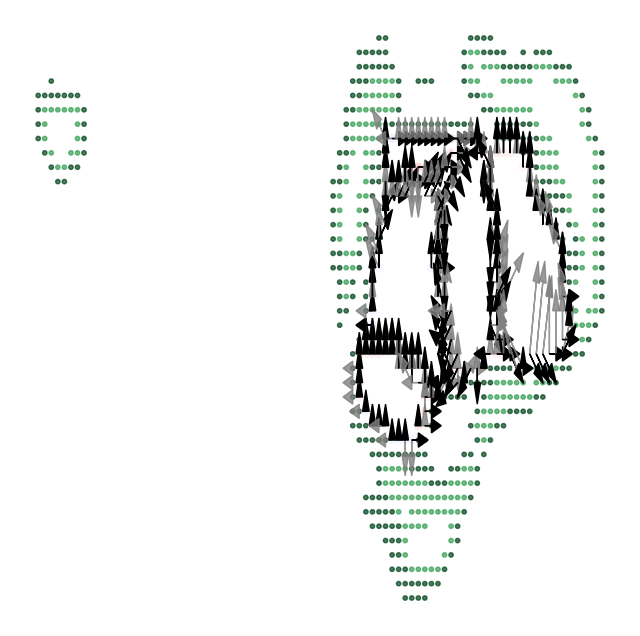

Extracting boundary library from frame 15
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 162
label 2, pixels 2138
label 3, pixels 386
label 4, pixels 2595
label 5, pixels 2406
label 6, pixels 2041
label 7, pixels 1397
label 9, pixels 8493
label 10, pixels 877506
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.16
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


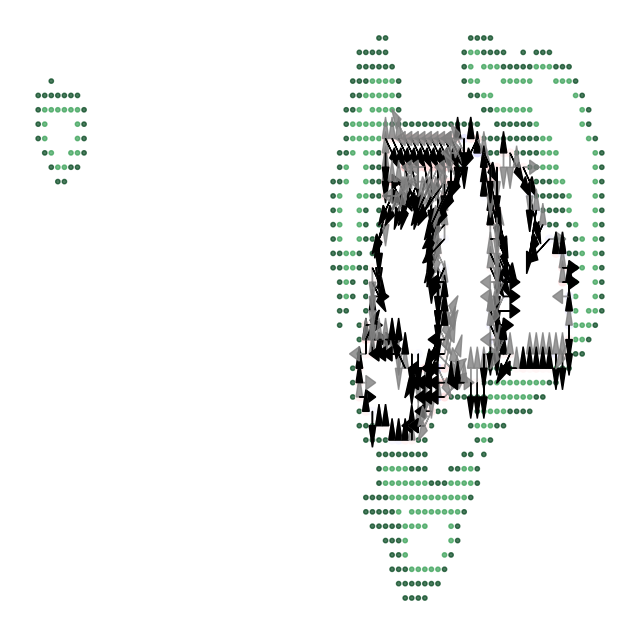

Extracting boundary library from frame 16
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 204
label 2, pixels 2451
label 3, pixels 564
label 4, pixels 1616
label 5, pixels 3190
label 6, pixels 870
label 7, pixels 1319
label 8, pixels 1101
label 10, pixels 8297
label 11, pixels 877512
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.81
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.98
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.70
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.51


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


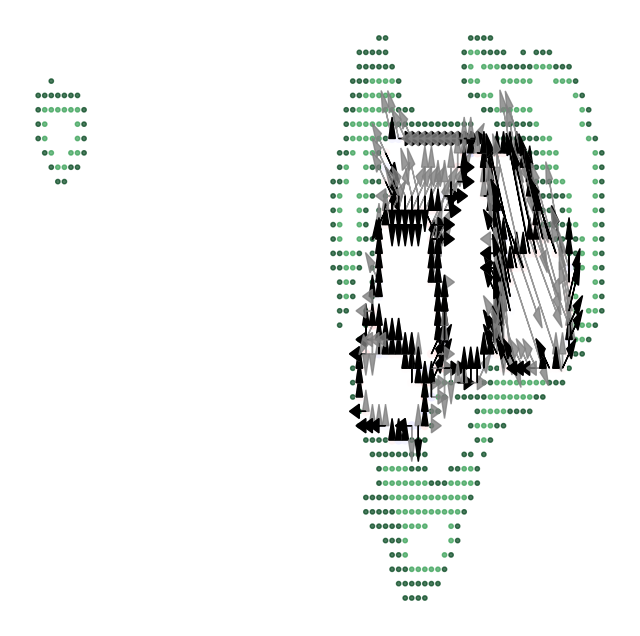

Extracting boundary library from frame 17
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 170
label 2, pixels 2501
label 3, pixels 566
label 4, pixels 1561
label 5, pixels 2850
label 6, pixels 2046
label 7, pixels 1396
label 9, pixels 8553
label 10, pixels 877481
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.16
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.08
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.90
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


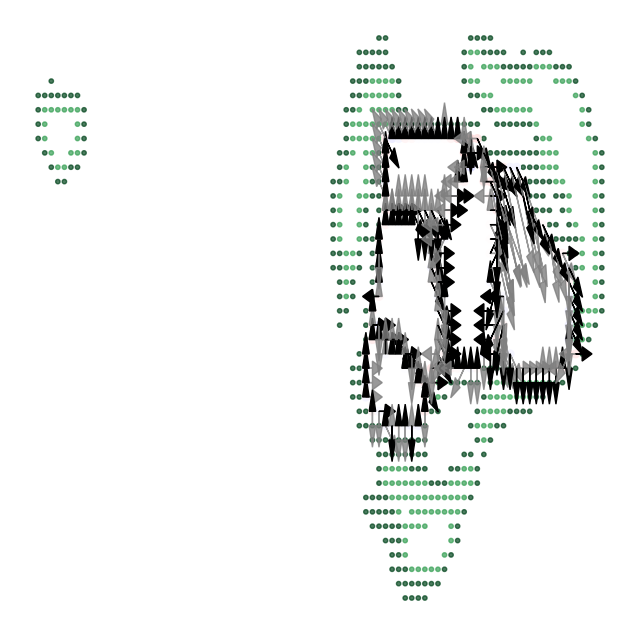

Extracting boundary library from frame 18
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 84
adjusted knn: 18 npts: 73
label 2, pixels 2545
label 3, pixels 97
label 4, pixels 122
label 5, pixels 1752
label 6, pixels 77
adjusted knn: 16 npts: 65
label 7, pixels 2417
label 8, pixels 2274
label 9, pixels 1387
label 11, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.96
cell 2 state 1 contact fraction 0.21
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.77
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.40
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.62
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


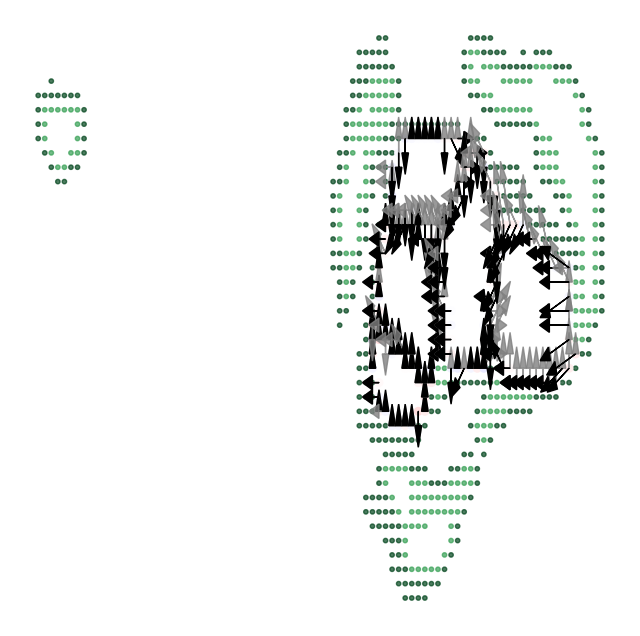

Extracting boundary library from frame 19
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 104
label 2, pixels 2662
label 3, pixels 93
label 4, pixels 82
label 5, pixels 1435
label 6, pixels 2468
label 7, pixels 109
label 8, pixels 1839
label 9, pixels 1330
label 10, pixels 368
label 12, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.61
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.57
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.55
cell 9 state 1 contact fraction 0.29
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.03
cell 9 state 4 contact fraction 0.68
cell 10 state 1 contact fraction 0.60
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.03
cell 10 state 4 contact fraction 0.38


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


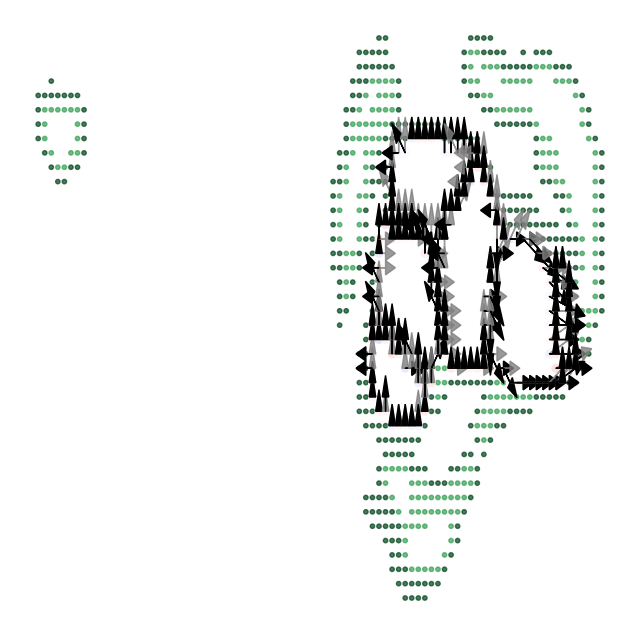

Extracting boundary library from frame 20
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 94
label 2, pixels 60
adjusted knn: 11 npts: 47
label 3, pixels 2844
label 4, pixels 493
label 5, pixels 1365
label 6, pixels 2639
label 7, pixels 2098
label 8, pixels 1521
label 10, pixels 8567
label 11, pixels 877443
cell 1 state 1 contact fraction 0.00
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.75
cell 4 state 1 contact fraction 0.06
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.93
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


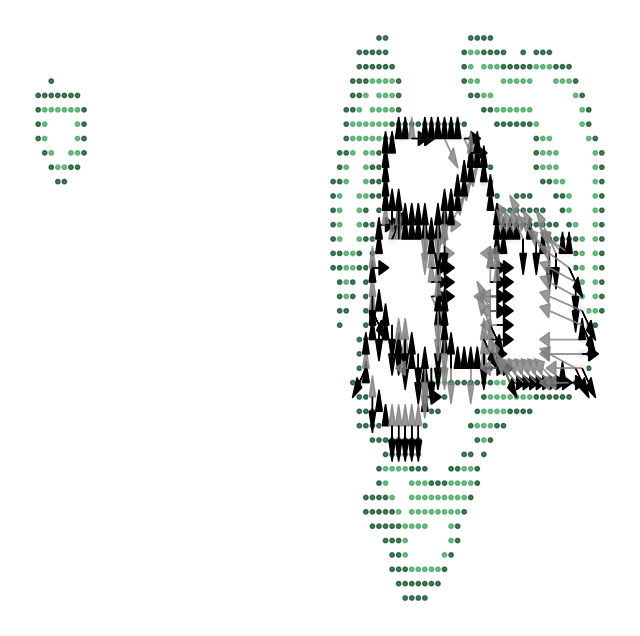

Extracting boundary library from frame 21
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2613
label 2, pixels 62
adjusted knn: 14 npts: 59
label 3, pixels 1569
label 4, pixels 114
label 5, pixels 2678
label 6, pixels 1460
label 7, pixels 2040
label 9, pixels 8776
label 10, pixels 877812
cell 1 state 1 contact fraction 0.24
cell 1 state 2 contact fraction 0.00
cell 1 state 3 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 1.00
cell 3 state 1 contact fraction 0.54
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.59
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.70
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


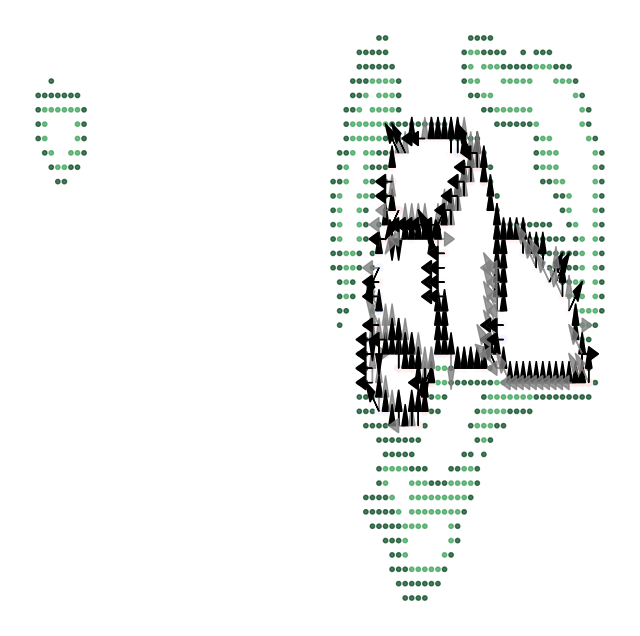

Extracting boundary library from frame 22
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 104
label 2, pixels 482
label 3, pixels 2613
label 4, pixels 1410
label 5, pixels 2900
label 6, pixels 2087
label 7, pixels 1460
label 9, pixels 8633
label 10, pixels 877435
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.06
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.21
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.76
cell 4 state 1 contact fraction 0.54
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


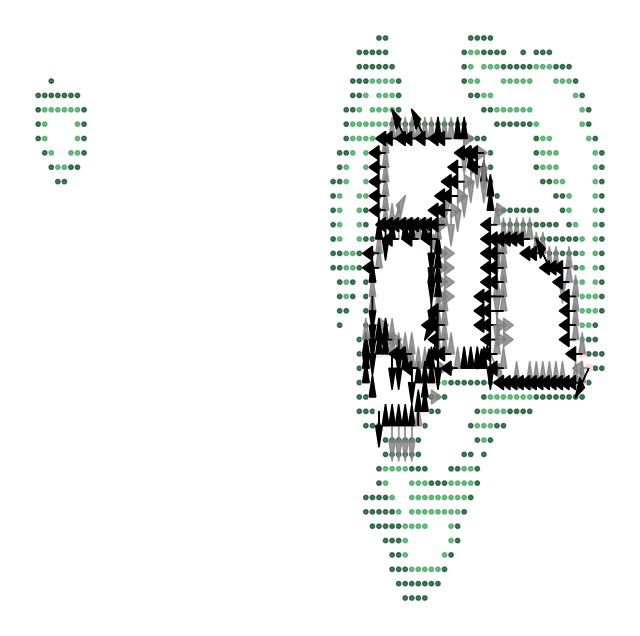

Extracting boundary library from frame 23
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 83
adjusted knn: 18 npts: 74
label 2, pixels 76
adjusted knn: 14 npts: 57
label 3, pixels 2541
label 4, pixels 514
label 5, pixels 1532
label 6, pixels 2688
label 7, pixels 2294
label 8, pixels 1431
label 10, pixels 8504
label 11, pixels 877461
cell 1 state 1 co

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.67
cell 8 state 1 contact fraction 0.29
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


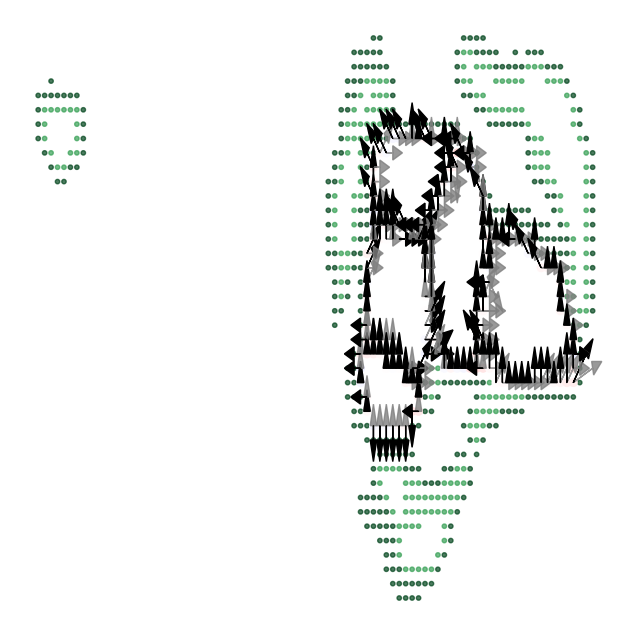

Extracting boundary library from frame 24
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 101
label 2, pixels 2477
label 3, pixels 652
label 4, pixels 2002
label 5, pixels 2388
label 6, pixels 1523
label 7, pixels 2273
label 9, pixels 8529
label 10, pixels 877179
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.18
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.83
cell 3 state 1 contact fraction 0.07
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.91
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.72
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


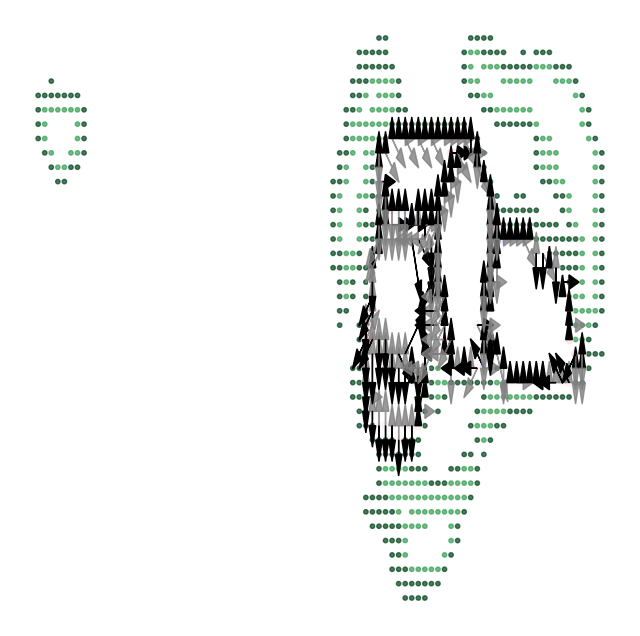

Extracting boundary library from frame 25
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2409
label 2, pixels 479
label 3, pixels 1440
label 4, pixels 1033
label 5, pixels 2219
label 6, pixels 1321
label 7, pixels 2226
label 9, pixels 8677
label 10, pixels 877320
cell 1 state 1 contact fraction 0.17
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.98
cell 3 state 1 contact fraction 0.54
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.38
cell 4 state 1 contact fraction 0.88
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.11
cell 5 state 1 contact fraction 0.59
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


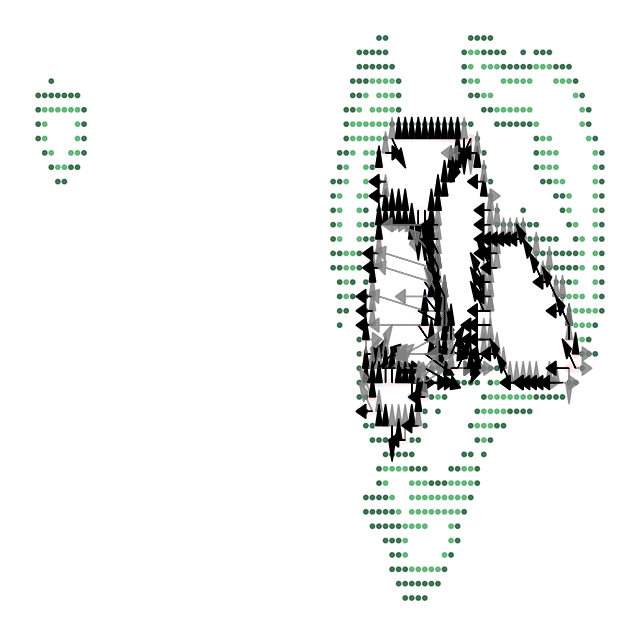

Extracting boundary library from frame 26
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 117
label 2, pixels 2441
label 3, pixels 556
label 4, pixels 2668
label 5, pixels 1881
label 6, pixels 1558
label 7, pixels 2428
label 9, pixels 8331
label 10, pixels 877144
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.16
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.04
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.96
cell 4 state 1 contact fraction 0.46
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.66
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


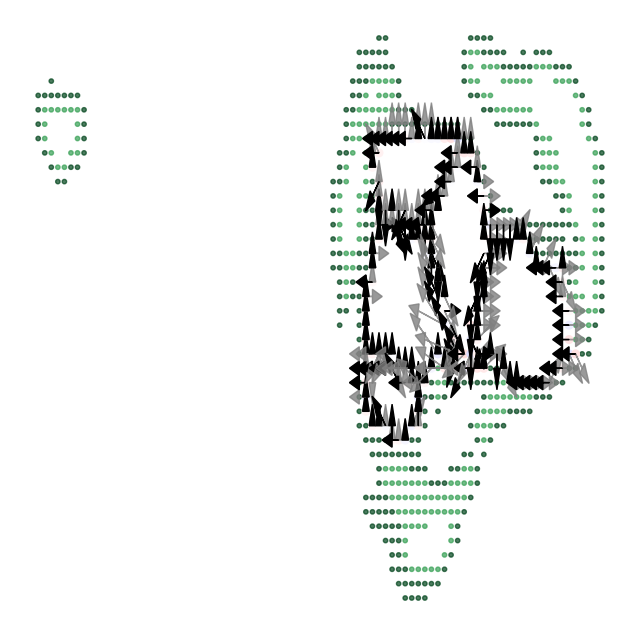

Extracting boundary library from frame 27
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 121
label 2, pixels 76
adjusted knn: 14 npts: 57
label 3, pixels 2476
label 4, pixels 642
label 5, pixels 2479
label 6, pixels 2009
label 7, pixels 1563
label 8, pixels 2296
label 10, pixels 8357
label 11, pixels 877105
cell 1 state 1 contact fraction 0.00
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02


KeyboardInterrupt: 

In [16]:
#boundary library test  ##ONLY RUN WHEN EVERYTHING IS DONE
h5filename=modelList_flat[indgood_surf[0]]
sctm=trajectory.Trajectory(h5filename=h5filename)
sctm.get_image_shape()
print(f'{sctm.nmaskchannels}')
cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
boundary_library=sctm.get_cellboundary_library(surface_fmask_channels=[4,5],border_resolution=1.33,visual=True,save_h5=False,overwrite=False) #channels 4 and 5 where we put consensus surface

In [17]:
def get_boundarylibrary(h5filename):  ##ONLY RUN WHEN EVERYTHING IS DONE
    sctm=trajectory.Trajectory(h5filename=h5filename)
    sctm.get_image_shape()
    print(f'{sctm.nmaskchannels}')
    cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
    nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
    foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
    nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
    mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
    sctm.load_from_h5(f'/cell_data_m{sctm.mskchannel}/')
    boundary_library=sctm.get_cellboundary_library(surface_fmask_channels=[4,5],border_resolution=1.33,visual=False,save_h5=True,overwrite=True) #channels 4 and 5 where we put consensus surface

In [18]:
results = [get_boundarylibrary(h5filename) for h5filename in np.array(modelList_flat)[indgood_surf]]

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
1
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5:/cell_data_m0/
Extracting boundary library from frame 0
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.00
cell 1 state 4 contact fraction 0.85
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.06
cell 2 state 4 contact fraction 0.94
cell 3 state 1 contact fraction 0.69
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.31
cell 4 state 1 contact fraction 0.50
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.44
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.68
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.24
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 1
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1887
label 2, pixels 3296
label 3, pixels 318
label 4, pixels 2508
label 5, pixels 1186
label 6, pixels 1099
label 8, pixels 8345
label 9, pixels 878485
cell 1 state 1 contact fraction 0.12
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 state 4 contact fraction 0.85


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.37
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.04
cell 2 state 4 contact fraction 0.59
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.93
cell 4 state 1 contact fraction 0.45
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.65
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 2
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1830
label 2, pixels 285
label 3, pixels 2420
label 4, pixels 3542
label 5, pixels 1200
label 6, pixels 1066
label 8, pixels 8453
label 9, pixels 878328
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.01
cell 1 state 4 contact fraction 0.85
cell 2 state 1 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.66
cell 4 state 1 contact fraction 0.45
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.63
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.58


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 3
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 1826
label 2, pixels 88
adjusted knn: 17 npts: 71
label 3, pixels 171
label 4, pixels 3108
label 5, pixels 624
label 6, pixels 2348
label 7, pixels 96
label 8, pixels 66
adjusted knn: 16 npts: 65
label 9,

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 1.00
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.94
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.56
cell 5 state 1 contact fraction 0.66
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.63
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.28
cell 8 state 1 contact fraction 0.94
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 4
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2007
label 2, pixels 303
label 3, pixels 106
label 4, pixels 98
label 5, pixels 2480
label 6, pixels 3352
label 7, pixels 1281
label 8, pixels 1181
label 10, pixels 8297
label 11, pixels 878019
cell 1 state 1 contact fraction 0.15


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 state 4 contact fraction 0.81
cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.92
cell 3 state 1 contact fraction 0.58
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.41
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.93
cell 5 state 1 contact fraction 0.48
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.34
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.64
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 5
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2228
label 2, pixels 220
label 3, pixels 92
label 4, pixels 3007
label 5, pixels 2363
label 6, pixels 1347
label 7, pixels 1310
label 9, pixels 8372
label 10, pixels 878185
cell 1 state 1 contact fraction 0.17
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.04
cell 1 s

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.92
cell 3 state 1 contact fraction 0.71
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.26
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.51
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.57


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 6
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 70
adjusted knn: 16 npts: 66
label 2, pixels 2228
label 3, pixels 65
adjusted knn: 15 npts: 63
label 4, pixels 404
label 5, pixels 2985
label 6, pixels 2437
label 7, pixels 1358
label 8, pixels 1354
label 10, pixels 8378
label 11, pixels 877845
cell 1 state 1 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.81
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.16
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.78
cell 5 state 1 contact fraction 0.42
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.69
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.53


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 7
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2158
label 2, pixels 236
label 3, pixels 91
label 4, pixels 2319
label 5, pixels 1942
label 6, pixels 1113
label 7, pixels 1361
label 8, pixels 1236
label 10, pixels 8459
label 11, pixels 878209
cell 1 state 1 contact fraction 0.15
cell 1 state 2 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 3 contact fraction 0.04
cell 1 state 4 contact fraction 0.82
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.97
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.12
cell 3 state 4 contact fraction 0.88
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.59
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.69
cell 8 state 1 contact fraction 0.42
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 8
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 144
label 2, pixels 2291
label 3, pixels 71
adjusted knn: 17 npts: 68
label 4, pixels 288
label 5, pixels 76
adjusted knn: 17 npts: 71
label 6, pixels 2325
label 7, pixels 3128
label 8, pixels 1373
label 9, pixels 1362
label 11, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.47
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.50
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.29
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.69
cell 9 state 1 contact fraction 0.45
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.08
cell 9 state 4 contact fraction 0.48


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 9
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 175
label 2, pixels 2085
label 3, pixels 342
label 4, pixels 2339
label 5, pixels 2880
label 6, pixels 1322
label 7, pixels 1301
label 8, pixels 193
label 10, pixels 8452
label 11, pixels 878035
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.84
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.96
cell 4 state 1 contact fraction 0.44
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.70
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.63
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.32


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 10
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 120
label 2, pixels 2188
label 3, pixels 218
label 4, pixels 2435
label 5, pixels 2500
label 6, pixels 1362
label 7, pixels 1529
label 8, pixels 327
label 10, pixels 8593
label 11, pixels 877852
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.83
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.60
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.59
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.33


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 11
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 210
label 2, pixels 2081
label 3, pixels 354
label 4, pixels 2576
label 5, pixels 2443
label 6, pixels 1230
label 7, pixels 1985
label 9, pixels 8418
label 10, pixels 877827
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.15
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.97
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.71
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.55


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 12
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 217
label 2, pixels 2222
label 3, pixels 141
label 4, pixels 437
label 5, pixels 2519
label 6, pixels 2258
label 7, pixels 2078
label 8, pixels 1333
label 10, pixels 8335
label 11, pixels 877584
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.85
cell 3 state 1 contact fraction 0.09
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.91
cell 4 state 1 contact fraction 0.27
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.70
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.27
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 13
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 185
label 2, pixels 2127
label 3, pixels 437
label 4, pixels 2608
label 5, pixels 2312
label 6, pixels 1259
label 7, pixels 1306
label 8, pixels 607
label 10, pixels 8328
label 11, pixels 877955
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.60
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.37
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.73
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.10
cell 8 state 4 contact fraction 0.17


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 14
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 169
label 2, pixels 90
label 3, pixels 2009
label 4, pixels 95
label 5, pixels 340
label 6, pixels 2511
label 7, pixels 2382
label 8, pixels 1304
label 9, pixels 2102
label 11, pixels 8374
label 12, pixels 877748
cell 1 state 1 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.45
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.69
cell 9 state 1 contact fraction 0.35
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
cell 9 state 4 contact fraction 0.59


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 15
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 162
label 2, pixels 2138
label 3, pixels 386
label 4, pixels 2595
label 5, pixels 2406
label 6, pixels 2041
label 7, pixels 1397
label 9, pixels 8493
label 10, pixels 877506
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.16
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.04
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.93
cell 4 state 1 contact fraction 0.53
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 16
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 204
label 2, pixels 2451
label 3, pixels 564
label 4, pixels 1616
label 5, pixels 3190
label 6, pixels 870
label 7, pixels 1319
label 8, pixels 1101
label 10, pixels 8297
label 11, pixels 877512
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.70
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.51


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 17
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 170
label 2, pixels 2501
label 3, pixels 566
label 4, pixels 1561
label 5, pixels 2850
label 6, pixels 2046
label 7, pixels 1396
label 9, pixels 8553
label 10, pixels 877481
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.16
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.08
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.90
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 18
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 84
adjusted knn: 18 npts: 73
label 2, pixels 2545
label 3, pixels 97
label 4, pixels 122
label 5, pixels 1752
label 6, pixels 77
adjusted knn: 16 npts: 65
label 7, pixels 2417
label 8, pixels 2274
label 9, pixels 1387
label 11, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.40
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.62
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.64
cell 9 state 1 contact fraction 0.26
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.02
cell 9 state 4 contact fraction 0.72


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 19
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 104
label 2, pixels 2662
label 3, pixels 93
label 4, pixels 82
label 5, pixels 1435
label 6, pixels 2468
label 7, pixels 109
label 8, pixels 1839
label 9, pixels 1330
label 10, pixels 368
label 12, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.66
cell 5 state 1 contact fraction 0.53
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.61
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.57
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.55
cell 9 state 1 contact fraction 0.29
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.03
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 20
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 94
label 2, pixels 60
adjusted knn: 11 npts: 47
label 3, pixels 2844
label 4, pixels 493
label 5, pixels 1365
label 6, pixels 2639
label 7, pixels 2098
label 8, pixels 1521
label 10, pixels 8567
label 11, pixels 877443
cell 1 state 1 contact fraction 0.00
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.75
cell 4 state 1 contact fraction 0.06
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.93
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 21
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2613
label 2, pixels 62
adjusted knn: 14 npts: 59
label 3, pixels 1569
label 4, pixels 114
label 5, pixels 2678
label 6, pixels 1460
label 7, pixels 2040
label 9, pixels 8776
label 10, pixels 877812
cell 1 state 1 contact fraction 0.24
cell 1 state 2 contact fraction 0.00
cell 1 state 3 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 1.00
cell 3 state 1 contact fraction 0.54
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.59
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.70
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 22
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 104
label 2, pixels 482
label 3, pixels 2613
label 4, pixels 1410
label 5, pixels 2900
label 6, pixels 2087
label 7, pixels 1460
label 9, pixels 8633
label 10, pixels 877435
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.06
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.76
cell 4 state 1 contact fraction 0.54
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 23
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 83
adjusted knn: 18 npts: 74
label 2, pixels 76
adjusted knn: 14 npts: 57
label 3, pixels 2541
label 4, pixels 514
label 5, pixels 1532
label 6, pixels 2688
label 7, pixels 2294
label 8, pixels 1431
label 10, pixels 8504
label 11, pixels 877461
cell 1 state 1 co

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.79
cell 4 state 1 contact fraction 0.04
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.93
cell 5 state 1 contact fraction 0.54
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.67
cell 8 state 1 contact fraction 0.29
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 24
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 101
label 2, pixels 2477
label 3, pixels 652
label 4, pixels 2002
label 5, pixels 2388
label 6, pixels 1523
label 7, pixels 2273
label 9, pixels 8529
label 10, pixels 877179
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.18
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.83
cell 3 state 1 contact fraction 0.07
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.91
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.72
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 25
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2409
label 2, pixels 479
label 3, pixels 1440
label 4, pixels 1033
label 5, pixels 2219
label 6, pixels 1321
label 7, pixels 2226
label 9, pixels 8677
label 10, pixels 877320
cell 1 state 1 contact fraction 0.17
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.98
cell 3 state 1 contact fraction 0.54
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.38
cell 4 state 1 contact fraction 0.88
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.11
cell 5 state 1 contact fraction 0.59
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 26
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 117
label 2, pixels 2441
label 3, pixels 556
label 4, pixels 2668
label 5, pixels 1881
label 6, pixels 1558
label 7, pixels 2428
label 9, pixels 8331
label 10, pixels 877144
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.16
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.79
cell 3 state 1 contact fraction 0.04
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.96
cell 4 state 1 contact fraction 0.46
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.66
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 27
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 121
label 2, pixels 76
adjusted knn: 14 npts: 57
label 3, pixels 2476
label 4, pixels 642
label 5, pixels 2479
label 6, pixels 2009
label 7, pixels 1563
label 8, pixels 2296
label 10, pixels 8357
label 11, pixels 877105
cell 1 state 1 contact fraction 0.00
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.80
cell 4 state 1 contact fraction 0.09
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.90
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.68
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.65


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 28
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 68
adjusted knn: 14 npts: 59
label 2, pixels 2401
label 3, pixels 627
label 4, pixels 2372
label 5, pixels 2234
label 6, pixels 1572
label 7, pixels 2130
label 9, pixels 8506
label 10, pixels 877214
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.04
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.95
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.59
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.70
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.63


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 29
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 600
label 2, pixels 2333
label 3, pixels 2523
label 4, pixels 1493
label 5, pixels 1914
label 6, pixels 2610
label 8, pixels 8538
label 9, pixels 877113
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.98
cell 2 state 1 cont

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.78
cell 3 state 1 contact fraction 0.53
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.44
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.66
cell 5 state 1 contact fraction 0.68
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.60


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 30
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 107
label 2, pixels 820
label 3, pixels 2419
label 4, pixels 2440
label 5, pixels 1408
label 6, pixels 2977
label 7, pixels 1661
label 9, pixels 8561
label 10, pixels 876731
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.10
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.77
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.65
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.78
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.22


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 31
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 79
adjusted knn: 15 npts: 63
label 2, pixels 62
adjusted knn: 14 npts: 56
label 3, pixels 2634
label 4, pixels 103
label 5, pixels 597
label 6, pixels 2378
label 7, pixels 1492
label 8, pixels 2852
label 9, pixels 1766
label 11, pixe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.29
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.66
cell 9 state 1 contact fraction 0.77
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.23


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 32
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 727
label 2, pixels 2528
label 3, pixels 1366
label 4, pixels 2272
label 5, pixels 1106
label 6, pixels 1630
label 7, pixels 108
label 8, pixels 1711
label 10, pixels 8577
label 11, pixels 877099
cell 1 state 1 contact fraction 0.01
cell 1 state 2 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.97
cell 2 state 1 contact fraction 0.18
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.79
cell 3 state 1 contact fraction 0.19
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.80
cell 4 state 1 contact fraction 0.66
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.32
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.63
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.72
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.27
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 33
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 1431
label 2, pixels 1375
label 3, pixels 89
label 4, pixels 63
adjusted knn: 14 npts: 59
label 5, pixels 805
label 6, pixels 2481
label 7, pixels 1052
label 8, pixels 1270
label 9, pixels 2019
label 10,

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.20
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.81
cell 4 state 1 contact fraction 0.29
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.71
cell 5 state 1 contact fraction 0.05
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.93
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.80
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.20
cell 8 state 1 contact fraction 0.48
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 34
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 887
label 2, pixels 1464
label 3, pixels 2678
label 4, pixels 2300
label 5, pixels 1374
label 6, pixels 56
adjusted knn: 13 npts: 54
label 7, pixels 1794
label 8, pixels 1409
label 10, pixels 8552
label 11, pixels 876610
cell 1 state 1 contact fraction 0.00
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.19
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.19
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.79
cell 4 state 1 contact fraction 0.66
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.32
cell 5 state 1 contact fraction 0.53
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.78
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.22
cell 7 state 1 contact fraction 0.64
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.36
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.09
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 35
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1624
label 2, pixels 2489
label 3, pixels 1030
label 4, pixels 2408
label 5, pixels 1408
label 6, pixels 2002
label 7, pixels 1392
label 9, pixels 8457
label 10, pixels 876314
cell 1 state 1 contact fraction 0.19
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.96
cell 4 state 1 contact fraction 0.64
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.64
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.41
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.51


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 36
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 99
label 2, pixels 1473
label 3, pixels 2635
label 4, pixels 2446
label 5, pixels 733
label 6, pixels 1745
label 7, pixels 1706
label 8, pixels 1232
label 10, pixels 8673
label 11, pixels 876382
cell 1 state 1 contact fraction 0.06
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.68
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.74
cell 6 state 1 contact fraction 0.63
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.40
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.10
cell 8 state 4 contact fraction 0.52


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 37
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 79
adjusted knn: 18 npts: 74
label 2, pixels 2333
label 3, pixels 447
label 4, pixels 2543
label 5, pixels 1880
label 6, pixels 82
label 7, pixels 1513
label 8, pixels 1660
label 9, pixels 1138
label 11, pixels 8797
label 12, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.60
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.68
cell 8 state 1 contact fraction 0.60
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.39
cell 9 state 1 contact fraction 0.42
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.09
cell 9 state 4 contact fraction 0.50


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 38
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 109
label 2, pixels 2467
label 3, pixels 2387
label 4, pixels 662
label 5, pixels 1958
label 6, pixels 1476
label 7, pixels 1757
label 8, pixels 980
label 10, pixels 8738
label 11, pixels 876590
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.78
cell 3 state 1 contact fraction 0.57
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.42
cell 4 state 1 contact fraction 0.08
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.88
cell 5 state 1 contact fraction 0.59
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.60
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.43
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.51


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 39
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 99
label 2, pixels 2390
label 3, pixels 103
label 4, pixels 2118
label 5, pixels 519
label 6, pixels 2182
label 7, pixels 1565
label 8, pixels 1811
label 9, pixels 867
label 11, pixels 8806
label 12, pixels 876664
cell 1 state 1 cont

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.66
cell 5 state 1 contact fraction 0.21
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.76
cell 6 state 1 contact fraction 0.55
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.70
cell 8 state 1 contact fraction 0.64
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.34
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
cell 9 state 4 contact fraction 0.54


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 40
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2171
label 2, pixels 589
label 3, pixels 1484
label 4, pixels 2249
label 5, pixels 1944
label 6, pixels 2547
label 7, pixels 825
label 9, pixels 8939
label 10, pixels 876376
cell 1 state 1 contact fraction 0.22
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.99
cell 3 state 1 contact fraction 0.21
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.77
cell 4 state 1 contact fraction 0.70
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.61
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.54


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 41
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1501
label 2, pixels 2392
label 3, pixels 73
adjusted knn: 18 npts: 73
label 4, pixels 2120
label 5, pixels 578
label 6, pixels 1932
label 7, pixels 2443
label 8, pixels 711
label 10, pixels 8871
label 11, pixels 876503
cell 1 state 1 contact fraction 0.18


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.80
cell 2 state 1 contact fraction 0.22
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.75
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.70
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.16
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.81
cell 6 state 1 contact fraction 0.50
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.62
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.38
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 42
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 1533
label 2, pixels 2464
label 3, pixels 89
label 4, pixels 2282
label 5, pixels 80
label 6, pixels 2009
label 7, pixels 298
label 8, pixels 2387
label 9, pixels 78
adjusted knn: 17 npts: 70
label 10, p

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.23
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.74
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.69
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.81
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.19
cell 6 state 1 contact fraction 0.52
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.14
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.86
cell 8 state 1 contact fraction 0.63
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 43
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1502
label 2, pixels 2507
label 3, pixels 2211
label 4, pixels 107
label 5, pixels 388
label 6, pixels 2020
label 7, pixels 2443
label 8, pixels 655
label 10, pixels 8760
label 11, pixels 876531
cell 1 state 1 contact fraction 0.19
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.71
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.02
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.98
cell 5 state 1 contact fraction 0.20
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.78
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.61
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.63


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 44
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2479
label 2, pixels 1423
label 3, pixels 90
adjusted knn: 17 npts: 71
label 4, pixels 1944
label 5, pixels 1987
label 6, pixels 2568
label 7, pixels 656
label 9, pixels 9118
label 10, pixels 876859
cell 1 state 1 contact fraction 0.21


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.06
cell 1 state 4 contact fraction 0.74
cell 2 state 1 contact fraction 0.20
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.78
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.74
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.22
cell 5 state 1 contact fraction 0.53
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.34
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.64


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 45
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 2507
label 2, pixels 1452
label 3, pixels 1793
label 4, pixels 1851
label 5, pixels 2584
label 6, pixels 673
label 8, pixels 9358
label 9, pixels 876906
cell 1 state 1 contact fraction 0.23
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 state 4 contact fraction 0.74
cell 2 state 1 cont

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.73
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.21
cell 4 state 1 contact fraction 0.56
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.64


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 46
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1480
label 2, pixels 2468
label 3, pixels 1926
label 4, pixels 1919
label 5, pixels 2577
label 6, pixels 761
label 8, pixels 9180
label 9, pixels 876813
cell 1 state 1 contact fraction 0.19
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.04
cell 1 state 4 contact fraction 0.78
cell 2 state 1 cont

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.72
cell 3 state 1 contact fraction 0.74
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.22
cell 4 state 1 contact fraction 0.56
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 47
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1671
label 2, pixels 2407
label 3, pixels 1893
label 4, pixels 1847
label 5, pixels 82
adjusted knn: 17 npts: 68
label 6, pixels 2701
label 7, pixels 728
label 9, pixels 9133
label 10, pixels 876662
cell 1 state 1 contact fraction 0.16
cell 1 state 2 contact fraction 0.00
cell 1 state 3 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.04
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.74
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.22
cell 4 state 1 contact fraction 0.58
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.99
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.72


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 48
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1631
label 2, pixels 2029
label 3, pixels 1577
label 4, pixels 1712
label 5, pixels 2338
label 6, pixels 941
label 7, pixels 112
label 8, pixels 218
label 10, pixels 9337
label 11, pixels 877229
cell 1 state 1 contact fraction 0.17
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.12
cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.73
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.16
cell 4 state 1 contact fraction 0.61
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.60
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.99
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 49
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1655
label 2, pixels 2434
label 3, pixels 1769
label 4, pixels 1907
label 5, pixels 88
adjusted knn: 19 npts: 78
label 6, pixels 86
adjusted knn: 18 npts: 75
label 7, pixels 2479
label 8, pixels 887
label 10, pixels 9231
label 11, pixels 876588
cell 1 state 1 co

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.82
cell 2 state 1 contact fraction 0.28
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.73
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.23
cell 4 state 1 contact fraction 0.62
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 1.00
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.61
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.41
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 50
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1635
label 2, pixels 2260
label 3, pixels 1710
label 4, pixels 80
adjusted knn: 16 npts: 67
label 5, pixels 1832
label 6, pixels 2541
label 7, pixels 840
label 9, pixels 9320
label 10, pixels 876906
cell 1 state 1 contact fraction 0.16
cell 1 state 2 contact fraction 0.00
cell 1 state 3 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.83
cell 2 state 1 contact fraction 0.27
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.73
cell 3 state 1 contact fraction 0.75
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.20
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.63
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.36
cell 6 state 1 contact fraction 0.57
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 51
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1564
label 2, pixels 1800
label 3, pixels 1610
label 4, pixels 1825
label 5, pixels 2587
label 6, pixels 1063
label 7, pixels 78
adjusted knn: 18 npts: 75
label 8, pixels 112
label 10, pixels 9326
label 11, pixels 877159
cell 1 state 1 contact fraction 0.17
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.69
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.27
cell 4 state 1 contact fraction 0.62
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.99
cell 8 state 1 contact fraction 0.07
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.91


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 52
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1349
label 2, pixels 1780
label 3, pixels 1431
label 4, pixels 1784
label 5, pixels 2396
label 6, pixels 1013
label 7, pixels 328
label 8, pixels 388
label 10, pixels 9360
label 11, pixels 877295
cell 1 state 1 contact fraction 0.18
cell 1 state 2 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.80
cell 2 state 1 contact fraction 0.25
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.74
cell 3 state 1 contact fraction 0.72
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.66
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.54
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.07
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.93
cell 8 state 1 contact fraction 0.24
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 53
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1146
label 2, pixels 1677
label 3, pixels 1324
label 4, pixels 1831
label 5, pixels 2396
label 6, pixels 1088
label 7, pixels 467
label 8, pixels 479
label 10, pixels 9347
label 11, pixels 877369
cell 1 state 1 contact fraction 0.17
cell 1 state 2 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.77
cell 2 state 1 contact fraction 0.27
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.72
cell 3 state 1 contact fraction 0.72
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.61
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.39
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.23
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.30
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.06
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.94
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 54
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1125
label 2, pixels 1698
label 3, pixels 1132
label 4, pixels 2018
label 5, pixels 2501
label 6, pixels 1177
label 7, pixels 545
label 8, pixels 603
label 10, pixels 9261
label 11, pixels 877064
cell 1 state 1 contact fraction 0.17
cell 1 state 2 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.26
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.73
cell 3 state 1 contact fraction 0.69
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.62
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.26
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.11
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.89
cell 8 state 1 contact fraction 0.27
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 55
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 975
label 2, pixels 2102
label 3, pixels 783
label 4, pixels 1999
label 5, pixels 2465
label 6, pixels 1243
label 7, pixels 604
label 8, pixels 713
label 10, pixels 9238
label 11, pixels 877002
cell 1 state 1 contact fraction 0.22


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.05
cell 1 state 4 contact fraction 0.74
cell 2 state 1 contact fraction 0.53
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.46
cell 3 state 1 contact fraction 0.76
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.24
cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.64
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.12
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.88
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 56
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 92
adjusted knn: 19 npts: 76
label 2, pixels 67
adjusted knn: 16 npts: 67
label 3, pixels 2630
label 4, pixels 923
label 5, pixels 1788
label 6, pixels 2605
label 7, pixels 1315
label 8, pixels 802
label 9, pixels 691
label 11, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.39
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.60
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.12
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.88
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.68


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 57
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2823
label 2, pixels 1057
label 3, pixels 1937
label 4, pixels 2479
label 5, pixels 1299
label 6, pixels 643
label 7, pixels 859
label 9, pixels 9136
label 10, pixels 876891
cell 1 state 1 contact fraction 0.24
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.68
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.31
cell 3 state 1 contact fraction 0.38
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.61
cell 4 state 1 contact fraction 0.56
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.25
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.16
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.84
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.68


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 58
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2903
label 2, pixels 922
label 3, pixels 1792
label 4, pixels 2461
label 5, pixels 1263
label 6, pixels 646
label 7, pixels 671
label 9, pixels 9202
label 10, pixels 877264
cell 1 state 1 contact fraction 0.24


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.74
cell 2 state 1 contact fraction 0.67
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.32
cell 3 state 1 contact fraction 0.37
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.58
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.26
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.17
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.10
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.90
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.68


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 59
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2907
label 2, pixels 893
label 3, pixels 1739
label 4, pixels 2711
label 5, pixels 1198
label 6, pixels 557
label 7, pixels 666
label 9, pixels 9284
label 10, pixels 877169
cell 1 state 1 contact fraction 0.23
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.72
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.27
cell 3 state 1 contact fraction 0.38
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.61
cell 4 state 1 contact fraction 0.51
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.48
cell 5 state 1 contact fraction 0.23
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.11
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.89
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 60
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1374
label 2, pixels 903
label 3, pixels 1890
label 4, pixels 1867
label 5, pixels 2847
label 6, pixels 1215
label 7, pixels 227
label 8, pixels 466
label 10, pixels 9294
label 11, pixels 877041
cell 1 state 1 contact fraction 0.20
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.42
cell 3 state 1 contact fraction 0.37
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.66
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.54
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.21
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.28
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.15
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.85
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 61
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1218
label 2, pixels 1974
label 3, pixels 775
label 4, pixels 1866
label 5, pixels 2786
label 6, pixels 1217
label 7, pixels 162
label 8, pixels 406
label 10, pixels 9368
label 11, pixels 877352
cell 1 state 1 contact fraction 0.20
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.68
cell 3 state 1 contact fraction 0.75
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.25
cell 4 state 1 contact fraction 0.66
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.22
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.02
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.95
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.78


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 62
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1445
label 2, pixels 1937
label 3, pixels 938
label 4, pixels 1682
label 5, pixels 120
label 6, pixels 2764
label 7, pixels 1282
label 8, pixels 94
label 9, pixels 432
label 11, pixels 9348
label 12, pixels 877082
cell 1 state 1 cont

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.74
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.26
cell 4 state 1 contact fraction 0.67
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.32
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 1.00
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.24
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.02
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.96
cell 9 state 1 contact fraction 0.21
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 63
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1757
label 2, pixels 1998
label 3, pixels 1354
label 4, pixels 1615
label 5, pixels 276
label 6, pixels 2743
label 7, pixels 1247
label 8, pixels 66
adjusted knn: 14 npts: 57
label 10, pixels 9352
label 11, pixels 876716
cell 1 state 1 contact fraction 0.16
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.28
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.70
cell 3 state 1 contact fraction 0.72
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.23
cell 4 state 1 contact fraction 0.69
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.96
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.65
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 64
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1731
label 2, pixels 2027
label 3, pixels 1270
label 4, pixels 1694
label 5, pixels 266
label 6, pixels 2873
label 7, pixels 1192
label 9, pixels 9414
label 10, pixels 876657
cell 1 state 1 contact fraction 0.16
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.70
cell 3 state 1 contact fraction 0.74
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.24
cell 4 state 1 contact fraction 0.67
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.31
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.95
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 65
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1778
label 2, pixels 2216
label 3, pixels 1180
label 4, pixels 1761
label 5, pixels 270
label 6, pixels 2837
label 7, pixels 64
adjusted knn: 15 npts: 60
label 8, pixels 1174
label 10, pixels 9305
label 11, pixels 876539
cell 1 state 1 contact fraction 0.16
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.83
cell 2 state 1 contact fraction 0.27
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.76
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.19
cell 4 state 1 contact fraction 0.67
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.31
cell 5 state 1 contact fraction 0.02
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.95
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.65
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.23
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 66
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1872
label 2, pixels 2446
label 3, pixels 1542
label 4, pixels 1540
label 5, pixels 521
label 6, pixels 128
label 7, pixels 2652
label 8, pixels 1158
label 10, pixels 9099
label 11, pixels 876166
cell 1 state 1 contact fraction 0.15
cell 1 state 2 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.78
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.17
cell 4 state 1 contact fraction 0.62
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.36
cell 5 state 1 contact fraction 0.07
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.91
cell 6 state 1 contact fraction 0.66
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.26
cell 7 state 1 contact fraction 0.56
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.23
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.75


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 67
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1749
label 2, pixels 2213
label 3, pixels 1641
label 4, pixels 1530
label 5, pixels 562
label 6, pixels 2686
label 7, pixels 1268
label 9, pixels 9052
label 10, pixels 876423
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.74
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.22
cell 4 state 1 contact fraction 0.62
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.36
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.95
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.21
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.76


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 68
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1970
label 2, pixels 1856
label 3, pixels 1868
label 4, pixels 1507
label 5, pixels 716
label 6, pixels 479
label 7, pixels 112
label 8, pixels 2740
label 9, pixels 1170
label 11, pixels 8812
label 12, pixels 875894
cell 1 state 1 co

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.72
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.25
cell 4 state 1 contact fraction 0.65
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.04
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.92
cell 6 state 1 contact fraction 0.68
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.32
cell 7 state 1 contact fraction 0.67
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.26
cell 8 state 1 contact fraction 0.53
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.47
cell 9 state 1 contact fraction 0.22
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.02
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 69
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1999
label 2, pixels 2293
label 3, pixels 1845
label 4, pixels 672
label 5, pixels 1521
label 6, pixels 94
label 7, pixels 2734
label 8, pixels 1150
label 10, pixels 8811
label 11, pixels 876005
cell 1 state 1 contact fraction 0.13


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.85
cell 2 state 1 contact fraction 0.23
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.75
cell 3 state 1 contact fraction 0.72
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.25
cell 4 state 1 contact fraction 0.02
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.96
cell 5 state 1 contact fraction 0.69
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.26
cell 6 state 1 contact fraction 0.73
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.24
cell 7 state 1 contact fraction 0.53
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.47
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 70
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1920
label 2, pixels 2330
label 3, pixels 1927
label 4, pixels 664
label 5, pixels 1485
label 6, pixels 160
label 7, pixels 2629
label 8, pixels 1214
label 10, pixels 8834
label 11, pixels 875961
cell 1 state 1 contact fraction 0.13
cell 1 state 2 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.86
cell 2 state 1 contact fraction 0.22
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.76
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.07
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.92
cell 5 state 1 contact fraction 0.67
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.35
cell 7 state 1 contact fraction 0.53
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.23
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 71
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1896
label 2, pixels 2342
label 3, pixels 1829
label 4, pixels 948
label 5, pixels 1562
label 6, pixels 2760
label 7, pixels 1166
label 9, pixels 8798
label 10, pixels 875823
cell 1 state 1 contact fraction 0.12
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.01
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.23
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.74
cell 3 state 1 contact fraction 0.66
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.29
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.97
cell 5 state 1 contact fraction 0.67
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.29
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.74


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 72
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1900
label 2, pixels 2349
label 3, pixels 1693
label 4, pixels 840
label 5, pixels 1582
label 6, pixels 2851
label 7, pixels 1221
label 9, pixels 8840
label 10, pixels 875848
cell 1 state 1 contact fraction 0.13
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.85
cell 2 state 1 contact fraction 0.25
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.73
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.97
cell 5 state 1 contact fraction 0.67
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.29
cell 6 state 1 contact fraction 0.52
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.75


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 73
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1924
label 2, pixels 2386
label 3, pixels 1729
label 4, pixels 991
label 5, pixels 1355
label 6, pixels 3024
label 7, pixels 1127
label 9, pixels 8712
label 10, pixels 875876
cell 1 state 1 contact fraction 0.12


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.86
cell 2 state 1 contact fraction 0.25
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.06
cell 2 state 4 contact fraction 0.69
cell 3 state 1 contact fraction 0.63
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.31
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.98
cell 5 state 1 contact fraction 0.68
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.50
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.73


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 74
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2011
label 2, pixels 2324
label 3, pixels 1618
label 4, pixels 765
label 5, pixels 1574
label 6, pixels 72
adjusted knn: 16 npts: 67
label 7, pixels 2794
label 8, pixels 1197
label 10, pixels 8846
label 11, pixels 875923
cell 1 state 1 contact fraction 0.15


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.83
cell 2 state 1 contact fraction 0.25
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.73
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.03
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.95
cell 5 state 1 contact fraction 0.65
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.91
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.09
cell 7 state 1 contact fraction 0.53
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.47
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 75
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1831
label 2, pixels 2473
label 3, pixels 1540
label 4, pixels 148
label 5, pixels 1441
label 6, pixels 426
label 7, pixels 2786
label 8, pixels 1198
label 10, pixels 9010
label 11, pixels 876271
cell 1 state 1 contact fraction 0.13
cell 1 state 2 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.84
cell 2 state 1 contact fraction 0.26
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.69
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.27
cell 4 state 1 contact fraction 0.05
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.95
cell 5 state 1 contact fraction 0.67
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.32
cell 6 state 1 contact fraction 0.21
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.73
cell 7 state 1 contact fraction 0.52
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.24
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 76
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1854
label 2, pixels 2510
label 3, pixels 1504
label 4, pixels 727
label 5, pixels 1522
label 6, pixels 2849
label 7, pixels 1255
label 9, pixels 8963
label 10, pixels 875940
cell 1 state 1 contact fraction 0.14


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.83
cell 2 state 1 contact fraction 0.26
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.72
cell 3 state 1 contact fraction 0.69
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.27
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.92
cell 5 state 1 contact fraction 0.65
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.73


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 77
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1692
label 2, pixels 2323
label 3, pixels 1528
label 4, pixels 458
label 5, pixels 1481
label 6, pixels 2848
label 7, pixels 1292
label 9, pixels 9059
label 10, pixels 876443
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.29
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.70
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.29
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.98
cell 5 state 1 contact fraction 0.68
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.30
cell 6 state 1 contact fraction 0.53
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.73


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 78
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1648
label 2, pixels 2164
label 3, pixels 1454
label 4, pixels 334
label 5, pixels 1501
label 6, pixels 2962
label 7, pixels 1327
label 9, pixels 9239
label 10, pixels 876495
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.05
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.69
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.95
cell 5 state 1 contact fraction 0.71
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.52
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.64


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 79
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1799
label 2, pixels 2280
label 3, pixels 1399
label 4, pixels 380
label 5, pixels 1704
label 6, pixels 2797
label 7, pixels 56
adjusted knn: 13 npts: 54
label 8, pixels 1224
label 10, pixels 9120
label 11, pixels 876365
cell 1 state 1 contact fraction 0.15


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 state 4 contact fraction 0.83
cell 2 state 1 contact fraction 0.28
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.67
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.95
cell 5 state 1 contact fraction 0.69
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.52
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.80
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.20
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 80
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1776
label 2, pixels 2330
label 3, pixels 1547
label 4, pixels 380
label 5, pixels 1564
label 6, pixels 2859
label 7, pixels 1291
label 9, pixels 9058
label 10, pixels 876319
cell 1 state 1 contact fraction 0.16
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.29
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.70
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.97
cell 5 state 1 contact fraction 0.71
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.53
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.72


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 81
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1752
label 2, pixels 2448
label 3, pixels 1560
label 4, pixels 352
label 5, pixels 1616
label 6, pixels 2699
label 7, pixels 1359
label 9, pixels 9070
label 10, pixels 876268
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.29
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.70
cell 3 state 1 contact fraction 0.67
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.70
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.55
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 82
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1807
label 2, pixels 2353
label 3, pixels 1354
label 4, pixels 370
label 5, pixels 1650
label 6, pixels 2884
label 7, pixels 1293
label 9, pixels 9128
label 10, pixels 876285
cell 1 state 1 contact fraction 0.15
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.69
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.72
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.26
cell 6 state 1 contact fraction 0.53
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 83
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1743
label 2, pixels 2361
label 3, pixels 1452
label 4, pixels 192
label 5, pixels 1533
label 6, pixels 60
adjusted knn: 15 npts: 60
label 7, pixels 2814
label 8, pixels 1331
label 10, pixels 9087
label 11, pixels 876551
cell 1 state 1 contact fraction 0.16


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 1 state 4 contact fraction 0.82
cell 2 state 1 contact fraction 0.29
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.70
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.29
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.71
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.65
cell 7 state 1 contact fraction 0.54
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.45
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 84
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1812
label 2, pixels 2129
label 3, pixels 1383
label 4, pixels 296
label 5, pixels 1653
label 6, pixels 3125
label 7, pixels 66
adjusted knn: 16 npts: 65
label 8, pixels 1351
label 10, pixels 9029
label 11, pixels 876280
cell 1 state 1 contact fraction 0.16
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.82
cell 2 state 1 contact fraction 0.24
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.74
cell 3 state 1 contact fraction 0.66
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.01
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.99
cell 5 state 1 contact fraction 0.73
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.24
cell 6 state 1 contact fraction 0.52
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.77
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.23
cell 8 state 1 contact fraction 0.23
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 85
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1806
label 2, pixels 2125
label 3, pixels 1254
label 4, pixels 470
label 5, pixels 1692
label 6, pixels 263
label 7, pixels 3032
label 8, pixels 1179
label 10, pixels 9029
label 11, pixels 876274
cell 1 state 1 contact fraction 0.15


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 state 4 contact fraction 0.82
cell 2 state 1 contact fraction 0.22
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.77
cell 3 state 1 contact fraction 0.66
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.32
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.99
cell 5 state 1 contact fraction 0.73
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.23
cell 6 state 1 contact fraction 0.90
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.09
cell 7 state 1 contact fraction 0.52
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.48
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 86
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1720
label 2, pixels 2082
label 3, pixels 961
label 4, pixels 354
label 5, pixels 612
label 6, pixels 1711
label 7, pixels 98
label 8, pixels 2937
label 9, pixels 1208
label 11, pixels 8982
label 12, pixels 876459
cell 1 state 1 cont

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.36
cell 4 state 1 contact fraction 0.01
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.95
cell 5 state 1 contact fraction 0.77
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.21
cell 6 state 1 contact fraction 0.71
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.26
cell 7 state 1 contact fraction 0.60
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.40
cell 8 state 1 contact fraction 0.51
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.49
cell 9 state 1 contact fraction 0.24
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.05
cell 9 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 87
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1732
label 2, pixels 1950
label 3, pixels 2245
label 4, pixels 244
label 5, pixels 1565
label 6, pixels 162
label 7, pixels 2353
label 8, pixels 1308
label 10, pixels 9067
label 11, pixels 876498
cell 1 state 1 contact fraction 0.14


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 state 4 contact fraction 0.83
cell 2 state 1 contact fraction 0.20
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.07
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.87
cell 5 state 1 contact fraction 0.73
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.25
cell 6 state 1 contact fraction 0.58
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.55
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.45
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 88
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1697
label 2, pixels 1894
label 3, pixels 1401
label 4, pixels 270
label 5, pixels 1598
label 6, pixels 3105
label 7, pixels 1271
label 9, pixels 9157
label 10, pixels 876731
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.79
cell 3 state 1 contact fraction 0.67
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.29
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.71
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.25
cell 6 state 1 contact fraction 0.50
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.21
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 89
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1675
label 2, pixels 1651
label 3, pixels 2052
label 4, pixels 274
label 5, pixels 1650
label 6, pixels 2466
label 7, pixels 1303
label 9, pixels 9125
label 10, pixels 876928
cell 1 state 1 contact fraction 0.15
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.83
cell 2 state 1 contact fraction 0.17
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.82
cell 3 state 1 contact fraction 0.57
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.40
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.73
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.24
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.20
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 90
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1844
label 2, pixels 1926
label 3, pixels 2189
label 4, pixels 296
label 5, pixels 1555
label 6, pixels 2387
label 7, pixels 1391
label 9, pixels 8988
label 10, pixels 876548
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.67
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.29
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.70
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.21
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 91
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1831
label 2, pixels 1801
label 3, pixels 2251
label 4, pixels 180
label 5, pixels 1491
label 6, pixels 2419
label 7, pixels 1369
label 9, pixels 9030
label 10, pixels 876752
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.19
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.01
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.69
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.27
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.70
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 92
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1724
label 2, pixels 1759
label 3, pixels 2072
label 4, pixels 80
adjusted knn: 18 npts: 74
label 5, pixels 170
label 6, pixels 1602
label 7, pixels 381
label 8, pixels 2292
label 9, pixels 1450
label 11, pixels 8986
label 12, pixels

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 1 state 4 contact fraction 0.84
cell 2 state 1 contact fraction 0.19
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.78
cell 3 state 1 contact fraction 0.66
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.01
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.99
cell 5 state 1 contact fraction 0.28
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.72
cell 6 state 1 contact fraction 0.68
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.29
cell 7 state 1 contact fraction 0.90
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.10
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 93
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1728
label 2, pixels 1828
label 3, pixels 466
label 4, pixels 2592
label 5, pixels 1557
label 6, pixels 2166
label 7, pixels 1378
label 9, pixels 8910
label 10, pixels 876499
cell 1 state 1 contact fraction 0.13
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.02
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.97
cell 4 state 1 contact fraction 0.65
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.32
cell 5 state 1 contact fraction 0.68
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.19
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.75


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 94
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1657
label 2, pixels 1505
label 3, pixels 292
label 4, pixels 2814
label 5, pixels 1473
label 6, pixels 1807
label 7, pixels 1434
label 9, pixels 9135
label 10, pixels 877007
cell 1 state 1 contact fraction 0.13
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.03
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.02
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.54
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.69
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.68


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 95
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1622
label 2, pixels 1497
label 3, pixels 1650
label 4, pixels 135
label 5, pixels 1703
label 6, pixels 2522
label 7, pixels 1465
label 9, pixels 9166
label 10, pixels 877364
cell 1 state 1 contact fraction 0.14
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.05


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.81
cell 2 state 1 contact fraction 0.18
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.82
cell 3 state 1 contact fraction 0.63
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.33
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.70
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.16
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.65


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 96
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1720
label 2, pixels 1537
label 3, pixels 1971
label 4, pixels 226
label 5, pixels 1602
label 6, pixels 2533
label 7, pixels 1512
label 9, pixels 9051
label 10, pixels 876972
cell 1 state 1 contact fraction 0.12
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.04
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.64
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.31
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.69
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.53
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.63


/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


saving attributes ['boundary_library'] to /cell_data_m0/ in /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
dx_prevs:[[nan nan nan]
 [nan nan nan]
 [nan nan nan]
 ...
 [-0. -0. -0.]
 [-0. -0. -0.]
 [-0. -1. -1.]] -- the data representation in the HDF5 file does not match the original dict.
dx_nexts:[[-2. -3. -5.]
 [-2. -4. -5.]
 [-0. -2. -5.]
 ...
 [nan nan nan]
 [nan nan nan]
 [nan nan nan]] -- the data representation in the HDF5 file does not match the original dict.
nn_pts_states:[[[ nan  nan  nan]
  [  6.  82.  77.]
  [ nan  nan  nan]
  [  4.  77.  90.]
  [  2.  81.  88.]]

 [[ nan  nan  nan]
  [  6.  82.  77.]
  [ nan  nan  nan]
  [  4.  77.  90.]
  [  2.  81.  88.]]

 [[ nan  nan  nan]
  [  6.  82.  77.]
  [ nan  nan  nan]
  [  4.  78.  92.]
  [  1.  82.  89.]]

 ...

 [[ nan  nan  nan]
  [ 20.  97.  70.]
  [ nan  nan  nan]
  [ 20. 112.  75.]
  [ 23. 111.  73.]]

 [[ nan  nan  nan]
  [ 20.  97.  70.]
  [ 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.98
cell 4 state 1 contact fraction 0.29
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.56
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.33
cell 7 state 1 contact fraction 0.73
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.21
cell 8 state 1 contact fraction 0.31
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.47
cell 9 state 1 contact fraction 0.48
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 1
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.66
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.32
cell 6 state 1 contact fraction 0.57
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.34
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.48
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.46
cell 9 state 1 contact fraction 0.49
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.36
cell 10 state 1 contact fraction 0.48
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 2
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.28
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.60
cell 5 state 1 contact fraction 0.63
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.61
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.27
cell 7 state 1 contact fraction 0.61
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.32
cell 8 state 1 contact fraction 0.27
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
cell 8 state 4 contact fraction 0.48
cell 9 state 1 contact fraction 0.38
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.16
cell 9 state 4 contact fraction 0.46
cell 10 state 1 contact fraction 0.14
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 3
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.27
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.59
cell 4 state 1 contact fraction 0.50
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.65
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.22
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.77
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.19
cell 8 state 1 contact fraction 0.56
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 0.46
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 4
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.66
cell 4 state 1 contact fraction 0.64
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.38
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.14
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.61
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
cell 8 state 4 contact fraction 0.35
cell 9 state 1 contact fraction 0.67
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.04
cell 9 state 4 contact fraction 0.29
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 5
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.70
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.27
cell 5 state 1 contact fraction 0.36
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.50
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.59
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
cell 8 state 4 contact fraction 0.37
cell 9 state 1 contact fraction 0.65
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
cell 9 state 4 contact fraction 0.30
cell 10 state 1 contact fraction 0.26
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 6
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.60
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.10
cell 5 state 4 contact fraction 0.32
cell 6 state 1 contact fraction 0.69
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.25
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.54
cell 9 state 1 contact fraction 0.52
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.11
cell 9 state 4 contact fraction 0.37
cell 10 state 1 contact fraction 0.32
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 7
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.53
cell 4 state 1 contact fraction 0.63
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.18
cell 5 state 4 contact fraction 0.25
cell 6 state 1 contact fraction 0.41
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.58
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.32
cell 8 state 1 contact fraction 0.55
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.39
cell 9 state 1 contact fraction 0.75
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.05
cell 9 state 4 contact fraction 0.21
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 8
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.57
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.26
cell 5 state 1 contact fraction 0.33
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.53
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.14
cell 6 state 4 contact fraction 0.34
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.72
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.27
cell 9 state 1 contact fraction 0.36
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.16
cell 9 state 4 contact fraction 0.48
cell 10 state 1 contact fraction 0.19
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.2

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 9
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.22
cell 3 state 4 contact fraction 0.55
cell 4 state 1 contact fraction 0.47
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.77
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.20
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.55
cell 7 state 1 contact fraction 0.74
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.21
cell 8 state 1 contact fraction 0.57
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
cell 8 state 4 contact fraction 0.40
cell 9 state 1 contact fraction 0.48
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.19
cell 9 state 4 contact fraction 0.33
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 10
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.46
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.32
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.24
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.46
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.35
cell 9 state 1 contact fraction 0.68
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.01
cell 9 state 4 contact fraction 0.30
cell 10 state 1 contact fraction 0.27
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.17
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 11
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.34
cell 3 state 1 contact fraction 0.54
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.28
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.32
cell 6 state 1 contact fraction 0.64
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.28
cell 7 state 1 contact fraction 0.41
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.46
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.24
cell 8 state 4 contact fraction 0.30
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 12
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.31
cell 3 state 4 contact fraction 0.34
cell 4 state 1 contact fraction 0.46
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.10
cell 4 state 4 contact fraction 0.44
cell 5 state 1 contact fraction 0.46
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.24
cell 5 state 4 contact fraction 0.30
cell 6 state 1 contact fraction 0.58
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.33
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.58
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.39
cell 9 state 1 contact fraction 0.54
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.20
cell 9 state 4 contact fraction 0.26
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 13
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.38
cell 3 state 4 contact fraction 0.36
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.09
cell 4 state 4 contact fraction 0.44
cell 5 state 1 contact fraction 0.43
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.24
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.32
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.34
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.55
cell 9 state 1 contact fraction 0.42
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.43
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 14
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.31
cell 3 state 4 contact fraction 0.32
cell 4 state 1 contact fraction 0.47
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.10
cell 4 state 4 contact fraction 0.44
cell 5 state 1 contact fraction 0.41
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.58
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.34
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.53
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.40
cell 9 state 1 contact fraction 0.44
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.07
cell 9 state 4 contact fraction 0.49
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 15
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.32
cell 3 state 1 contact fraction 0.51
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.28
cell 4 state 4 contact fraction 0.31
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.11
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.44
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.37
cell 8 state 1 contact fraction 0.58
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 0.39
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 16
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.38
cell 2 state 4 contact fraction 0.32
cell 3 state 1 contact fraction 0.65
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.11
cell 3 state 4 contact fraction 0.24
cell 4 state 1 contact fraction 0.39
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.63
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.70
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.28
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 17
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.35
cell 2 state 4 contact fraction 0.34
cell 3 state 1 contact fraction 0.51
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.34
cell 4 state 1 contact fraction 0.39
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.70
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.29
cell 6 state 1 contact fraction 0.65
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.33
cell 7 state 1 contact fraction 0.56
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.40
cell 8 state 1 contact fraction 0.49
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.28
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 18
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.39
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.28
cell 3 state 4 contact fraction 0.33
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.28
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.60
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.73
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.24
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.12
cell 8 state 4 contact fraction 0.44
cell 9 state 1 contact fraction 0.58
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.16
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 19
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.27
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.33
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.17
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.42
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.84
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.15
cell 8 state 1 contact fraction 0.63
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.35
cell 9 state 1 contact fraction 0.57
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.04
cell 9 state 4 contact fraction 0.40
cell 10 state 1 contact fraction 0.60
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 20
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.23
cell 4 state 1 contact fraction 0.56
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.11
cell 6 state 4 contact fraction 0.32
cell 7 state 1 contact fraction 0.43
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.24
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.49
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
cell 8 state 4 contact fraction 0.19
cell 9 state 1 contact fraction 0.42
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
cell 9 state 4 contact fraction 0.53
cell 10 state 1 contact fraction 0.58
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 21
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.30
cell 2 state 4 contact fraction 0.43
cell 3 state 1 contact fraction 0.47
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.26
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.33
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.17
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.62
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.22
cell 7 state 1 contact fraction 0.52
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.49
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
cell 8 state 4 contact fraction 0.34
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 22
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.33
cell 2 state 4 contact fraction 0.38
cell 3 state 1 contact fraction 0.45
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.21
cell 3 state 4 contact fraction 0.35
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.31
cell 4 state 4 contact fraction 0.33
cell 5 state 1 contact fraction 0.26
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.63
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.19
cell 7 state 1 contact fraction 0.53
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.49
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.35
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 23
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.35
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.59
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.18
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.58
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.31
cell 9 state 1 contact fraction 0.56
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.32
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 24
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.37
cell 2 state 4 contact fraction 0.37
cell 3 state 1 contact fraction 0.56
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.22
cell 3 state 4 contact fraction 0.23
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.72
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.11
cell 5 state 4 contact fraction 0.16
cell 6 state 1 contact fraction 0.57
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.55
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.58
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.12
cell 8 state 4 contact fraction 0.30
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 25
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.37
cell 3 state 1 contact fraction 0.48
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.28
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.48
cell 5 state 1 contact fraction 0.62
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.18
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.53
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.61
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.28
cell 9 state 1 contact fraction 0.56
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 26
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.57
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.29
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.71
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.20
cell 6 state 1 contact fraction 0.57
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.52
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.65
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.24
cell 9 state 1 contact fraction 0.50
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.29
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 27
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.41
cell 2 state 4 contact fraction 0.41
cell 3 state 1 contact fraction 0.38
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.31
cell 3 state 4 contact fraction 0.31
cell 4 state 1 contact fraction 0.60
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.40
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.82
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.11
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 28
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.38
cell 2 state 4 contact fraction 0.41
cell 3 state 1 contact fraction 0.56
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.34
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.43
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.16
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.42
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.58
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.26
cell 8 state 1 contact fraction 0.56
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.29
cell 8 state 4 contact fraction 0.15
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 29
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.36
cell 2 state 4 contact fraction 0.41
cell 3 state 1 contact fraction 0.32
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.20
cell 3 state 4 contact fraction 0.48
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.42
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.66
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.24
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.20
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.45
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 30
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.42
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.32
cell 3 state 4 contact fraction 0.27
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.16
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.36
cell 6 state 1 contact fraction 0.61
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.25
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.62
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.27
cell 9 state 1 contact fraction 0.38
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.26
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 31
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.52
cell 2 state 1 contact fraction 0.50
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.08
cell 2 state 4 contact fraction 0.42
cell 3 state 1 contact fraction 0.40
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.58
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.40
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.61
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.17
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.36
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 32
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.56
cell 3 state 1 contact fraction 0.47
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.09
cell 3 state 4 contact fraction 0.44
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.09
cell 4 state 4 contact fraction 0.50
cell 5 state 1 contact fraction 0.54
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.48
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.18
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.57
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.35
cell 9 state 1 contact fraction 0.35
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 33
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.12
cell 2 state 4 contact fraction 0.55
cell 3 state 1 contact fraction 0.49
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.09
cell 3 state 4 contact fraction 0.42
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.32
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.40
cell 6 state 4 contact fraction 0.28
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.55
cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.30
cell 8 state 4 contact fraction 0.61
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 34
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.32
cell 1 state 4 contact fraction 0.39
cell 2 state 1 contact fraction 0.52
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.30
cell 3 state 1 contact fraction 0.31
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.53
cell 4 state 1 contact fraction 0.49
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.41
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.57
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.27
cell 7 state 1 contact fraction 0.37
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.40
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 35
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.36
cell 1 state 4 contact fraction 0.42
cell 2 state 1 contact fraction 0.32
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.50
cell 3 state 1 contact fraction 0.49
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.09
cell 3 state 4 contact fraction 0.42
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.61
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.25
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.35
cell 7 state 4 contact fraction 0.38
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 36
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.52
cell 3 state 1 contact fraction 0.54
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.42
cell 4 state 1 contact fraction 0.40
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.57
cell 5 state 1 contact fraction 0.61
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.41
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.29
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 0.59
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 37
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.39
cell 2 state 1 contact fraction 0.53
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.23
cell 2 state 4 contact fraction 0.24
cell 3 state 1 contact fraction 0.43
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.55
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.61
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.10
cell 5 state 4 contact fraction 0.29
cell 6 state 1 contact fraction 0.42
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.60
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.28
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 38
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.37
cell 1 state 4 contact fraction 0.40
cell 2 state 1 contact fraction 0.31
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.14
cell 2 state 4 contact fraction 0.55
cell 3 state 1 contact fraction 0.49
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.44
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.39
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.33
cell 7 state 1 contact fraction 0.48
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.43
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 39
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.11
cell 2 state 4 contact fraction 0.46
cell 3 state 1 contact fraction 0.43
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.48
cell 4 state 1 contact fraction 0.78
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.19
cell 5 state 1 contact fraction 0.42
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.27
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.54
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.55
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.10
cell 8 state 4 contact fraction 0.35
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 40
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.22
cell 3 state 1 contact fraction 0.21
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.53
cell 4 state 1 contact fraction 0.46
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.55
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.68
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.26
cell 8 state 1 contact fraction 0.84
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.10
cell 9 state 1 contact fraction 0.47
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 41
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.29
cell 1 state 4 contact fraction 0.40
cell 2 state 1 contact fraction 0.48
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.29
cell 2 state 4 contact fraction 0.23
cell 3 state 1 contact fraction 0.23
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.27
cell 3 state 4 contact fraction 0.50
cell 4 state 1 contact fraction 0.63
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.68
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.25
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 42
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.25
cell 2 state 4 contact fraction 0.52
cell 3 state 1 contact fraction 0.40
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.09
cell 3 state 4 contact fraction 0.51
cell 4 state 1 contact fraction 0.44
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.48
cell 5 state 1 contact fraction 0.68
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.65
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.28
cell 7 state 1 contact fraction 0.48
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.36
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.27
cell 8 state 4 contact fraction 0.36
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 43
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.42
cell 2 state 1 contact fraction 0.74
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.09
cell 3 state 1 contact fraction 0.55
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.28
cell 3 state 4 contact fraction 0.16
cell 4 state 1 contact fraction 0.23
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.63
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.23
cell 7 state 1 contact fraction 0.43
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.54
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 44
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.46
cell 2 state 1 contact fraction 0.51
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.30
cell 2 state 4 contact fraction 0.19
cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.60
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.33
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.50
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.72
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.25
cell 8 state 1 contact fraction 0.73
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 45
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.30
cell 1 state 4 contact fraction 0.45
cell 2 state 1 contact fraction 0.58
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.26
cell 2 state 4 contact fraction 0.15
cell 3 state 1 contact fraction 0.40
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.34
cell 4 state 1 contact fraction 0.58
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.38
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.49
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.98
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.02
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 46
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.28
cell 1 state 4 contact fraction 0.43
cell 2 state 1 contact fraction 0.55
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.27
cell 2 state 4 contact fraction 0.18
cell 3 state 1 contact fraction 0.46
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.29
cell 4 state 1 contact fraction 0.55
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.25
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.63
cell 6 state 1 contact fraction 0.74
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.19
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.38
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 47
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.42
cell 2 state 1 contact fraction 0.54
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.29
cell 2 state 4 contact fraction 0.18
cell 3 state 1 contact fraction 0.45
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.28
cell 3 state 4 contact fraction 0.27
cell 4 state 1 contact fraction 0.57
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.40
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.11
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.40
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.65
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 48
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.27
cell 2 state 4 contact fraction 0.16
cell 3 state 1 contact fraction 0.47
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.60
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.62
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.10
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.46
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.40
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.37
cell 8 state 1 contact fraction 0.72
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.21
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 49
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.60
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.32
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.61
cell 8 state 1 contact fraction 0.53
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.36
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.27
cell 9 state 4 contact fraction 0.40
cell 10 state 1 contact fraction 0.12
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 50
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.16
cell 1 state 4 contact fraction 0.58
cell 2 state 1 contact fraction 0.38
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.31
cell 3 state 1 contact fraction 0.40
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.66
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.28
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.49
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 51
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.25
cell 1 state 4 contact fraction 0.51
cell 2 state 1 contact fraction 0.44
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.10
cell 2 state 4 contact fraction 0.46
cell 3 state 1 contact fraction 0.38
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.70
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.25
cell 7 state 1 contact fraction 0.66
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.27
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 52
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.20
cell 1 state 4 contact fraction 0.56
cell 2 state 1 contact fraction 0.47
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.21
cell 3 state 1 contact fraction 0.40
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.34
cell 3 state 4 contact fraction 0.26
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.25
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.62
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.60
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.31
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 53
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.22
cell 1 state 4 contact fraction 0.53
cell 2 state 1 contact fraction 0.47
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.33
cell 2 state 4 contact fraction 0.21
cell 3 state 1 contact fraction 0.43
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.35
cell 3 state 4 contact fraction 0.22
cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.37
cell 6 state 1 contact fraction 0.46
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.56
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.36
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 54
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.50
cell 2 state 1 contact fraction 0.49
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.28
cell 2 state 4 contact fraction 0.24
cell 3 state 1 contact fraction 0.11
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.42
cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.06
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.39
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.41
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.35
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.60
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 55
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.45
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.32
cell 3 state 4 contact fraction 0.23
cell 4 state 1 contact fraction 0.10
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.41
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.03
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.43
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.32
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.58
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.26
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.14
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 56
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.41
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.20
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.34
cell 4 state 4 contact fraction 0.23
cell 5 state 1 contact fraction 0.09
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.43
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.51
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.37
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.43
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.34
cell 9 state 1 contact fraction 0.45
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.27
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 57
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.28
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.40
cell 3 state 1 contact fraction 0.48
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.30
cell 3 state 4 contact fraction 0.23
cell 4 state 1 contact fraction 0.40
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.34
cell 4 state 4 contact fraction 0.26
cell 5 state 1 contact fraction 0.25
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.35
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 58
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.21
cell 2 state 4 contact fraction 0.45
cell 3 state 1 contact fraction 0.28
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.46
cell 4 state 1 contact fraction 0.45
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.30
cell 4 state 4 contact fraction 0.25
cell 5 state 1 contact fraction 0.09
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.42
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.41
cell 6 state 4 contact fraction 0.59
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.52
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.31
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 59
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.25
cell 2 state 4 contact fraction 0.48
cell 3 state 1 contact fraction 0.31
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.45
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.31
cell 4 state 4 contact fraction 0.22
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.41
cell 5 state 4 contact fraction 0.26
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.34
cell 7 state 4 contact fraction 0.66
cell 8 state 1 contact fraction 0.54
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.38
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 60
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.23
cell 2 state 4 contact fraction 0.42
cell 3 state 1 contact fraction 0.42
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.48
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.40
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.27
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.55
cell 8 state 1 contact fraction 0.48
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.34
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 61
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.40
cell 2 state 4 contact fraction 0.35
cell 3 state 1 contact fraction 0.56
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.34
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.44
cell 5 state 1 contact fraction 0.11
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.38
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.37
cell 6 state 4 contact fraction 0.63
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.46
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.26
cell 8 state 4 contact fraction 0.29
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 62
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.38
cell 4 state 1 contact fraction 0.57
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.20
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.30
cell 5 state 4 contact fraction 0.70
cell 6 state 1 contact fraction 0.11
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.37
cell 6 state 4 contact fraction 0.52
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.45
cell 8 state 1 contact fraction 0.46
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.26
cell 8 state 4 contact fraction 0.28
cell 9 state 1 contact fraction 0.44
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.44
cell 10 state 1 contact fraction 0.37
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 63
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.50
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.24
cell 2 state 4 contact fraction 0.26
cell 3 state 1 contact fraction 0.53
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.50
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.25
cell 6 state 1 contact fraction 0.08
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.35
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 64
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.84
cell 2 state 1 contact fraction 0.45
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.26
cell 2 state 4 contact fraction 0.29
cell 3 state 1 contact fraction 0.37
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.09
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.62
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.16
cell 4 state 4 contact fraction 0.22
cell 5 state 1 contact fraction 0.07
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.33
cell 5 state 4 contact fraction 0.60
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.30
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 65
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.83
cell 2 state 1 contact fraction 0.29
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.20
cell 2 state 4 contact fraction 0.51
cell 3 state 1 contact fraction 0.63
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.23
cell 4 state 1 contact fraction 0.24
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.34
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.41
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.46
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.49
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 66
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.05
cell 2 state 4 contact fraction 0.85
cell 3 state 1 contact fraction 0.23
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.28
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.28
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.46
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.35
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.31
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.57
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 67
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.81
cell 3 state 1 contact fraction 0.20
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.36
cell 3 state 4 contact fraction 0.44
cell 4 state 1 contact fraction 0.10
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.43
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.27
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.45
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.67
cell 9 state 1 contact fraction 0.27
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 68
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.48
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.11
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.40
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.27
cell 8 state 4 contact fraction 0.51
cell 9 state 1 contact fraction 0.27
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.25
cell 9 state 4 contact fraction 0.48
cell 10 state 1 contact fraction 0.23
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.29
cell 10 state 4 contact fraction 0.49
cell 11 state 1 contact fraction 0.61
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.19
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 69
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.35
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.14
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.40
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.20
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.29
cell 8 state 4 contact fraction 0.52
cell 9 state 1 contact fraction 0.28
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.23
cell 9 state 4 contact fraction 0.49
cell 10 state 1 contact fraction 0.40
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.29
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 70
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.17
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.74
cell 4 state 1 contact fraction 0.20
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.33
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.28
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.12
cell 8 state 4 contact fraction 0.40
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 71
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.20
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.31
cell 3 state 4 contact fraction 0.48
cell 4 state 1 contact fraction 0.34
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.44
cell 5 state 1 contact fraction 0.26
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.32
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.44
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.43
cell 9 state 1 contact fraction 0.09
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.28
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 72
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.93
cell 3 state 1 contact fraction 0.20
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.55
cell 4 state 1 contact fraction 0.45
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.48
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.36
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.57
cell 9 state 1 contact fraction 0.17
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 73
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.31
cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.39
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.11
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.27
cell 8 state 4 contact fraction 0.62
cell 9 state 1 contact fraction 0.26
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.25
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 74
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.10
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.36
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.31
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.28
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.56
cell 9 state 1 contact fraction 0.13
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.34
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 75
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.93
cell 3 state 1 contact fraction 0.24
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.60
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.34
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 0.44
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 76
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.26
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.12
cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.27
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.36
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.29
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.39
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.48
cell 9 state 1 contact fraction 0.48
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.10
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 77
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.27
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.11
cell 3 state 4 contact fraction 0.61
cell 4 state 1 contact fraction 0.29
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.50
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.29
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.31
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.37
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.26
cell 8 state 4 contact fraction 0.44
cell 9 state 1 contact fraction 0.44
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 78
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.28
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.32
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.30
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.24
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.24
cell 8 state 4 contact fraction 0.39
cell 9 state 1 contact fraction 0.43
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.14
cell 9 state 4 contact fraction 0.43
cell 10 state 1 contact fraction 0.45
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.02
cell 10 state 4 contact fraction 0.53
cell 11 state 1 contact fraction 0.11
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 79
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.11
cell 2 state 4 contact fraction 0.62
cell 3 state 1 contact fraction 0.30
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.51
cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.31
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.32
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.66
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.24
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.31
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.24
cell 8 state 4 contact fraction 0.45
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 80
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.28
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.18
cell 2 state 4 contact fraction 0.54
cell 3 state 1 contact fraction 0.32
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.53
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.30
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.23
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.26
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 81
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.06
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.62
cell 3 state 1 contact fraction 0.38
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.46
cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.36
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.23
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.36
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 82
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.11
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.33
cell 2 state 4 contact fraction 0.57
cell 3 state 1 contact fraction 0.36
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.17
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.37
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.38
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.27
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.43
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.09
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 83
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.57
cell 3 state 1 contact fraction 0.41
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.44
cell 4 state 1 contact fraction 0.17
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.36
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.40
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.34
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.31
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.66
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 84
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.15
cell 2 state 4 contact fraction 0.56
cell 3 state 1 contact fraction 0.36
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.33
cell 3 state 4 contact fraction 0.31
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.38
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.24
cell 8 state 4 contact fraction 0.34
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 85
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.47
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.15
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.20
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.41
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.36
cell 9 state 1 contact fraction 0.33
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.55
cell 10 state 1 contact fraction 0.22
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 86
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.34
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.19
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.42
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 0.30
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.58
cell 10 state 1 contact fraction 0.23
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 87
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.29
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.22
cell 2 state 4 contact fraction 0.48
cell 3 state 1 contact fraction 0.48
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.23
cell 3 state 4 contact fraction 0.29
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.21
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.39
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.60
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 88
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.51
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.24
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.37
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.40
cell 9 state 1 contact fraction 0.33
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.54
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 89
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.38
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.21
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.39
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.46
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.34
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.22
cell 9 state 4 contact fraction 0.38
cell 10 state 1 contact fraction 0.25
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 90
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.32
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.24
cell 2 state 4 contact fraction 0.44
cell 3 state 1 contact fraction 0.48
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.44
cell 5 state 1 contact fraction 0.20
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.38
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.15
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.59
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 91
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.24
cell 2 state 4 contact fraction 0.45
cell 3 state 1 contact fraction 0.44
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.28
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.16
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.38
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.45
cell 8 state 1 contact fraction 0.27
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.56
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 92
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.39
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.20
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.24
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
cell 8 state 4 contact fraction 0.31
cell 9 state 1 contact fraction 0.24
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.18
cell 9 state 4 contact fraction 0.57
cell 10 state 1 contact fraction 0.13
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 93
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.23
cell 3 state 4 contact fraction 0.25
cell 4 state 1 contact fraction 0.40
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.40
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.30
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.41
cell 6 state 4 contact fraction 0.35
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.12
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.65
cell 9 state 1 contact fraction 0.34
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.21
cell 9 state 4 contact fraction 0.44
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 94
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.17
cell 1 state 4 contact fraction 0.67
cell 2 state 1 contact fraction 0.48
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.35
cell 3 state 1 contact fraction 0.36
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.22
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.41
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.30
cell 7 state 4 contact fraction 0.44
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 95
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 2176
label 2, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.59
cell 3 state 1 contact fraction 0.24
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.41
cell 3 state 4 contact fraction 0.35
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.12
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.32
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.54
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.43
cell 9 state 1 contact fraction 0.11
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 96
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.17
cell 1 state 4 contact fraction 0.68
cell 2 state 1 contact fraction 0.39
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.15
cell 2 state 4 contact fraction 0.46
cell 3 state 1 contact fraction 0.48
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.40
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.35
cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.15
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.45
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.12
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.31
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.54
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


saving attributes ['boundary_library'] to /cell_data_m0/ in /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5
dx_prevs:[[nan nan nan]
 [nan nan nan]
 [nan nan nan]
 ...
 [-2.  1. -0.]
 [-0. -1. -0.]
 [-1. -1. -0.]] -- the data representation in the HDF5 file does not match the original dict.
dx_nexts:[[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]
 ...
 [nan nan nan]
 [nan nan nan]
 [nan nan nan]] -- the data representation in the HDF5 file does not match the original dict.
nn_pts_states:[[[ nan  nan  nan]
  [  0.  45.  41.]
  [ nan  nan  nan]
  [  0.  42.  40.]
  [  0.  43.  39.]]

 [[ nan  nan  nan]
  [  0.  45.  41.]
  [ nan  nan  nan]
  [  0.  42.  41.]
  [  2.  43.  41.]]

 [[ nan  nan  nan]
  [  0.  45.  41.]
  [ nan  nan  nan]
  [  0.  42.  39.]
  [  0.  44.  38.]]

 ...

 [[ nan  nan  nan]
  [ 31. 114.  61.]
  [ nan  nan  nan]
  [ 27. 118.  69.]
  [ 32. 119.  63.]]

 [[ nan  nan  nan]
  [ 31. 114.  61.]
  [

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.30
cell 3 state 4 contact fraction 0.41
cell 4 state 1 contact fraction 0.54
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.16
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.65
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.23
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.40
cell 8 state 4 contact fraction 0.22
cell 9 state 1 contact fraction 0.31
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.05
cell 9 state 4 contact fraction 0.64
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 1
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 937
label 2, pixels 1916
label 3, pixels 2704
label 4, pixels 2793
label 5, pixels 147
label 6, pixels 1655
label 7, pixels 1954
label 8, pixels 1352
label 9, pixels 1364
label 10, pixels 1579
label 12,

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.67
cell 3 state 1 contact fraction 0.14
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.41
cell 3 state 4 contact fraction 0.45
cell 4 state 1 contact fraction 0.16
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 1.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.00
cell 6 state 1 contact fraction 0.42
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.33
cell 7 state 1 contact fraction 0.51
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.31
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.64
cell 9 state 1 contact fraction 0.43
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 2
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
label 1, pixels 1096
label 2, pixels 1828
label 3, pixels 1369
label 4, pixels 1198
label 5, pixels 80
label 6, pixels 434
label

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.46
cell 4 state 1 contact fraction 0.18
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.80
cell 5 state 1 contact fraction 1.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.00
cell 6 state 1 contact fraction 0.21
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.53
cell 6 state 4 contact fraction 0.26
cell 7 state 1 contact fraction 0.99
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.01
cell 8 state 1 contact fraction 0.16
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
cell 8 state 4 contact fraction 0.59
cell 9 state 1 contact fraction 0.43
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.23
cell 9 state 4 contact fraction 0.34
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 3
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1273
label 2, pixels 1489
label 3, pixels 2819
label 4, pixels 1943
label 5, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.59
cell 4 state 1 contact fraction 0.16
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.64
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.75
cell 6 state 1 contact fraction 0.78
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.10
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.30
cell 7 state 4 contact fraction 0.11
cell 8 state 1 contact fraction 0.36
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.49
cell 9 state 1 contact fraction 0.49
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.20
cell 9 state 4 contact fraction 0.31
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 4
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1130
label 2, pixels 2745
label 3, pixels 3162
label 4, pixels 1923
label 5, pixels 1433
label 6, pixels 1296
label 7, pixels 2093
label 8, pixels 1210
label 9, pixels 1651
label 11, pixels 12741
label 12, pixels 851624
cell 1 state

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.28
cell 2 state 4 contact fraction 0.58
cell 3 state 1 contact fraction 0.23
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.34
cell 3 state 4 contact fraction 0.42
cell 4 state 1 contact fraction 0.17
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.63
cell 5 state 1 contact fraction 0.43
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.45
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.31
cell 7 state 1 contact fraction 0.49
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.36
cell 8 state 1 contact fraction 0.54
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.39
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 5
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1022
label 2, pixels 1265
label 3, pixels 1677
label 4, pixels 2572
label 5, pixels 1493
label 6, pixels 1825
label 7, pixels 1761
label 8, pixels 3441
label 9, pixels 1607
label 11, pixels 12676
label 12, pixels 851669
cell 1 state

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.33
cell 3 state 1 contact fraction 0.48
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.50
cell 4 state 1 contact fraction 0.15
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.27
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.46
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.26
cell 6 state 1 contact fraction 0.14
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.52
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.45
cell 9 state 1 contact fraction 0.14
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 6
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 992
label 2, pixels 1385
label 3, pixels 1674
label 4, pixels 2535
label 5, pixels 1649
label 6, pixels 1812
label 7, pixels 1146
label 8, pixels 1969
label 9, pixels 1842
label 10, pixels 1574
label 12

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.37
cell 3 state 1 contact fraction 0.43
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.53
cell 4 state 1 contact fraction 0.12
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.59
cell 5 state 1 contact fraction 0.46
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.19
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.44
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.34
cell 7 state 4 contact fraction 0.23
cell 8 state 1 contact fraction 0.51
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.14
cell 8 state 4 contact fraction 0.35
cell 9 state 1 contact fraction 0.46
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 7
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 996
label 2, pixels 1692
label 3, pixels 1574
label 4, pixels 2809
label 5, pixels 2689
label 6, pixels 1708
label 7, pixels 1643
label 8, pixels 1793
label 9, pixels 1665
label 11, pixels 12662
label 12, pixels 851777
cell 1 state 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.51
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.14
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.59
cell 6 state 1 contact fraction 0.48
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.33
cell 7 state 1 contact fraction 0.50
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.60
cell 9 state 1 contact fraction 0.17
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.18
cell 9 state 4 contact fraction 0.65


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 8
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 960
label 2, pixels 1635
label 3, pixels 4326
label 4, pixels 2487
label 5, pixels 1908
label 6, pixels 1514
label 7, pixels 1652
label 8, pixels 1468
label 10, pixels 13009
label 11, pixels 852049
cell 1 state 1 contact fraction 0.15
cell 1 state 2 contact fra

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.48
cell 4 state 1 contact fraction 0.16
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.28
cell 4 state 4 contact fraction 0.56
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.46
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.14
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.61
cell 8 state 1 contact fraction 0.17
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 9
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 828
label 2, pixels 1774
label 3, pixels 1709
label 4, pixels 2166
label 5, pixels 1673
label 6, pixels 2136
label 7, pixels 1610
label 8, pixels 2296
label 9, pixels 1460
label 11, pixels 13237
label 12, pixels 852119
cell 1 state 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.43
cell 4 state 1 contact fraction 0.18
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.27
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.49
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.31
cell 7 state 1 contact fraction 0.44
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.37
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.24
cell 8 state 4 contact fraction 0.40
cell 9 state 1 contact fraction 0.18
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.16
cell 9 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 10
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 801
label 2, pixels 1831
label 3, pixels 1621
label 4, pixels 1773
label 5, pixels 2067
label 6, pixels 2143
label 7, pixels 2001
label 8, pixels 1805
label 9, pixels 1400
label 11, pixels 13461
label 12, pixels 852105
cell 1 state

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.09
cell 2 state 4 contact fraction 0.55
cell 3 state 1 contact fraction 0.47
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.24
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.19
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.56
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.51
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.30
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.43
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 11
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 886
label 2, pixels 2007
label 3, pixels 1189
label 4, pixels 2530
label 5, pixels 1967
label 6, pixels 2146
label 7, pixels 1909
label 8, pixels 1631
label 9, pixels 1480
label 11, pixels 13167
label 12, pixels 852096
cell 1 state

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.21
cell 3 state 4 contact fraction 0.32
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.29
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.50
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.11
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.37
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.23
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.62
cell 9 state 1 contact fraction 0.20
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.65


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 12
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 504
label 2, pixels 2274
label 3, pixels 1957
label 4, pixels 852
label 5, pixels 2187
label 6, pixels 2426
label 7, pixels 1769
label 8, pixels 1935
label 9, pixels 1473
label 11, pixels 13434
label 12, pixels 852197
cell 1 state 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.59
cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.64
cell 4 state 1 contact fraction 0.57
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.31
cell 5 state 1 contact fraction 0.18
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.41
cell 9 state 1 contact fraction 0.19
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 13
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 696
label 2, pixels 2016
label 3, pixels 1708
label 4, pixels 2354
label 5, pixels 1073
label 6, pixels 2380
label 7, pixels 1652
label 8, pixels 1869
label 9, pixels 1570
label 11, pixels 13466
label 12, pixels 852224
cell 1 state

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.65
cell 4 state 1 contact fraction 0.17
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.28
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.18
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.40
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.49
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.31
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.42
cell 9 state 1 contact fraction 0.18
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.16
cell 9 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 14
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2343
label 2, pixels 2034
label 3, pixels 2351
label 4, pixels 945
label 5, pixels 2727
label 6, pixels 3821
label 7, pixels 1592
label 9, pixels 13149
label 10, pixels 852046
cell 1 state 1 contact fraction 0.02
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.14
ce

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.52
cell 3 state 1 contact fraction 0.18
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.56
cell 4 state 1 contact fraction 0.56
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.21
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.64


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 15
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 433
label 2, pixels 1969
label 3, pixels 1208
label 4, pixels 1939
label 5, pixels 2618
label 6, pixels 2502
label 7, pixels 695
label 8, pixels 2741
label 9, pixels 1556
label 11, pixels 13173
label 12, pixels 852174
cell 1 state 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.44
cell 4 state 1 contact fraction 0.23
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.16
cell 4 state 4 contact fraction 0.61
cell 5 state 1 contact fraction 0.36
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.16
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.26
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.63
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.45
cell 9 state 1 contact fraction 0.14
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 16
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1826
label 2, pixels 2395
label 3, pixels 1216
label 4, pixels 2900
label 5, pixels 3012
label 6, pixels 3124
label 7, pixels 1713
label 8, pixels 50
adjusted knn: 11 npts: 45
label 10, pixels 12791
label 11, pixels 851981
cell 1 state 1 contact fraction 0.23


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.70
cell 3 state 1 contact fraction 0.45
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.38
cell 4 state 1 contact fraction 0.34
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.09
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.64
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.69
cell 8 state 1 contact fraction 0.04
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.96


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 17
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1877
label 2, pixels 273
label 3, pixels 1994
label 4, pixels 2201
label 5, pixels 1848
label 6, pixels 3128
label 7, pixels 2933
label 8, pixels 1577
label 9, pixels 64
adjusted knn: 14 npts: 59
label 11, pixels 12933
label 12, pi

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.61
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.39
cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.31
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.53
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.11
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.19
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.14
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 18
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1715
label 2, pixels 397
label 3, pixels 1903
label 4, pixels 1104
label 5, pixels 2898
label 6, pixels 2968
label 7, pixels 1641
label 8, pixels 1671
label 9, pixels 1639
label 11, pixels 12862
label 12, pixels 852210
cell 1 state

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.64
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.11
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.23
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.43
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.36
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.51
cell 9 state 1 contact fraction 0.19
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 19
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 2057
label 2, pixels 2704
label 3, pixels 366
label 4, pixels 1489
label 5, pixels 1115
label 6, pixels 1790
label 7, pixels 2816
label 8, pixels 1407
label 9, pixels 1732
label 11, pixels 13137
label 12, pixels 852395
cell 1 state

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.62
cell 3 state 1 contact fraction 0.77
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.21
cell 4 state 1 contact fraction 0.34
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.39
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.46
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.39
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.19
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
cell 8 state 4 contact fraction 0.49
cell 9 state 1 contact fraction 0.14
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 20
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1783
label 2, pixels 1985
label 3, pixels 2748
label 4, pixels 1826
label 5, pixels 3717
label 6, pixels 1462
label 7, pixels 1606
label 8, pixels 68
adjusted knn: 14 npts: 59
label 10, pixels 13329
label 11, pixels 852484
cell 1 state 1 contact fraction 0.23


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.11
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.64
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.11
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.74
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 1.00


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 21
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1773
label 2, pixels 2174
label 3, pixels 2743
label 4, pixels 2080
label 5, pixels 1082
label 6, pixels 2768
label 7, pixels 1465
label 8, pixels 1843
label 9, pixels 80
adjusted knn: 14 npts: 58
label 11, pixels 13016
label 12, p

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.72
cell 3 state 1 contact fraction 0.12
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.23
cell 3 state 4 contact fraction 0.65
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.15
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.68
cell 9 state 1 contact fraction 0.12
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 22
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1758
label 2, pixels 2086
label 3, pixels 2919
label 4, pixels 2637
label 5, pixels 2229
label 6, pixels 1074
label 7, pixels 1479
label 8, pixels 1755
label 9, pixels 82
adjusted knn: 14 npts: 59
label 11, pixels 13069
label 12, p

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.21
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.26
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.21
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.14
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.64
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.71
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.16
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.18
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 23
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1700
label 2, pixels 1965
label 3, pixels 2600
label 4, pixels 2032
label 5, pixels 946
label 6, pixels 2887
label 7, pixels 1403
label 8, pixels 1642
label 9, pixels 98
adjusted knn: 17 npts: 71
label 11, pixels 13334
label 12, pi

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.72
cell 3 state 1 contact fraction 0.12
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.28
cell 3 state 4 contact fraction 0.60
cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.59
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.16
cell 5 state 4 contact fraction 0.26
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.16
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.69
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 24
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1889
label 2, pixels 1669
label 3, pixels 2457
label 4, pixels 2238
label 5, pixels 3798
label 6, pixels 1374
label 7, pixels 1667
label 8, pixels 72
adjusted knn: 13 npts: 54
label 10, pixels 13254
label 11, pixels 852590
cell 1 state 1 contact fraction 0.05


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.14
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.61
cell 4 state 1 contact fraction 0.40
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.25
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.14
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.68
cell 8 state 1 contact fraction 0.06
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.94


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 25
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1733
label 2, pixels 1995
label 3, pixels 2506
label 4, pixels 2328
label 5, pixels 3867
label 6, pixels 1381
label 7, pixels 1655
label 9, pixels 13112
label 10, pixels 852431
cell 1 state 1 contact fraction 0.24
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.09
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.22
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.72
cell 3 state 1 contact fraction 0.15
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.61
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.16
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.27
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 26
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 1745
label 2, pixels 72
adjusted knn: 16 npts: 66
label 3, pixels 1819
label 4, pixels 2422
label 5, pixels 2394
label 6, pixels 2461
label 7, pixels 1427
label 8, pixels 1329
label 9, pixels 1597
labe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.69
cell 4 state 1 contact fraction 0.21
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.18
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.64
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.21
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.52
cell 9 state 1 contact fraction 0.17
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.17
cell 9 state 4 contact fraction 0.66
cell 10 state 1 contact fraction 0.00
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 27
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1885
label 2, pixels 1908
label 3, pixels 2577
label 4, pixels 2366
label 5, pixels 1589
label 6, pixels 2287
label 7, pixels 1365
label 8, pixels 1637
label 10, pixels 12865
label 11, pixels 852529
cell 1 state 1 contact fraction 0.21
cell 1 state 2 contact f

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.14
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.38
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.15
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.38
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.34
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.51
cell 8 state 1 contact fraction 0.18
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 28
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 2084
label 2, pixels 1911
label 3, pixels 2494
label 4, pixels 2470
label 5, pixels 1222
label 6, pixels 2634
label 7, pixels 1238
label 8, pixels 1654
label 9, pixels 78
adjusted knn: 15 npts: 62
label 11, pixels 12904
label 12, p

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.24
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.70
cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.22
cell 3 state 4 contact fraction 0.56
cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.54
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.53
cell 8 state 1 contact fraction 0.16
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 29
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1917
label 2, pixels 1786
label 3, pixels 2407
label 4, pixels 2490
label 5, pixels 945
label 6, pixels 2839
label 7, pixels 1388
label 8, pixels 1776
label 9, pixels 96
adjusted knn: 17 npts: 68
label 11, pixels 12931
label 12, pi

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.20
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.55
cell 4 state 1 contact fraction 0.31
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.59
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.17
cell 5 state 4 contact fraction 0.24
cell 6 state 1 contact fraction 0.29
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.18
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.65
cell 9 state 1 contact fraction 0.09
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 30
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1932
label 2, pixels 1753
label 3, pixels 2526
label 4, pixels 2474
label 5, pixels 3741
label 6, pixels 1190
label 7, pixels 1706
label 9, pixels 12905
label 10, pixels 852781
cell 1 state 1 contact fraction 0.19
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.10
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.24
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.05
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.20
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.55
cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.25
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.24
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.14
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 31
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1846
label 2, pixels 2091
label 3, pixels 2415
label 4, pixels 2325
label 5, pixels 1020
label 6, pixels 2365
label 7, pixels 1347
label 8, pixels 1719
label 10, pixels 13417
label 11, pixels 852463
cell 1 state 1 contact fraction 0.08
cell 1 state 2 contact f

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.21
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.30
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.24
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.14
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
cell 8 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 32
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 196
label 2, pixels 175
label 3, pixels 1931
label 4, pixels 2582
label 5, pixels 2274
label 6, pixels 1831
label 7, pixels 2508
label 8, pixels 1148
label 9, pixels 1147
label 10, pixels 1641
label 12

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.75
cell 4 state 1 contact fraction 0.14
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.57
cell 5 state 1 contact fraction 0.17
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.46
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.74
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.11
cell 9 state 1 contact fraction 0.41
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.16
cell 9 state 4 contact fraction 0.43
cell 10 state 1 contact fraction 0.16
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 33
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 443
label 2, pixels 1854
label 3, pixels 1720
label 4, pixels 2398
label 5, pixels 2499
label 6, pixels 2496
label 7, pixels 1162
label 8, pixels 107
label 9, pixels 952
l

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.16
cell 1 state 4 contact fraction 0.71
cell 2 state 1 contact fraction 0.17
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.76
cell 3 state 1 contact fraction 0.41
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.17
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.27
cell 4 state 4 contact fraction 0.56
cell 5 state 1 contact fraction 0.21
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.26
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.64
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.17
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 34
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 2095
label 2, pixels 153
label 3, pixels 1861
label 4, pixels 2602
label 5, pixels 2294
label 6, pixels 1263
label 7, pixels 2389
label 8, pixels 876
label 9, pixels 1546
label 11, pixels 13753
label 12, pixels 852176
cell 1 state 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.66
cell 4 state 1 contact fraction 0.19
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.49
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.27
cell 7 state 1 contact fraction 0.34
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.59
cell 9 state 1 contact fraction 0.04
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.21
cell 9 state 4 contact fraction 0.74


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 35
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2021
label 2, pixels 1878
label 3, pixels 2361
label 4, pixels 2506
label 5, pixels 339
label 6, pixels 3271
label 7, pixels 914
label 8, pixels 1554
label 10, pixels 13805
label 11, pixels 852359
cell 1 state 1 contact fraction 0.13
cell 1 state 2 contact fra

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.64
cell 3 state 1 contact fraction 0.17
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.27
cell 3 state 4 contact fraction 0.56
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.81
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.13
cell 6 state 1 contact fraction 0.19
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.30
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.52
cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.71


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 36
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1822
label 2, pixels 1985
label 3, pixels 2811
label 4, pixels 2521
label 5, pixels 1230
label 6, pixels 2481
label 7, pixels 910
label 8, pixels 1558
label 10, pixels 13716
label 11, pixels 851974
cell 1 state 1 contact fraction 0.18
cell 1 state 2 contact fr

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.69
cell 3 state 1 contact fraction 0.20
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.57
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.26
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.57
cell 8 state 1 contact fraction 0.12
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.68


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 37
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1797
label 2, pixels 1933
label 3, pixels 2782
label 4, pixels 2246
label 5, pixels 1331
label 6, pixels 2331
label 7, pixels 706
label 8, pixels 1342
label 10, pixels 13916
label 11, pixels 852624
cell 1 state 1 contact fraction 0.16
cell 1 state 2 contact fr

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.67
cell 3 state 1 contact fraction 0.18
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.56
cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.44
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.27
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.59
cell 8 state 1 contact fraction 0.01
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.80


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 38
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1876
label 2, pixels 2869
label 3, pixels 2339
label 4, pixels 1662
label 5, pixels 1825
label 6, pixels 2050
label 7, pixels 702
label 8, pixels 1484
label 10, pixels 13717
label 11, pixels 852484
cell 1 state 1 contact fraction 0.10
cell 1 state 2 contact fr

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.34
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.42
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.57
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.16
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.26
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.63
cell 8 state 1 contact fraction 0.05
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.74


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 39
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1904
label 2, pixels 1641
label 3, pixels 1542
label 4, pixels 2842
label 5, pixels 2308
label 6, pixels 2106
label 7, pixels 731
label 8, pixels 1578
label 10, pixels 13403
label 11, pixels 852953
cell 1 state 1 contact fraction 0.09


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.05
cell 1 state 4 contact fraction 0.86
cell 2 state 1 contact fraction 0.36
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.58
cell 3 state 1 contact fraction 0.47
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.36
cell 4 state 1 contact fraction 0.19
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.61
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.35
cell 7 state 1 contact fraction 0.34
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.60
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 40
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1677
label 2, pixels 2642
label 3, pixels 2238
label 4, pixels 1709
label 5, pixels 2084
label 6, pixels 1833
label 7, pixels 700
label 8, pixels 1591
label 10, pixels 13729
label 11, pixels 852805
cell 1 state 1 contact fraction 0.23
cell 1 state 2 contact fr

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.59
cell 3 state 1 contact fraction 0.34
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.23
cell 3 state 4 contact fraction 0.43
cell 4 state 1 contact fraction 0.39
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.59
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.31
cell 5 state 4 contact fraction 0.37
cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.65
cell 8 state 1 contact fraction 0.01
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.77


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 41
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 2368
label 2, pixels 1870
label 3, pixels 2519
label 4, pixels 1986
label 5, pixels 1573
label 6, pixels 1786
label 7, pixels 792
label 8, pixels 1448
label 9, pixels 88
adjusted knn: 19 npts: 76
label 11, pixels 13550
label 12, pi

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.84
cell 3 state 1 contact fraction 0.35
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.24
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.55
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.28
cell 6 state 4 contact fraction 0.32
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.68
cell 8 state 1 contact fraction 0.04
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.77
cell 9 state 1 contact fraction 0.03
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 42
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2697
label 2, pixels 2350
label 3, pixels 1477
label 4, pixels 1536
label 5, pixels 2209
label 6, pixels 1762
label 7, pixels 648
label 8, pixels 1511
label 10, pixels 13636
label 11, pixels 853182
cell 1 state 1 contact fraction 0.19
cell 1 state 2 contact fr

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.44
cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.70
cell 4 state 1 contact fraction 0.49
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.39
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.36
cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.58
cell 8 state 1 contact fraction 0.02
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.20
cell 8 state 4 contact fraction 0.79


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 43
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1542
label 2, pixels 2432
label 3, pixels 1914
label 4, pixels 2545
label 5, pixels 1510
label 6, pixels 2226
label 7, pixels 735
label 8, pixels 1620
label 10, pixels 13520
label 11, pixels 852964
cell 1 state 1 contact fraction 0.22
cell 1 state 2 contact fr

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.26
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.70
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.44
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.31
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.20
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.69
cell 8 state 1 contact fraction 0.05
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.76


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 44
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 2567
label 2, pixels 1579
label 3, pixels 2387
label 4, pixels 1504
label 5, pixels 2122
label 6, pixels 1845
label 7, pixels 857
label 8, pixels 1514
label 9, pixels 116
adjusted knn: 19 npts: 78
label 11, pixels 13543
label 12, p

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.55
cell 3 state 1 contact fraction 0.36
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.40
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.31
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.71
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.60
cell 8 state 1 contact fraction 0.06
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.73
cell 9 state 1 contact fraction 0.06
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 45
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2662
label 2, pixels 2385
label 3, pixels 1476
label 4, pixels 1897
label 5, pixels 3064
label 6, pixels 553
label 7, pixels 714
label 8, pixels 1416
label 10, pixels 13785
label 11, pixels 853056
cell 1 state 1 contact fraction 0.19
cell 1 state 2 contact fra

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.42
cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.69
cell 4 state 1 contact fraction 0.24
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.71
cell 5 state 1 contact fraction 0.06
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.59
cell 6 state 1 contact fraction 0.95
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.02
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.62
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.81


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 46
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2668
label 2, pixels 2428
label 3, pixels 1674
label 4, pixels 1963
label 5, pixels 2579
label 6, pixels 1177
label 7, pixels 666
label 8, pixels 1475
label 10, pixels 13693
label 11, pixels 852685
cell 1 state 1 contact fraction 0.19
cell 1 state 2 contact fr

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.42
cell 3 state 1 contact fraction 0.21
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.70
cell 4 state 1 contact fraction 0.24
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.72
cell 5 state 1 contact fraction 0.11
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.30
cell 5 state 4 contact fraction 0.58
cell 6 state 1 contact fraction 0.76
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.11
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.63
cell 8 state 1 contact fraction 0.01
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.78


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 47
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2739
label 2, pixels 2435
label 3, pixels 1911
label 4, pixels 1492
label 5, pixels 3720
label 6, pixels 746
label 7, pixels 1441
label 9, pixels 13523
label 10, pixels 853001
cell 1 state 1 contact fraction 0.19


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.18
cell 1 state 4 contact fraction 0.63
cell 2 state 1 contact fraction 0.35
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.21
cell 2 state 4 contact fraction 0.44
cell 3 state 1 contact fraction 0.09
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.84
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.10
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.14
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.05
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.75


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 48
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1856
label 2, pixels 1917
label 3, pixels 2839
label 4, pixels 2313
label 5, pixels 3773
label 6, pixels 895
label 7, pixels 1540
label 8, pixels 90
adjusted knn: 19 npts: 76
label 10, pixels 13203
label 11, pixels 852582
cell 1 state 1 contact fraction 0.19
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.68
cell 3 state 1 contact fraction 0.20
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.64
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.42
cell 5 state 1 contact fraction 0.17
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.35
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.07
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.71
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 1.00


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 49
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1616
label 2, pixels 1875
label 3, pixels 3010
label 4, pixels 2269
label 5, pixels 3509
label 6, pixels 778
label 7, pixels 1458
label 9, pixels 13771
label 10, pixels 852722
cell 1 state 1 contact fraction 0.18


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.06
cell 1 state 4 contact fraction 0.77
cell 2 state 1 contact fraction 0.28
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.04
cell 2 state 4 contact fraction 0.68
cell 3 state 1 contact fraction 0.21
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.36
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.58
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.55
cell 7 state 1 contact fraction 0.07
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.78


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 50
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1542
label 2, pixels 1934
label 3, pixels 2997
label 4, pixels 2170
label 5, pixels 3652
label 6, pixels 757
label 7, pixels 1516
label 9, pixels 13683
label 10, pixels 852757
cell 1 state 1 contact fraction 0.23
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.07
ce

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.04
cell 2 state 4 contact fraction 0.68
cell 3 state 1 contact fraction 0.21
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.16
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.56
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.02
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.78


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 51
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 2805
label 2, pixels 1973
label 3, pixels 2377
label 4, pixels 1588
label 5, pixels 3803
label 6, pixels 772
label 7, pixels 1545
label 8, pixels 62
adjusted knn: 13 npts: 54
label 10, pixels 13458
label 11, pixels 852625
cell 1 state 1 contact fraction 0.19
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.06
cell 2 state 4 contact fraction 0.86
cell 3 state 1 contact fraction 0.37
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.26
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.57
cell 5 state 1 contact fraction 0.15
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.03
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.83
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 1.00


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 52
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2932
label 2, pixels 1286
label 3, pixels 2248
label 4, pixels 2396
label 5, pixels 3611
label 6, pixels 775
label 7, pixels 1466
label 9, pixels 13598
label 10, pixels 852696
cell 1 state 1 contact fraction 0.20
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.18
ce

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.17
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.08
cell 2 state 4 contact fraction 0.75
cell 3 state 1 contact fraction 0.23
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.04
cell 3 state 4 contact fraction 0.73
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.14
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.30
cell 5 state 4 contact fraction 0.56
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.03
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.80


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 53
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 3131
label 2, pixels 3467
label 3, pixels 3310
label 4, pixels 1962
label 5, pixels 1117
label 6, pixels 1541
label 8, pixels 13774
label 9, pixels 852706
cell 1 state 1 contact fraction 0.21
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.11


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.68
cell 2 state 1 contact fraction 0.03
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.09
cell 2 state 4 contact fraction 0.88
cell 3 state 1 contact fraction 0.12
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.36
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.35
cell 4 state 4 contact fraction 0.24
cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.07
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.75


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 54
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 2926
label 2, pixels 733
label 3, pixels 1986
label 4, pixels 2663
label 5, pixels 2118
label 6, pixels 767
label 7, pixels 1435
label 9, pixels 15001
label 10, pixels 853379
cell 1 state 1 contact fraction 0.21


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.18
cell 1 state 4 contact fraction 0.62
cell 2 state 1 contact fraction 0.10
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.19
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.64
cell 4 state 1 contact fraction 0.10
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.41
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.41
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.29
cell 5 state 4 contact fraction 0.30
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.23
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.05
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.75


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 55
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 3054
label 2, pixels 1109
label 3, pixels 1845
label 4, pixels 813
label 5, pixels 1341
label 6, pixels 2886
label 7, pixels 1350
label 9, pixels 14569
label 10, pixels 854041
cell 1 state 1 contact fraction 0.18
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.25
ce

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.31
cell 3 state 1 contact fraction 0.08
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.78
cell 4 state 1 contact fraction 0.39
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.16
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.36
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.07
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.40
cell 6 state 4 contact fraction 0.52
cell 7 state 1 contact fraction 0.05
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.76


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 56
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 3963
label 2, pixels 60
adjusted knn: 11 npts: 44
label 3, pixels 1914
label 4, pixels 702
label 5, pixels 1356
label 6, pixels 3012
label 7, pixels 1592
label 9, pixels 14393
label 10, pixels 854016
cell 1 state 1 contact fraction 0.06
cell 1 state 2 contact fraction 0.00
cell 1 state 3 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.66
cell 4 state 1 contact fraction 0.46
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.33
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.08
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.36
cell 6 state 4 contact fraction 0.56
cell 7 state 1 contact fraction 0.09
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.72


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 57
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 3790
label 2, pixels 58
adjusted knn: 12 npts: 49
label 3, pixels 1649
label 4, pixels 909
label 5, pixels 1500
label 6, pixels 2804
label 7, pixels 1585
label 8, pixels 119
label 10, pixels 14643
label 11, pixels 853951
cell 1 state 1 contact fraction 0.06
ce

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.69
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.09
cell 4 state 4 contact fraction 0.50
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.36
cell 6 state 1 contact fraction 0.09
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.37
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.11
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.70
cell 8 state 1 contact fraction 0.24
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.14
cell 8 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 58
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 3750
label 2, pixels 112
adjusted knn: 19 npts: 76
label 3, pixels 1421
label 4, pixels 953
label 5, pixels 1334
label 6, pixels 2619
label 7, pixels 1517
label 9, pixels 15076
label 10, pixels 854226
cell 1 state 1 contact fraction 0.06


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.34
cell 1 state 4 contact fraction 0.60
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.11
cell 2 state 4 contact fraction 0.89
cell 3 state 1 contact fraction 0.09
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.74
cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.30
cell 5 state 4 contact fraction 0.36
cell 6 state 1 contact fraction 0.09
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.40
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.08
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.66


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 59
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 3747
label 2, pixels 1219
label 3, pixels 954
label 4, pixels 1272
label 5, pixels 2704
label 6, pixels 1298
label 8, pixels 15227
label 9, pixels 854587
cell 1 state 1 contact fraction 0.06
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.34


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.59
cell 2 state 1 contact fraction 0.09
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.74
cell 3 state 1 contact fraction 0.28
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.65
cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.32
cell 4 state 4 contact fraction 0.33
cell 5 state 1 contact fraction 0.10
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.40
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.09
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.72


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 60
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 3599
label 2, pixels 1433
label 3, pixels 720
label 4, pixels 84
label 5, pixels 1421
label 6, pixels 2586
label 7, pixels 1595
label 9, pixels 14994
label 10, pixels 854576
cell 1 state 1 contact fraction 0.06


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.36
cell 1 state 4 contact fraction 0.58
cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.18
cell 2 state 4 contact fraction 0.78
cell 3 state 1 contact fraction 0.08
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.86
cell 4 state 1 contact fraction 1.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.00
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.29
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.11
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.40
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.13
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.69


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 61
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 3424
label 2, pixels 1225
label 3, pixels 680
label 4, pixels 1379
label 5, pixels 2585
label 6, pixels 1410
label 8, pixels 15412
label 9, pixels 854893
cell 1 state 1 contact fraction 0.05
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.37


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.59
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.83
cell 3 state 1 contact fraction 0.14
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.72
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.34
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.08
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.41
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.11
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.14
cell 6 state 4 contact fraction 0.75


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 62
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 140
label 2, pixels 2472
label 3, pixels 1079
label 4, pixels 931
label 5, pixels 769
label 6, pixels 1283
label 7, pixels 2034
label 8, pixels 81
label 9, pixels 1383
label 11, pixels 16083
label 12, pixels 854753
cell 1 state 1 c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.10
cell 4 state 4 contact fraction 0.57
cell 5 state 1 contact fraction 0.48
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.47
cell 6 state 4 contact fraction 0.27
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.44
cell 7 state 4 contact fraction 0.32
cell 8 state 1 contact fraction 0.37
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.54
cell 8 state 4 contact fraction 0.09
cell 9 state 1 contact fraction 0.22
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.14
cell 9 state 4 contact fraction 0.64


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 63
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 2462
label 2, pixels 1200
label 3, pixels 1349
label 4, pixels 2272
label 5, pixels 1392
label 7, pixels 16612
label 8, pixels 855721
cell 1 state 1 contact fraction 0.04
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.43
cell 1 state 4 contact fraction 0.54
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fract

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.41
cell 3 state 4 contact fraction 0.33
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.49
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.17
cell 5 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 64
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 2198
label 2, pixels 151
label 3, pixels 1094
label 4, pixels 2074
label 5, pixels 1172
label 6, pixels 1114
label 8, pixels 17364
label 9, pixels 855841
cell 1 state 1 contact fraction 0.02
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.49
cell 1 state 4 contact fraction 0.49


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.38
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.53
cell 2 state 4 contact fraction 0.09
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.90
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.47
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.18
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.39
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.04
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.78


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 65
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 136
label 2, pixels 1135
label 3, pixels 1878
label 4, pixels 2099
label 5, pixels 1116
label 6, pixels 1138
label 8, pixels 17712
label 9, pixels 855794
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.79
cell 1 state 4 contact fraction 0.21
cell 2 state 1 c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.37
cell 3 state 4 contact fraction 0.60
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.45
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.20
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.37
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.07
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.76


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 66
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 357
label 2, pixels 1200
label 3, pixels 1882
label 4, pixels 2083
label 5, pixels 1067
label 6, pixels 1199
label 8, pixels 17594
label 9, pixels 855626
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.82
cell 1 state 4 contact fraction 0.18
cell 2 state 1 c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.58
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.46
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.12
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.39
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.11
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.70


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 67
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 222
label 2, pixels 1184
label 3, pixels 1888
label 4, pixels 2041
label 5, pixels 1023
label 6, pixels 1077
label 8, pixels 17706
label 9, pixels 855867
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.75
cell 1 state 4 contact fraction 0.25
cell 2 state 1 c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.49
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.05
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.74


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 68
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 481
label 2, pixels 1393
label 3, pixels 1917
label 4, pixels 2952
label 5, pixels 1283
label 6, pixels 1542
label 8, pixels 16723
label 9, pixels 854717
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.71
cell 1 state 4 contact fraction 0.29
cell 2 state 1 c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.17
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.33
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.60


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 69
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 92
label 2, pixels 66
adjusted knn: 16 npts: 64
label 3, pixels 1409
label 4, pixels 1796
label 5, pixels 900
label 6, pixels 1260
label 7, pixels 229
label 8, pixels 1123
label 10, pixels 18628
label 11, pixels 855505
cell 1 state 1 contact fraction 0.00
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.93
cell 4 state 1 contact fraction 0.02
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.38
cell 4 state 4 contact fraction 0.60
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.64
cell 6 state 1 contact fraction 0.20
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.61
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.16
cell 8 state 1 contact fraction 0.27
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.12
cell 8 state 4 contact fraction 0.61


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 70
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1357
label 2, pixels 417
label 3, pixels 1928
label 4, pixels 81
adjusted knn: 19 npts: 79
label 5, pixels 1227
label 6, pixels 1233
label 8, pixels 19021
label 9, pixels 855744
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.07
cell 1 state 4 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.24
cell 5 state 1 contact fraction 0.16
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.41
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.19
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 71
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 349
label 2, pixels 1398
label 3, pixels 2191
label 4, pixels 203
label 5, pixels 56
adjusted knn: 13 npts: 54
label 6, pixels 1534
label 7, pixels 1066
label 9, pixels 18469
label 10, pixels 855742
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.40
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.48
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.70
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.17
cell 6 state 1 contact fraction 0.18
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.46
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.64


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 72
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 198
label 2, pixels 2144
label 3, pixels 1423
label 4, pixels 79
adjusted knn: 17 npts: 71
label 5, pixels 1244
label 6, pixels 1381
label 8, pixels 18664
label 9, pixels 855875
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.64
cell 1 state 4 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.48
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.87
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.63
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.23
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.38
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.21
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.64


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 73
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 106
label 2, pixels 166
label 3, pixels 1430
label 4, pixels 1852
label 5, pixels 1280
label 6, pixels 1031
label 8, pixels 19326
label 9, pixels 855817
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.72
cell 1 state 4 contact fraction 0.28
cell 2 state 1 co

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.39
cell 4 state 4 contact fraction 0.60
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.47
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.14
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 74
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 151
label 2, pixels 166
label 3, pixels 1227
label 4, pixels 1183
label 5, pixels 1315
label 6, pixels 1517
label 8, pixels 19284
label 9, pixels 856165
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.98
cell 1 state 4 contact fraction 0.02
cell 2 state 1 co

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.33
cell 4 state 4 contact fraction 0.61
cell 5 state 1 contact fraction 0.18
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.41
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.22
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.61


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 75
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 363
label 2, pixels 1303
label 3, pixels 1232
label 4, pixels 1623
label 5, pixels 1195
label 7, pixels 19276
label 8, pixels 856016
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.11
cell 1 state 4 contact fraction 0.89
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fracti

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.20
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.68


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 76
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 188
label 2, pixels 1274
label 3, pixels 895
label 4, pixels 1833
label 5, pixels 1292
label 7, pixels 19406
label 8, pixels 856120
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.15
cell 1 state 4 contact fraction 0.85
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.27
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.10
cell 5 state 4 contact fraction 0.63


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 77
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 346
label 2, pixels 514
label 3, pixels 1348
label 4, pixels 1349
label 5, pixels 1890
label 6, pixels 125
label 7, pixels 1277
label 9, pixels 18389
label 10, pixels 855770
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.85
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.89
cell 4 state 1 contact fraction 0.16
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.25
cell 4 state 4 contact fraction 0.59
cell 5 state 1 contact fraction 0.15
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.40
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.77
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.14
cell 6 state 4 contact fraction 0.10
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.63


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 78
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 1077
label 2, pixels 1311
label 3, pixels 1068
label 4, pixels 1708
label 6, pixels 19924
label 7, pixels 855920
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.09
cell 1 state 4 contact fraction 0.91


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.08
cell 2 state 4 contact fraction 0.92
cell 3 state 1 contact fraction 0.06
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.57
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.18
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.59


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 79
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 758
label 2, pixels 1100
label 3, pixels 1021
label 4, pixels 1397
label 6, pixels 20544
label 7, pixels 856188
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.01
cell 1 state 4 contact fraction 0.99
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.15
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.25
cell 4 state 4 contact fraction 0.60


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 80
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
label 1, pixels 1270
label 2, pixels 1403
label 3, pixels 1222
label 5, pixels 20300
label 6, pixels 856813
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.07
cell 1 state 4 contact fraction 0.93
cell 2 state 1 contact fraction 0.06
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.51
cell 2 state 4 contact fraction 0.43


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.24
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 81
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 1029
label 2, pixels 1199
label 3, pixels 1260
label 4, pixels 84
label 6, pixels 20431
label 7, pixels 857005
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.06
cell 1 state 4 contact fraction 0.94


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.51
cell 2 state 4 contact fraction 0.44
cell 3 state 1 contact fraction 0.13
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.23
cell 3 state 4 contact fraction 0.64
cell 4 state 1 contact fraction 1.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.00


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 82
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 1147
label 2, pixels 1152
label 3, pixels 94
label 4, pixels 277
label 5, pixels 1029
label 7, pixels 20298
label 8, pixels 857011
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.06
cell 1 state 4 contact fraction 0.94
cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.58


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 83
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
label 1, pixels 1096
label 2, pixels 1086
label 3, pixels 1433
label 5, pixels 20420
label 6, pixels 856973
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.07
cell 1 state 4 contact fraction 0.93
cell 2 state 1 contact fraction 0.06
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.55
cell 2 state 4 contact fraction 0.40


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.19
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 84
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 1019
label 2, pixels 1307
label 3, pixels 1573
label 4, pixels 177
label 6, pixels 20143
label 7, pixels 856789
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.05
cell 1 state 4 contact fraction 0.95


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.09
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.43
cell 2 state 4 contact fraction 0.47
cell 3 state 1 contact fraction 0.23
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.68
cell 4 state 1 contact fraction 0.74
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.03


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 85
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 1090
label 2, pixels 1130
label 3, pixels 402
label 4, pixels 1015
label 6, pixels 20323
label 7, pixels 857048
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.07


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.93
cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.57
cell 2 state 4 contact fraction 0.38
cell 3 state 1 contact fraction 0.52
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.34
cell 3 state 4 contact fraction 0.15
cell 4 state 1 contact fraction 0.26
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 86
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 947
label 2, pixels 1183
label 3, pixels 133
label 4, pixels 115
label 5, pixels 1068
label 7, pixels 20440
label 8, pixels 857122
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.04
cell 1 state 4 contact fraction 0.96
cell 2 state 1 contact fraction 0.02
cell 2 state 2 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.60


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 87
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 1080
label 2, pixels 1061
label 3, pixels 1556
label 4, pixels 318
label 6, pixels 20061
label 7, pixels 856932
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.07


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.93
cell 2 state 1 contact fraction 0.04
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.58
cell 2 state 4 contact fraction 0.38
cell 3 state 1 contact fraction 0.16
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.20
cell 3 state 4 contact fraction 0.64
cell 4 state 1 contact fraction 0.65
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.13


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 88
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
label 1, pixels 1098
label 2, pixels 1115
label 3, pixels 1722
label 5, pixels 20273
label 6, pixels 856800
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.05
cell 1 state 4 contact fraction 0.95
cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.59
cell 2 state 4 contact fraction 0.36


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.20
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 89
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
label 1, pixels 408
label 2, pixels 1122
label 3, pixels 1388
label 5, pixels 20512
label 6, pixels 857578
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.01
cell 1 state 4 contact fraction 0.99
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.62
cell 2 state 4 contact fraction 0.38
cell 3 state 1 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 90
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
label 1, pixels 1041
label 2, pixels 1566
label 4, pixels 20440
label 5, pixels 857961
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.53
cell 1 state 4 contact fraction 0.46
cell 2 state 1 contact fraction 0.18
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.20


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 91
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
label 1, pixels 720
label 2, pixels 165
label 3, pixels 1019
label 5, pixels 20985
label 6, pixels 858119
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.61
cell 1 state 4 contact fraction 0.39
cell 2 state 1 contact fraction 0.34
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.62
cell 2 state 4 contact fraction 0.03
cell 3 state 1 cont

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 92
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
label 1, pixels 946
label 2, pixels 1269
label 4, pixels 20783
label 5, pixels 858010
cell 1 state 1 contact fraction 0.03
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.68
cell 1 state 4 contact fraction 0.29
cell 2 state 1 contact fraction 0.16
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.23


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.61


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 93
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
label 1, pixels 769
label 2, pixels 1144
label 4, pixels 21050
label 5, pixels 858045
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.64
cell 1 state 4 contact fraction 0.36
cell 2 state 1 contact fraction 0.08
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.25
cell 2 state 4 contact fraction 0.67


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 94
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
label 1, pixels 756
label 2, pixels 1076
label 4, pixels 21110
label 5, pixels 858066
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.63
cell 1 state 4 contact fraction 0.37
cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 95
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
label 1, pixels 565
label 2, pixels 1073
label 4, pixels 21330
label 5, pixels 858040
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.60
cell 1 state 4 contact fraction 0.40
cell 2 state 1 contact fraction 0.04
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.34
cell 2 state 4 contact fraction 0.62


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 96
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
label 1, pixels 999
label 2, pixels 710
label 4, pixels 21185
label 5, pixels 858114
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.45
cell 1 state 4 contact fraction 0.55
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.65
cell 2 state 4 contact fraction 0.35


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


saving attributes ['boundary_library'] to /cell_data_m0/ in /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5
dx_prevs:[[nan nan nan]
 [nan nan nan]
 [nan nan nan]
 ...
 [-0. -0. -1.]
 [-0. -0. -0.]
 [-0. -0. -0.]] -- the data representation in the HDF5 file does not match the original dict.
dx_nexts:[[-0.  1.  1.]
 [-0. -0. -0.]
 [-0. -0. -0.]
 ...
 [nan nan nan]
 [nan nan nan]
 [nan nan nan]] -- the data representation in the HDF5 file does not match the original dict.
nn_pts_states:[[[nan nan nan]
  [ 4. 84. 89.]
  [nan nan nan]
  [ 0. 85. 90.]
  [ 0. 85. 88.]]

 [[nan nan nan]
  [ 4. 84. 89.]
  [nan nan nan]
  [ 0. 85. 91.]
  [ 2. 85. 89.]]

 [[nan nan nan]
  [ 4. 84. 89.]
  [nan nan nan]
  [ 0. 83. 92.]
  [ 0. 82. 94.]]

 ...

 [[nan nan nan]
  [29. 75. 77.]
  [nan nan nan]
  [31. 76. 66.]
  [31. 77. 66.]]

 [[nan nan nan]
  [29. 75. 77.]
  [nan nan nan]
  [31. 78. 64.]
  [31. 80. 66.]]

 [[nan nan nan]
  [

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.55
cell 3 state 1 contact fraction 0.90
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.03
cell 4 state 1 contact fraction 0.64
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.48
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.63
cell 7 state 1 contact fraction 0.47
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.53
cell 8 state 1 contact fraction 0.50
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.47
cell 9 state 1 contact fraction 0.74
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 1
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 2284
label 2, pixels 2167
label 3, pixels 1359
label

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.73
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.23
cell 4 state 1 contact fraction 0.67
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.31
cell 5 state 1 contact fraction 0.45
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.10
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.76
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.58
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.41
cell 9 state 1 contact fraction 0.43
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 2
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
label 1,

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.58
cell 3 state 1 contact fraction 0.55
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.40
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.57
cell 5 state 1 contact fraction 0.41
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.60
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.73
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.27
cell 8 state 1 contact fraction 0.59
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.41
cell 9 state 1 contact fraction 0.61
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 3
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 2257
label 2, pixels 2

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.47
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.45
cell 4 state 1 contact fraction 0.31
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.42
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.82
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.17
cell 7 state 1 contact fraction 0.73
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.27
cell 8 state 1 contact fraction 0.49
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.48
cell 9 state 1 contact fraction 0.52
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 4
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 2284
label 2, pixels 2

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.79
cell 2 state 1 contact fraction 0.24
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.11
cell 2 state 4 contact fraction 0.65
cell 3 state 1 contact fraction 0.39
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.38
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.56
cell 5 state 1 contact fraction 0.45
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.64
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.47
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 5
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.61
cell 3 state 1 contact fraction 0.40
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.46
cell 4 state 1 contact fraction 0.23
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.77
cell 5 state 1 contact fraction 0.41
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.17
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.83
cell 7 state 1 contact fraction 0.43
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.57
cell 8 state 1 contact fraction 0.54
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.46
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 6
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.59
cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.23
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.71
cell 7 state 1 contact fraction 0.78
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.21
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.45
cell 9 state 1 contact fraction 0.39
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.60
cell 10 state 1 contact fraction 0.48
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.00
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 7
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
label 1,

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.39
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.07
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.84
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.60
cell 9 state 1 contact fraction 0.51
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
cell 9 state 4 contact fraction 0.43
cell 10 state 1 contact fraction 0.47
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 8
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.39
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.60
cell 6 state 1 contact fraction 0.40
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.75
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.24
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.09
cell 8 state 4 contact fraction 0.44
cell 9 state 1 contact fraction 0.46
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.54
cell 10 state 1 contact fraction 0.54
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.00
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 9
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
label 1,

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.46
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.09
cell 3 state 4 contact fraction 0.45
cell 4 state 1 contact fraction 0.18
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.71
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.74
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.26
cell 7 state 1 contact fraction 0.54
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.34
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.66
cell 9 state 1 contact fraction 0.52
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.01
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 10
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.11
cell 2 state 4 contact fraction 0.48
cell 3 state 1 contact fraction 0.13
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.69
cell 4 state 1 contact fraction 0.60
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.81
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.10
cell 7 state 1 contact fraction 0.68
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.30
cell 8 state 1 contact fraction 0.31
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.69
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 11
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 1121
label 2, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.42
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.11
cell 2 state 4 contact fraction 0.46
cell 3 state 1 contact fraction 0.25
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.09
cell 3 state 4 contact fraction 0.66
cell 4 state 1 contact fraction 0.61
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.65
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.55
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.67
cell 8 state 1 contact fraction 0.51
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.09
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 12
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 1721
label 2, pixels 1588
label 3, pixels 2271
labe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.59
cell 4 state 1 contact fraction 0.41
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.04
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.28
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.71
cell 6 state 1 contact fraction 0.72
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.28
cell 7 state 1 contact fraction 0.53
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.37
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.55
cell 9 state 1 contact fraction 0.72
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.02
cell 9 state 4 contact fraction 0.26
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 13
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1333
label 2, pixels 1637
label 3, pixels 4530
label 4, pixels 2572
label 5, pixe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.67
cell 4 state 1 contact fraction 0.31
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.42
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.84
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.16
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.57
cell 8 state 1 contact fraction 0.63
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
cell 8 state 4 contact fraction 0.34
cell 9 state 1 contact fraction 0.47
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.01
cell 9 state 4 contact fraction 0.52
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 14
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1426
label 2, pixels 1456
label 3, pixels 2667
label 4, pixels 2165
label 5, pixe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.40
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.12
cell 2 state 4 contact fraction 0.48
cell 3 state 1 contact fraction 0.28
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.09
cell 3 state 4 contact fraction 0.62
cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.70
cell 5 state 1 contact fraction 0.41
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.58
cell 6 state 1 contact fraction 0.48
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.40
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.52
cell 8 state 1 contact fraction 0.64
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 15
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 1334
label 2, pixels 1449
label 3, pixels 2525
labe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.57
cell 4 state 1 contact fraction 0.31
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.68
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.64
cell 6 state 1 contact fraction 0.63
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.35
cell 7 state 1 contact fraction 0.56
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.37
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.10
cell 8 state 4 contact fraction 0.52
cell 9 state 1 contact fraction 0.66
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.02
cell 9 state 4 contact fraction 0.32
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 16
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1179
label 2, pixels 1691
label 3, pixels 2652
label 4, pixels 1278
label 5, pixe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.56
cell 4 state 1 contact fraction 0.22
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.78
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.67
cell 8 state 1 contact fraction 0.92
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.08
cell 9 state 1 contact fraction 0.34
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.02
cell 9 state 4 contact fraction 0.64
cell 10 state 1 contact fraction 0.31
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 17
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 1301
label 2, pixels 1323
label 3, pixels 2376
labe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.13
cell 2 state 4 contact fraction 0.43
cell 3 state 1 contact fraction 0.31
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.55
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.67
cell 5 state 1 contact fraction 0.39
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.59
cell 6 state 1 contact fraction 0.47
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.93
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.07
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.51
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 18
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1423
label 2, pixels 993
label 3, pixels 2162
label 4, pixels 1799
label 5, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.60
cell 4 state 1 contact fraction 0.22
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.78
cell 5 state 1 contact fraction 0.38
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.59
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.61
cell 8 state 1 contact fraction 0.50
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.50
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.03
cell 9 state 4 contact fraction 0.57
cell 10 state 1 contact fraction 0.25
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 19
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
label 1, pixels 1131
label 2, pixels 1189
label 3, pixels 2525
label 4, pixels 1681
label 5, pixels 1034
label 6, pixels 2771
l

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.52
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.09
cell 2 state 4 contact fraction 0.39
cell 3 state 1 contact fraction 0.29
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.56
cell 4 state 1 contact fraction 0.31
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.38
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.60
cell 6 state 1 contact fraction 0.50
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.60
cell 8 state 1 contact fraction 0.62
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 20
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 1236
label 2, pixels 935
label 3, pixels 1891
label

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.44
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.48
cell 5 state 1 contact fraction 0.37
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.61
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.70
cell 7 state 1 contact fraction 0.90
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.10
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.62
cell 9 state 1 contact fraction 0.52
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.48
cell 10 state 1 contact fraction 0.41
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 21
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
label 1, pixels 1018
label 2, pixels 4216
label 3, pixels 1897
label 4, pixels 1251
label 5, pixels 1885
label 6, pixels 1726
l

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.13
cell 2 state 4 contact fraction 0.58
cell 3 state 1 contact fraction 0.43
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.44
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.66
cell 6 state 1 contact fraction 0.25
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.65
cell 7 state 1 contact fraction 0.49
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.56
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 22
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1044
label 2, pixels 1989
label 3, pixels 1724
label 4, pixels 2116
label 5, pixe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.49
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.70
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.64
cell 7 state 1 contact fraction 0.21
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.65
cell 8 state 1 contact fraction 0.36
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.63
cell 9 state 1 contact fraction 0.36
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.04
cell 9 state 4 contact fraction 0.60
cell 10 state 1 contact fraction 0.20
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 23
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1081
label 2, pixels 1768
label 3, pixels 1944
label 4, pixels 2219
label 5, pixe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.48
cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.48
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.25
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.75
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.41
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.58
cell 9 state 1 contact fraction 0.26
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
cell 9 state 4 contact fraction 0.68
cell 10 state 1 contact fraction 0.22
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 24
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
label 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.22
cell 3 state 4 contact fraction 0.44
cell 4 state 1 contact fraction 0.53
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.10
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.78
cell 6 state 1 contact fraction 0.64
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.27
cell 7 state 1 contact fraction 0.65
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.31
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.68
cell 9 state 1 contact fraction 0.25
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.01
cell 9 state 4 contact fraction 0.74
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 25
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1254
label 2, pixels 4138
label 3, pixels 2078
label 4, pixels 929
label 5, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.45
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.41
cell 4 state 1 contact fraction 0.59
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.39
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.77
cell 6 state 1 contact fraction 0.22
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 1.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.00
cell 8 state 1 contact fraction 0.21
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.72
cell 9 state 1 contact fraction 0.17
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.07
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 26
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 302
label 2, pixels 4291
label 3, pixels 1229
label 4, pixels 90
label 5, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.61
cell 3 state 1 contact fraction 0.45
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.98
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.02
cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.18
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.23
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.75
cell 7 state 1 contact fraction 0.16
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.69
cell 8 state 1 contact fraction 0.21
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.72
cell 9 state 1 contact fraction 0.11
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 27
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
label 1, pixels 1004
label 2, pixels 792
label 3, pixels 1252
label 4, pixels 2335
label 5, pixels 3041
label 6, pixels 2437
la

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.14
cell 2 state 4 contact fraction 0.53
cell 3 state 1 contact fraction 0.41
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.59
cell 4 state 1 contact fraction 0.28
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.54
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.72
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.66
cell 8 state 1 contact fraction 0.24
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.73
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 28
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
label 1, pixels 1061
label 2, pixels 3198
label 3, pixels 1337
label 4, pixels 4721
label 5, pixels 1567
label 6, pixels 1653
l

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.05
cell 2 state 4 contact fraction 0.83
cell 3 state 1 contact fraction 0.37
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.58
cell 4 state 1 contact fraction 0.13
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.67
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.58
cell 6 state 1 contact fraction 0.25
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.73
cell 8 state 1 contact fraction 0.57
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.37
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 29
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
label 1, pixels 1069
label 2, pixels 464
label 3, pixels 2159
label 4, pixels 2937
label 5, pixels 2945
label 6, pixels 1218
la

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.24
cell 2 state 4 contact fraction 0.53
cell 3 state 1 contact fraction 0.31
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.17
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.81
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.63
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.65
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.72
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 30
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 1069
label 2, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.10
cell 2 state 4 contact fraction 0.56
cell 3 state 1 contact fraction 0.30
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.53
cell 4 state 1 contact fraction 0.66
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.75
cell 7 state 1 contact fraction 0.56
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.36
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.56
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 31
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 1065
label 2, pixels 1237
label 3, pixels 2247
labe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.53
cell 4 state 1 contact fraction 0.47
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.27
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.71
cell 6 state 1 contact fraction 0.63
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.57
cell 8 state 1 contact fraction 0.24
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
cell 8 state 4 contact fraction 0.72
cell 9 state 1 contact fraction 0.69
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.31
cell 10 state 1 contact fraction 0.12
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 32
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 1115
label 2, pixels 3783
label 3, pixels 4628
label 4, pixels 1315
label 5, pixe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.21
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.12
cell 3 state 4 contact fraction 0.67
cell 4 state 1 contact fraction 0.77
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.23
cell 5 state 1 contact fraction 0.66
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.34
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.60
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.40
cell 8 state 1 contact fraction 0.21
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.75
cell 9 state 1 contact fraction 0.18
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.07
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 33
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 923
label 2, pixels 1026
label 3, pixels 3392
label

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.05
cell 2 state 4 contact fraction 0.47
cell 3 state 1 contact fraction 0.19
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.78
cell 4 state 1 contact fraction 0.17
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.85
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.15
cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.59
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.52
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.45
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 34
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 681
label 2, pixels 939
label 3, pixels 4215
label 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.69
cell 4 state 1 contact fraction 0.66
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.32
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.87
cell 6 state 1 contact fraction 0.61
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.59
cell 8 state 1 contact fraction 0.37
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.61
cell 9 state 1 contact fraction 0.61
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.04
cell 9 state 4 contact fraction 0.35
cell 10 state 1 contact fraction 0.34
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 35
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.58
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.07
cell 2 state 4 contact fraction 0.35
cell 3 state 1 contact fraction 0.47
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.67
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.68
cell 7 state 1 contact fraction 0.50
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.55
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 36
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
label 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.34
cell 3 state 1 contact fraction 0.23
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.59
cell 4 state 1 contact fraction 0.67
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.32
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.20
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.80
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.69
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.30
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 37
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 1293
label 2, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.40
cell 4 state 1 contact fraction 0.21
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.79
cell 5 state 1 contact fraction 0.61
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.47
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.80
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.19
cell 9 state 1 contact fraction 0.31
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.09
cell 9 state 4 contact fraction 0.60
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 38
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 793
label 2, pixels 4

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.28
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.11
cell 5 state 4 contact fraction 0.61
cell 6 state 1 contact fraction 0.19
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.81
cell 7 state 1 contact fraction 0.62
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.25
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.70
cell 9 state 1 contact fraction 0.42
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.17
cell 9 state 4 contact fraction 0.41
cell 10 state 1 contact fraction 0.49
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.03
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 39
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 883
label 2, pixels 1123
label 3, pixels 1781
label

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.77
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.23
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.39
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.58
cell 8 state 1 contact fraction 0.49
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 0.41
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.03
cell 9 state 4 contact fraction 0.56
cell 10 state 1 contact fraction 0.65
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.04
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 40
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 2558
label 2, pixels 1215
label 3, pixels 3955
label 4, pixels 1474
label 5, pixe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.57
cell 4 state 1 contact fraction 0.51
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.66
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.58
cell 7 state 1 contact fraction 0.11
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.81
cell 8 state 1 contact fraction 0.56
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.41
cell 9 state 1 contact fraction 1.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 41
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 865
label 2, pixels 1635
label 3, pixels 1171
label 4, pixels 4021
label 5, pixel

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.58
cell 3 state 1 contact fraction 0.55
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.20
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.15
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.73
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.64
cell 7 state 1 contact fraction 0.42
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.55
cell 8 state 1 contact fraction 0.45
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.10
cell 8 state 4 contact fraction 0.45
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 42
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 1250
label 2, pixels 949
label 3, pixels 1532
label

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.79
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.21
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.57
cell 8 state 1 contact fraction 0.52
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.47
cell 9 state 1 contact fraction 0.36
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.03
cell 9 state 4 contact fraction 0.61
cell 10 state 1 contact fraction 0.30
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.06
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 43
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 701
label 2, pixels 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.03
cell 2 state 4 contact fraction 0.41
cell 3 state 1 contact fraction 0.45
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.66
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.56
cell 6 state 1 contact fraction 0.38
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.62
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.67
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.31
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 44
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 2405
label 2, pixels 2463
label 3, pixels 3782
labe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.52
cell 3 state 1 contact fraction 0.29
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.34
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.66
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.17
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.59
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.65
cell 8 state 1 contact fraction 0.23
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.68
cell 9 state 1 contact fraction 0.41
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 45
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
label 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.27
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.34
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.76
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.24
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.62
cell 8 state 1 contact fraction 0.72
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.27
cell 9 state 1 contact fraction 0.26
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 46
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
label 1, pixels 2463
label 2, pixels 2145
label 3, pixels 3633
label 4, pixels 1933
label 5, pixels 1859
label 6, pixels 561
la

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.62
cell 2 state 1 contact fraction 0.54
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.04
cell 2 state 4 contact fraction 0.42
cell 3 state 1 contact fraction 0.28
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.20
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.36
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.18
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.42
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.56
cell 7 state 1 contact fraction 0.55
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.68
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 47
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 2464
label 2, pixels 2093
label 3, pixels 3780
labe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.29
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.39
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.60
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.16
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.49
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.65
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.34
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.09
cell 8 state 4 contact fraction 0.52
cell 9 state 1 contact fraction 0.42
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.08
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 48
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 2326
label 2, pixels 1689
label 3, pixels 3486
labe

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.30
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.22
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.46
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.42
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.55
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.54
cell 9 state 1 contact fraction 0.19
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.09
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 49
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 1262
label 2, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.22
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.14
cell 2 state 4 contact fraction 0.64
cell 3 state 1 contact fraction 0.62
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.38
cell 4 state 1 contact fraction 0.40
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.57
cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.64
cell 6 state 1 contact fraction 0.70
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.28
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.52
cell 8 state 1 contact fraction 0.61
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 50
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.16
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.38
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.62
cell 7 state 1 contact fraction 0.56
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.54
cell 9 state 1 contact fraction 0.66
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.03
cell 9 state 4 contact fraction 0.31
cell 10 state 1 contact fraction 0.41
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 51
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 996
label 2, pixels 2

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.06
cell 2 state 4 contact fraction 0.53
cell 3 state 1 contact fraction 0.32
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.05
cell 3 state 4 contact fraction 0.63
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.24
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.75
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.68
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.01
cell 8 state 4 contact fraction 0.55
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 52
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 3240
label 2, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.68
cell 2 state 1 contact fraction 0.33
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.21
cell 2 state 4 contact fraction 0.46
cell 3 state 1 contact fraction 0.34
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.51
cell 4 state 1 contact fraction 0.82
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.18
cell 5 state 1 contact fraction 0.17
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.82
cell 6 state 1 contact fraction 0.40
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.56
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.05
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.25
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 53
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
label 1, pixels 2475
label 2, pixels 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.53
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.11
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.49
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.12
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.86
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.47
cell 9 state 1 contact fraction 0.43
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.06
cell 9 state 4 contact fraction 0.50
cell 10 state 1 contact fraction 0.44
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.05
cell 10 state 4 contact fraction 0.50
cell 11 state 1 contact fraction 0.35
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 54
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 3072
label 2, pixels 2728
label 3, pixels 780
label 4, pixels 1513
label 5, pixels 2378
label 6, pixels 1846
label 7, pixels 806
label 8, pixels 2909
label 9, pixels 2819


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.54
cell 3 state 1 contact fraction 0.03
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.97
cell 4 state 1 contact fraction 0.26
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.56
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.17
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.79
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.62
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 55
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 2757
label 2, pixels 354
label 3, pixels 2643
label 4, pixels 385
label 5, pixels

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.59
cell 4 state 1 contact fraction 1.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.00
cell 5 state 1 contact fraction 0.08
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.90
cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.43
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.49
cell 9 state 1 contact fraction 0.37
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.01
cell 9 state 4 contact fraction 0.62
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 56
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 3008
label 2, pixels 495
label 3, pixels 2569
label 4, pixels 983
label 5, pixels

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.67
cell 2 state 1 contact fraction 0.37
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.14
cell 2 state 4 contact fraction 0.48
cell 3 state 1 contact fraction 0.30
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.12
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.85
cell 5 state 1 contact fraction 0.26
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.24
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.61
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.55
cell 8 state 1 contact fraction 0.63
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 57
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
label 1, pixels 2756
label 2, pixels 341
label 3, pixels 1057
label 4, pixels 571
label 5, pixels

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.69
cell 2 state 1 contact fraction 0.43
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.30
cell 2 state 4 contact fraction 0.28
cell 3 state 1 contact fraction 0.39
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.12
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.01
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.99
cell 5 state 1 contact fraction 0.51
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.11
cell 5 state 4 contact fraction 0.38
cell 6 state 1 contact fraction 0.16
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.72
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 58
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
label 1, pixels 1611
label 2, pixels 94
adjusted knn: 16 npts: 67
l

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.50
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.02
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 1.00
cell 6 state 1 contact fraction 0.02
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.65
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.74
cell 8 state 1 contact fraction 0.91
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.09
cell 9 state 1 contact fraction 0.37
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.17
cell 9 state 4 contact fraction 0.46
cell 10 state 1 contact fraction 0.05
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 59
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 70
adjusted knn: 14 npts: 58
label 2, pixels 86
adjusted knn: 15 npts: 60
label 3, pixels 1966
label 4, pixels 2908
label 5, pixels 615
label 6, pixels 2341
label 7, pixels 2522
label 8, pixels 201
lab

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.09
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.46
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.07
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.87
cell 7 state 1 contact fraction 0.04
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.75
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.89
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.88
cell 10 state 1 contact fraction 0.23
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 60
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 78
adjusted knn: 16 npts: 66
label 2, pixels 103
label 3, pixels 2473
label 4, pixels 2075
label 5, pixels 137
label 6, pixels 1217
label 7, pixels 68
adjusted knn: 17 npt

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.01
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.94
cell 6 state 1 contact fraction 0.05
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.90
cell 7 state 1 contact fraction 0.88
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.12
cell 8 state 1 contact fraction 0.99
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.01
cell 9 state 1 contact fraction 0.01
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.20
cell 9 state 4 contact fraction 0.79
cell 10 state 1 contact fraction 0.00
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.08
cell 10 state 4 contact fraction 0.92
cell 11 state 1 contact fraction 0.30
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 61
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 178
label 2, pixels 112
label 3, pixels 99
label 4, pixels 1854
label 5, pixels 2657
label 6, pixels 1560
label 7, pixels 79
adjusted knn: 19 npts: 77
label 8, pixels 75
a

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.65
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.85
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 1.00
cell 8 state 1 contact fraction 0.03
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.92
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.04
cell 9 state 4 contact fraction 0.96
cell 10 state 1 contact fraction 0.17
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.09
cell 10 state 4 contact fraction 0.74
cell 11 state 1 contact fraction 0.57
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.03
cell 11 state 4 contact fraction 0.40


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 62
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 567
label 2, pixels 1979
label 3, pixels 81
label 4, pixels 2581
label 5, pixels 166
label 6, pixels 1284
label 7, pixels 318
label 8, pixels 895
label 10, pixels 22491
label 11, pixels 923134
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.67
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.89
cell 5 state 4 contact fraction 0.11
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.80
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.96
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.89


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 63
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 986
label 2, pixels 2778
label 3, pixels 2456
label 4, pixels 1255
label 5, pixels 252
label 6, pixels 100
label 7, pixels 882
label 9, pixels 21968
label 10, pixels 922819
cell 1 state 1 contact fraction 0.06
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.17
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.66
cell 4 state 1 contact fraction 0.04
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.85
cell 5 state 1 contact fraction 0.60
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.02
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.98
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.92


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 64
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 920
label 2, pixels 2388
label 3, pixels 106
label 4, pixels 245
label 5, pixels 2199
label 6, pixels 1356
label 7, pixels 966
label 9, pixels 22109
label 10, pixels 923207
cell 1 state 1 contact fraction 0.03
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.24
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.04
cell 5 state 1 contact fraction 0.27
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.65
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.92
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.89


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 65
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1008
label 2, pixels 1096
label 3, pixels 964
label 4, pixels 2139
label 5, pixels 1278
label 6, pixels 708
label 8, pixels 22642
label 9, pixels 923661
cell 1 state 1 contact fraction 0.10
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.22
cell 1 state 4 contact fraction 0.68
cell 2 state 1 co

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.54
cell 3 state 1 contact fraction 0.60
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.31
cell 4 state 1 contact fraction 0.25
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.91
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.11
cell 6 state 4 contact fraction 0.89


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 66
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1126
label 2, pixels 1476
label 3, pixels 1343
label 4, pixels 1182
label 5, pixels 1421
label 6, pixels 288
label 7, pixels 478
label 8, pixels 141
label 10, pixels 22557
label 11, pixels 923484
cell 1 state 1 contact fraction 0.10
cell 1 state 2 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.40
cell 4 state 1 contact fraction 0.37
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.50
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.87
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.82
cell 7 state 1 contact fraction 0.03
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.90
cell 8 state 1 contact fraction 0.79
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.21


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 67
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1255
label 2, pixels 1468
label 3, pixels 1443
label 4, pixels 1257
label 5, pixels 1404
label 6, pixels 294
label 7, pixels 874
label 8, pixels 279
label 10, pixels 22233
label 11, pixels 922989
cell 1 state 1 contact fraction 0.10
cell 1 state 2 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.41
cell 4 state 1 contact fraction 0.35
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.85
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.99
cell 7 state 1 contact fraction 0.04
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.82
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.78


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 68
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1221
label 2, pixels 1812
label 3, pixels 929
label 4, pixels 1356
label 5, pixels 1353
label 6, pixels 121
label 7, pixels 545
label 9, pixels 22423
label 10, pixels 923736
cell 1 state 1 contact fraction 0.07
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.13
cell

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.34
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.86
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.96
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.96


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 69
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1286
label 2, pixels 1847
label 3, pixels 1011
label 4, pixels 1382
label 5, pixels 1143
label 6, pixels 380
label 7, pixels 607
label 8, pixels 199
label 10, pixels 22094
label 11, pixels 923547
cell 1 state 1 contact fraction 0.10
cell 1 state 2 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.61
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.85
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.81
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.92
cell 8 state 1 contact fraction 0.07
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.12
cell 8 state 4 contact fraction 0.81


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 70
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 1225
label 2, pixels 2437
label 3, pixels 814
label 4, pixels 431
label 5, pixels 560
label 6, pixels 382
label 7, pixels 181
label 8, pixels 327
label 9, pixels 434
label 10, pixels 84
adjusted knn: 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.19
cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.32
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.55
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.10
cell 4 state 4 contact fraction 0.90
cell 5 state 1 contact fraction 0.38
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.56
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.89
cell 8 state 1 contact fraction 0.08
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
cell 8 state 4 contact fraction 0.75
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 71
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 1400
label 2, pixels 2357
label 3, pixels 660
label 4, pixels 307
label 5, pixels 113
label 6, pixels 254
label 7, pixels 278
label 8, pixels 94
label 9, pixels 251
label 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.25
cell 2 state 4 contact fraction 0.58
cell 3 state 1 contact fraction 0.31
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.01
cell 4 state 4 contact fraction 0.99
cell 5 state 1 contact fraction 0.88
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.07
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.58
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.76
cell 8 state 1 contact fraction 0.09
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.84
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 72
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
label 1, pixels 1254
label 2, pixels 2327
label 3, pixels 610
label 4, pixels 140
label 5, pixels 101
label 6, pixels 181
label 7, pixels 87
adjusted knn: 19 npts: 76
label 8, pixels 217


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.16
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.23
cell 2 state 4 contact fraction 0.61
cell 3 state 1 contact fraction 0.30
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.06
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.94
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.93
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 73
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1307
label 2, pixels 2553
label 3, pixels 440
label 4, pixels 143
label 5, pixels 71
adjusted knn: 17 npts: 69
label 6, pixels 409
label 7, pixels 94
label 8, pixels 517
label 10, pixels 23070
label 11, pixels 924892
cell 1 state 1 contact fraction 0.10
cell 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.19
cell 2 state 4 contact fraction 0.66
cell 3 state 1 contact fraction 0.37
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.67
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.21
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.79
cell 7 state 1 contact fraction 0.82
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.18
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.97


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 74
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
label 1, pixels 1422
label 2, pixels 2265
label 3, pixels 83
label 4, pixels 422
label 5, pixels 64
adjusted knn: 15 npts: 62
label 6, pixels 79
adjusted knn: 19 npts: 79
label 7, pixels 196
label 8, pixels 279
label 9, pixels 565
label 11, pixels

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.20
cell 2 state 4 contact fraction 0.66
cell 3 state 1 contact fraction 0.78
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.07
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.97
cell 5 state 1 contact fraction 0.63
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.16
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.85
cell 8 state 1 contact fraction 0.19
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.81
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 75
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
label 1, pixels 1256
label 2, pixels 2213
label 3, pixels 344
label 4, pixels 181
label 5, pixels 742
label 6, pixels 96
label 7, pixels 76
adjusted knn: 16 npts: 67
label 8, pixels 258
label 9, pixels 103
label 10, p

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.24
cell 2 state 4 contact fraction 0.62
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.84
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.29
cell 5 state 1 contact fraction 0.09
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.91
cell 6 state 1 contact fraction 0.62
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 1.00
cell 8 state 1 contact fraction 0.18
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.61
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 76
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 1274
label 2, pixels 2344
label 3, pixels 402
label 4, pixels 397
label 5, pixels 489
label 7, pixels 23251
label 8, pixels 925339
cell 1 state 1 contact fraction 0.08
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.20
cell 1 state 4 contact fraction 0.71
cell 2 state 1 contact fraction 0.14
cell 2 state 2 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.16
cell 4 state 4 contact fraction 0.84
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.05
cell 5 state 4 contact fraction 0.95


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 77
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1294
label 2, pixels 2565
label 3, pixels 983
label 4, pixels 567
label 5, pixels 219
label 6, pixels 669
label 8, pixels 22718
label 9, pixels 924481
cell 1 state 1 contact fraction 0.08
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.17
cell 1 state 4 contact fraction 0.75


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.16
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.19
cell 2 state 4 contact fraction 0.65
cell 3 state 1 contact fraction 0.28
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.20
cell 3 state 4 contact fraction 0.52
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.86
cell 5 state 1 contact fraction 0.15
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.85
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.91


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 78
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1241
label 2, pixels 2312
label 3, pixels 1254
label 4, pixels 486
label 5, pixels 465
label 6, pixels 343
label 7, pixels 619
label 9, pixels 23579
label 10, pixels 923197
cell 1 state 1 contact fraction 0.07
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.14
cell 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.28
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.72
cell 5 state 1 contact fraction 0.51
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.90
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.88


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 79
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 1237
label 2, pixels 2334
label 3, pixels 77
adjusted knn: 18 npts: 73
label 4, pixels 518
label 5, pixels 823
label 7, pixels 23503
label 8, pixels 925004
cell 1 state 1 contact fraction 0.08
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.14
cell 1 state 4 contact fraction 0.77


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.12
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.22
cell 2 state 4 contact fraction 0.65
cell 3 state 1 contact fraction 0.12
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 0.88
cell 4 state 1 contact fraction 0.20
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.80
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.86


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 80
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
label 1, pixels 1147
label 2, pixels 2242
label 3, pixels 93
label 4, pixels 650
label 5, pixels 291
label 6, pixels 129
label 7, pixels 561
label 8, pixels 428
label 10, pixels 23473
label 11, pixels 924482
cell 1 state 1 contact fraction 0.08
cell 1 state 2 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 0.83
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.94
cell 6 state 1 contact fraction 0.76
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.17
cell 7 state 1 contact fraction 0.58
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.94


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 81
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 809
label 2, pixels 1463
label 3, pixels 102
label 4, pixels 118
label 5, pixels 86
adjusted knn: 18 npts: 72
label 6, pixels 600
label 8, pixels 24162
label 9, pixels 926156
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.29
cell 1 state 4 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.56
cell 3 state 1 contact fraction 0.11
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.86
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.00
cell 4 state 4 contact fraction 1.00
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.99
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.11
cell 6 state 4 contact fraction 0.89


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 82
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1199
label 2, pixels 1309
label 3, pixels 193
label 4, pixels 137
label 5, pixels 42
adjusted knn: 10 npts: 42
label 6, pixels 52
adjusted knn: 13 npts: 52
label 7, pixels 403
label 9, pixels 24013
label 10, pixels 926148
cell 1 state 1 contact fraction 0.05
cell 1 state 2 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.51
cell 3 state 1 contact fraction 0.01
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.93
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.95
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 1.00
cell 6 state 1 contact fraction 0.42
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.58
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.90


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 83
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 870
label 2, pixels 1269
label 3, pixels 98
label 4, pixels 365
label 6, pixels 24249
label 7, pixels 926645
cell 1 state 1 contact fraction 0.05
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.28
cell 1 state 4 contact fraction 0.68
cell 2 state 1 contact fraction 0.16
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 s

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 84
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 1105
label 2, pixels 1102
label 3, pixels 192
label 4, pixels 83
adjusted knn: 19 npts: 76
label 5, pixels 164
label 6, pixels 151
label 7, pixels 373
label 9, pixels 24163
label 10, pixels 926163
cell 1 state 1 contact fraction 0.02
cell 1 state 2 contact fraction 0.00
cell 1 state 3 con

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.49
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.99
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 1.00
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.87


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 85
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 985
label 2, pixels 698
label 3, pixels 69
adjusted knn: 15 npts: 63
label 4, pixels 288
label 5, pixels 103
label 6, pixels 488
label 8, pixels 24538
label 9, pixels 926327
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.31
cell 1 state 4 contact fraction 0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.76
cell 5 state 1 contact fraction 0.68
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.32
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.88


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 86
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 876
label 2, pixels 765
label 3, pixels 249
label 4, pixels 500
label 5, pixels 571
label 7, pixels 24402
label 8, pixels 926133
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.29
cell 1 state 4 contact fraction 0.71
cell 2 state 1 contact fraction 0.07
cell 2 state 2 contact fraction 0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 87
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 861
label 2, pixels 585
label 3, pixels 281
label 4, pixels 538
label 5, pixels 110
label 7, pixels 24720
label 8, pixels 926401
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.27
cell 1 state 4 contact fraction 0.73
cell 2 state 1 contact fraction 0.04
cell 2 state 2 contact fraction 0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.88
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.10
cell 4 state 4 contact fraction 0.90
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 1.00


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 88
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 1044
label 2, pixels 253
label 3, pixels 104
label 4, pixels 110
label 5, pixels 766
label 6, pixels 635
label 8, pixels 24301
label 9, pixels 926283
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.21
cell 1 state 4 contact fraction 0.79
cell 2 state 1 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.02
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.78
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.87


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 89
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 700
label 2, pixels 84
adjusted knn: 17 npts: 71
label 3, pixels 378
label 4, pixels 654
label 6, pixels 24952
label 7, pixels 926728
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.28
cell 1 state 4 contact fraction 0.72
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 90
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
label 1, pixels 670
label 2, pixels 164
label 3, pixels 719
label 4, pixels 735
label 6, pixels 24729
label 7, pixels 926479
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.41
cell 1 state 4 contact fraction 0.59
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.05
cell 2 s

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 91
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
label 1, pixels 845
label 2, pixels 71
adjusted knn: 15 npts: 63
label 3, pixels 139
label 4, pixels 69
adjusted knn: 16 npts: 67
label 5, pixels 77
adjusted knn: 17 npts: 69
label 6, pixels 255
label 7, pixels 495
label 9, pixels 24830
label 10, pixels 926715
cell 1 state 1 contact fraction 0.00
cell 1 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.61
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.92
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.87


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 92
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
label 1, pixels 808
label 2, pixels 119
label 3, pixels 63
adjusted knn: 15 npts: 63
label 4, pixels 203
label 5, pixels 429
label 6, pixels 637
label 8, pixels 24804
label 9, pixels 926433
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.25
cell 1 state 4 contact fraction 0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.87


/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 93
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 1080
label 2, pixels 117
label 3, pixels 110
label 4, pixels 141
label 5, pixels 677
label 7, pixels 24798
label 8, pixels 926573
cell 1 state 1 contact fraction 0.01
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.22
cell 1 state 4 contact fraction 0.77
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 94
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
label 1, pixels 812
label 2, pixels 58
adjusted knn: 14 npts: 56
label 3, pixels 595
label 4, pixels 120
label 5, pixels 69
adjusted knn: 17 npts: 69
label 7, pixels 24972
label 8, pixels 926870
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.27
cell 1 state 4 contact fraction 0.73
cell 2 state 1 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 95
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
label 1, pixels 792
label 2, pixels 589
label 4, pixels 24955
label 5, pixels 927160
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.24
cell 1 state 4 contact fraction 0.76
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.11
cell 2 state 4 contact fraction 0.89


/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 96
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
label 1, pixels 605
label 2, pixels 159
label 3, pixels 581
label 5, pixels 25130
label 6, pixels 927021
cell 1 state 1 contact fraction 0.00
cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.25
cell 1 state 4 contact fraction 0.75
cell 2 state 1 contact fraction 0.03
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.00
cell 2 state 4 contact fraction 0.97
cell 3 state 1 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.87
saving attributes ['boundary_library'] to /cell_data_m0/ in /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5
dx_prevs:[[nan nan nan]
 [nan nan nan]
 [nan nan nan]
 ...
 [ 1. -0.  1.]
 [ 2. -0. -0.]
 [ 2. -0. -0.]] -- the data representation in the HDF5 file does not match the original dict.
dx_nexts:[[-0. -0. -0.]
 [-0. -0. -0.]
 [-0. -0. -0.]
 ...
 [nan nan nan]
 [nan nan nan]
 [nan nan nan]] -- the data representation in the HDF5 file does not match the original dict.
nn_pts_states:[[[ nan  nan  nan]
  [  0.  62.  73.]
  [ nan  nan  nan]
  [  0.  56.  80.]
  [  0.  58.  78.]]

 [[ nan  nan  nan]
  [  0.  62.  73.]
  [ nan  nan  nan]
  [  0.  56.  80.]
  [  0.  57.  80.]]

 [[ nan  nan  nan]
  [  2.  63.  74.]
  [ nan  nan  nan]
  [  0.  58.  82.]
  [  0.  57.  81.]]

 ...

 [[ nan  nan  nan]
  [ 15.  80.  78.]
  [ nan  nan  nan]
  [ 23. 106. 119.]
  [ 23. 104. 117.]]

 [[ 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.42
cell 2 state 1 contact fraction 0.02
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.51
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.06
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.37
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.44
cell 5 state 4 contact fraction 0.56
cell 6 state 1 contact fraction 0.14
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.23
cell 6 state 4 contact fraction 0.62
cell 7 state 1 contact fraction 0.10
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.43
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 1
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.50
cell 5 state 1 contact fraction 0.05
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.37
cell 5 state 4 contact fraction 0.58
cell 6 state 1 contact fraction 0.08
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.43
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.62
cell 8 state 1 contact fraction 0.21
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.30
cell 8 state 4 contact fraction 0.49
cell 9 state 1 contact fraction 0.15
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.27
cell 9 state 4 contact fraction 0.58
cell 10 state 1 contact fraction 0.30
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.30
cell 10 state 4 contact fraction 0.39
cell 11 state 1 contact fraction 0.28
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 2
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.47
cell 2 state 4 contact fraction 0.53
cell 3 state 1 contact fraction 0.03
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.80
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.52
cell 4 state 4 contact fraction 0.48
cell 5 state 1 contact fraction 0.05
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.37
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.15
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.07
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.43
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.25
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.31
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 3
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.07
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.34
cell 4 state 4 contact fraction 0.59
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.56
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.08
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.45
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.38
cell 7 state 4 contact fraction 0.37
cell 8 state 1 contact fraction 0.14
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.64
cell 9 state 1 contact fraction 0.28
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.27
cell 9 state 4 contact fraction 0.45
cell 10 state 1 contact fraction 0.24
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.4

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 4
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.34
cell 1 state 4 contact fraction 0.61
cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.55
cell 2 state 4 contact fraction 0.44
cell 3 state 1 contact fraction 0.13
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.23
cell 3 state 4 contact fraction 0.65
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.47
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.56
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.17
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.08
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.41
cell 7 state 4 contact fraction 0.51
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 5
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.35
cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.03
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.81
cell 4 state 1 contact fraction 0.02
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.32
cell 4 state 4 contact fraction 0.66
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.48
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.02
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.50
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.57
cell 8 state 1 contact fraction 0.09
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.44
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 6
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.35
cell 1 state 4 contact fraction 0.59
cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.59
cell 2 state 4 contact fraction 0.36
cell 3 state 1 contact fraction 0.03
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.81
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.47
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.05
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.47
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.02
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.39
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.14
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.61
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 7
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 2 contact fraction 0.00
cell 1 state 3 contact fraction 0.37
cell 1 state 4 contact fraction 0.58
cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.59
cell 2 state 4 contact fraction 0.40
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.51
cell 3 state 4 contact fraction 0.49
cell 4 state 1 contact fraction 0.13
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.63
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.48
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.15
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.61
cell 7 state 1 contact fraction 0.13
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.44
cell 7 state 4 contact fraction 0.43
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 8
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.55
cell 2 state 1 contact fraction 0.08
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.34
cell 2 state 4 contact fraction 0.59
cell 3 state 1 contact fraction 0.02
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.59
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.42
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.15
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.24
cell 5 state 4 contact fraction 0.61
cell 6 state 1 contact fraction 0.08
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.44
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.19
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.53
cell 8 state 1 contact fraction 0.27
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 9
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.57
cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.29
cell 2 state 4 contact fraction 0.66
cell 3 state 1 contact fraction 0.02
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.62
cell 3 state 4 contact fraction 0.35
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.46
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.15
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.24
cell 5 state 4 contact fraction 0.61
cell 6 state 1 contact fraction 0.05
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.39
cell 6 state 4 contact fraction 0.56
cell 7 state 1 contact fraction 0.14
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.63
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 10
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.60
cell 2 state 1 contact fraction 0.08
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.35
cell 2 state 4 contact fraction 0.57
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.57
cell 3 state 4 contact fraction 0.43
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.48
cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.17
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.61
cell 6 state 1 contact fraction 0.14
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.29
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.06
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.43
cell 7 state 4 contact fraction 0.51
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 11
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.70
cell 2 state 1 contact fraction 0.10
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.58
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.67
cell 3 state 4 contact fraction 0.33
cell 4 state 1 contact fraction 0.10
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.25
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.53
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.13
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.12
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.50
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 12
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.64
cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.35
cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.01
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.62
cell 3 state 4 contact fraction 0.38
cell 4 state 1 contact fraction 0.01
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.38
cell 4 state 4 contact fraction 0.61
cell 5 state 1 contact fraction 0.18
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.59
cell 6 state 1 contact fraction 0.04
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.54
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.08
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 13
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.06
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.31
cell 2 state 4 contact fraction 0.63
cell 3 state 1 contact fraction 0.06
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.57
cell 3 state 4 contact fraction 0.38
cell 4 state 1 contact fraction 0.15
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.66
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.40
cell 5 state 4 contact fraction 0.60
cell 6 state 1 contact fraction 0.08
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.46
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.33
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.16
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.27
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 14
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.08
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.31
cell 2 state 4 contact fraction 0.62
cell 3 state 1 contact fraction 0.01
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.62
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.23
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.02
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.43
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.04
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.59
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.24
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.09
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 15
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.06
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.30
cell 2 state 4 contact fraction 0.64
cell 3 state 1 contact fraction 0.02
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.65
cell 3 state 4 contact fraction 0.33
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.60
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.25
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.07
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.59
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.32
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.17
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 16
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.08
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.29
cell 2 state 4 contact fraction 0.64
cell 3 state 1 contact fraction 0.03
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.67
cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.52
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.29
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.06
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.50
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.09
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 17
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.08
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.26
cell 2 state 4 contact fraction 0.65
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.63
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.57
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.26
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.15
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.42
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.10
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.43
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.26
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 18
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.66
cell 2 state 1 contact fraction 0.08
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.27
cell 2 state 4 contact fraction 0.65
cell 3 state 1 contact fraction 0.03
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.65
cell 3 state 4 contact fraction 0.32
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.65
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.08
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.64
cell 6 state 1 contact fraction 0.21
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.39
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.08
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.60
cell 7 state 4 contact fraction 0.32
cell 8 state 1 contact fraction 0.04
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 19
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.73
cell 2 state 1 contact fraction 0.03
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.37
cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.02
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.70
cell 3 state 4 contact fraction 0.28
cell 4 state 1 contact fraction 0.09
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.67
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.14
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.30
cell 6 state 4 contact fraction 0.56
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.37
cell 7 state 4 contact fraction 0.45
cell 8 state 1 contact fraction 0.24
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 20
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.03
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.67
cell 5 state 4 contact fraction 0.30
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.64
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.08
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.20
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.37
cell 8 state 4 contact fraction 0.43
cell 9 state 1 contact fraction 0.23
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.34
cell 9 state 4 contact fraction 0.43
cell 10 state 1 contact fraction 0.35
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.4

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 21
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.01
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.65
cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.21
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.69
cell 6 state 4 contact fraction 0.31
cell 7 state 1 contact fraction 0.03
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.76
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.37
cell 8 state 4 contact fraction 0.41
cell 9 state 1 contact fraction 0.25
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.33
cell 9 state 4 contact fraction 0.42
cell 10 state 1 contact fraction 0.25
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.5

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 22
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.05
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.23
cell 2 state 4 contact fraction 0.72
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.66
cell 3 state 4 contact fraction 0.34
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.67
cell 4 state 4 contact fraction 0.33
cell 5 state 1 contact fraction 0.06
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.74
cell 6 state 1 contact fraction 0.19
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.03
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.45
cell 7 state 4 contact fraction 0.52
cell 8 state 1 contact fraction 0.67
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.30
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 23
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.73
cell 6 state 1 contact fraction 0.01
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.48
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.25
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.53
cell 9 state 1 contact fraction 0.26
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.23
cell 9 state 4 contact fraction 0.51
cell 10 state 1 contact fraction 0.29
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.27
cell 10 state 4 contact fraction 0.45
cell 11 state 1 contact fraction 0.15
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.48
cell 11 state 4 contact fraction 0.37
cell 12 state 1 contact fraction 0.30
cell 12 state 2 contact fract

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 24
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.06
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.21
cell 2 state 4 contact fraction 0.73
cell 3 state 1 contact fraction 0.18
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.57
cell 3 state 4 contact fraction 0.25
cell 4 state 1 contact fraction 0.18
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.58
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.69
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.05
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.23
cell 6 state 4 contact fraction 0.72
cell 7 state 1 contact fraction 0.21
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.34
cell 7 state 4 contact fraction 0.45
cell 8 state 1 contact fraction 0.07
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.66
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 25
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.07
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.26
cell 2 state 4 contact fraction 0.67
cell 3 state 1 contact fraction 0.01
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.66
cell 3 state 4 contact fraction 0.32
cell 4 state 1 contact fraction 0.07
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.71
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.71
cell 5 state 4 contact fraction 0.29
cell 6 state 1 contact fraction 0.12
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.55
cell 7 state 1 contact fraction 0.21
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.34
cell 7 state 4 contact fraction 0.45
cell 8 state 1 contact fraction 0.12
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.49
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 26
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.67
cell 2 state 4 contact fraction 0.32
cell 3 state 1 contact fraction 0.07
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.21
cell 3 state 4 contact fraction 0.73
cell 4 state 1 contact fraction 0.07
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.70
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.69
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.16
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.31
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.09
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.47
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.02
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 27
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.73
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.68
cell 2 state 4 contact fraction 0.32
cell 3 state 1 contact fraction 0.06
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.23
cell 3 state 4 contact fraction 0.71
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.74
cell 4 state 4 contact fraction 0.26
cell 5 state 1 contact fraction 0.06
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.74
cell 6 state 1 contact fraction 0.04
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.63
cell 7 state 1 contact fraction 0.44
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.40
cell 8 state 1 contact fraction 0.24
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 28
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.02
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.57
cell 2 state 4 contact fraction 0.40
cell 3 state 1 contact fraction 0.70
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.30
cell 3 state 4 contact fraction 0.00
cell 4 state 1 contact fraction 0.07
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.31
cell 4 state 4 contact fraction 0.61
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.67
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.72
cell 6 state 4 contact fraction 0.28
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.59
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.04
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.37
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 29
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.69
cell 2 state 4 contact fraction 0.31
cell 3 state 1 contact fraction 0.05
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.34
cell 3 state 4 contact fraction 0.61
cell 4 state 1 contact fraction 0.10
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.67
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.68
cell 5 state 4 contact fraction 0.32
cell 6 state 1 contact fraction 0.14
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.55
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.53
cell 7 state 4 contact fraction 0.15
cell 8 state 1 contact fraction 0.03
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 30
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.14
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.36
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.20
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.55
cell 7 state 4 contact fraction 0.25
cell 8 state 1 contact fraction 0.03
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.31
cell 8 state 4 contact fraction 0.66
cell 9 state 1 contact fraction 0.23
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.11
cell 9 state 4 contact fraction 0.66
cell 10 state 1 contact fraction 0.19
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.22
cell 10 state 4 contact fraction 0.59
cell 11 state 1 contact fraction 0.27
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.28
cell 11 state 4 contact fraction 0.44
cell 12 state 1 contact fraction 0.02
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 31
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.67
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.29
cell 2 state 4 contact fraction 0.71
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.62
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.81
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.74
cell 5 state 4 contact fraction 0.26
cell 6 state 1 contact fraction 0.05
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.35
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.09
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.36
cell 7 state 4 contact fraction 0.55
cell 8 state 1 contact fraction 0.17
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 32
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.66
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.25
cell 2 state 4 contact fraction 0.75
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.78
cell 3 state 4 contact fraction 0.22
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.86
cell 5 state 1 contact fraction 0.05
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.60
cell 6 state 1 contact fraction 0.01
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.60
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.04
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.37
cell 7 state 4 contact fraction 0.59
cell 8 state 1 contact fraction 0.17
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 33
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.66
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.27
cell 2 state 4 contact fraction 0.73
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.55
cell 3 state 4 contact fraction 0.45
cell 4 state 1 contact fraction 0.01
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.82
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.76
cell 5 state 4 contact fraction 0.24
cell 6 state 1 contact fraction 0.04
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.37
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.07
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.37
cell 7 state 4 contact fraction 0.56
cell 8 state 1 contact fraction 0.19
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 34
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.26
cell 6 state 1 contact fraction 0.10
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.13
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.32
cell 7 state 4 contact fraction 0.55
cell 8 state 1 contact fraction 0.15
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
cell 8 state 4 contact fraction 0.59
cell 9 state 1 contact fraction 0.31
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.26
cell 9 state 4 contact fraction 0.43
cell 10 state 1 contact fraction 0.32
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.34
cell 10 state 4 contact fraction 0.34
cell 11 state 1 contact fraction 0.75
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.25
cell 11 state 4 contact fraction 0.00
cell 12 state 1 contact fraction 0.15
cell 12 state 2 contact fract

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 35
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.06
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.60
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.74
cell 6 state 4 contact fraction 0.26
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.63
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
cell 8 state 4 contact fraction 0.42
cell 9 state 1 contact fraction 0.19
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.49
cell 9 state 4 contact fraction 0.31
cell 10 state 1 contact fraction 0.23
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.09
cell 10 state 4 contact fraction 0.68
cell 11 state 1 contact fraction 0.11
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 36
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.83
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.70
cell 5 state 4 contact fraction 0.29
cell 6 state 1 contact fraction 0.06
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.61
cell 7 state 1 contact fraction 0.39
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.45
cell 8 state 1 contact fraction 0.16
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
cell 8 state 4 contact fraction 0.52
cell 9 state 1 contact fraction 0.15
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.25
cell 9 state 4 contact fraction 0.60
cell 10 state 1 contact fraction 0.30
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.30
cell 10 state 4 contact fraction 0.40
cell 11 state 1 contact fraction 0.22
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 37
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.71
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.92
cell 2 state 4 contact fraction 0.08
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.74
cell 3 state 4 contact fraction 0.26
cell 4 state 1 contact fraction 0.03
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.49
cell 4 state 4 contact fraction 0.48
cell 5 state 1 contact fraction 0.01
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.63
cell 6 state 1 contact fraction 0.03
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.14
cell 6 state 4 contact fraction 0.83
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.86
cell 8 state 1 contact fraction 0.08
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 38
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.85
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.79
cell 2 state 4 contact fraction 0.21
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.75
cell 3 state 4 contact fraction 0.25
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.15
cell 4 state 4 contact fraction 0.85
cell 5 state 1 contact fraction 0.02
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.32
cell 5 state 4 contact fraction 0.66
cell 6 state 1 contact fraction 0.13
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.50
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.07
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.33
cell 7 state 4 contact fraction 0.60
cell 8 state 1 contact fraction 0.25
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 39
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.86
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.72
cell 2 state 4 contact fraction 0.28
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.63
cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.16
cell 4 state 4 contact fraction 0.84
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.62
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.16
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.46
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.03
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 40
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.30
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.43
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.02
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
cell 8 state 4 contact fraction 0.66
cell 9 state 1 contact fraction 0.08
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.14
cell 9 state 4 contact fraction 0.79
cell 10 state 1 contact fraction 0.17
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.25
cell 10 state 4 contact fraction 0.58
cell 11 state 1 contact fraction 0.22
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.43
cell 11 state 4 contact fraction 0.35
cell 12 state 1 contact fraction 0.04
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 41
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.90
cell 2 state 4 contact fraction 0.10
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.78
cell 3 state 4 contact fraction 0.22
cell 4 state 1 contact fraction 0.02
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.78
cell 5 state 1 contact fraction 0.02
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.43
cell 5 state 4 contact fraction 0.55
cell 6 state 1 contact fraction 0.18
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.46
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.03
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.33
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 42
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.78
cell 2 state 4 contact fraction 0.22
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.76
cell 3 state 4 contact fraction 0.24
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.14
cell 4 state 4 contact fraction 0.85
cell 5 state 1 contact fraction 0.03
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.41
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.54
cell 6 state 4 contact fraction 0.12
cell 7 state 1 contact fraction 0.02
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.31
cell 7 state 4 contact fraction 0.67
cell 8 state 1 contact fraction 0.08
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.12
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 43
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.37
cell 2 state 4 contact fraction 0.62
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.95
cell 3 state 4 contact fraction 0.05
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.79
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.71
cell 5 state 4 contact fraction 0.29
cell 6 state 1 contact fraction 0.03
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.37
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.43
cell 7 state 4 contact fraction 0.28
cell 8 state 1 contact fraction 0.09
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.09
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 44
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.87
cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.35
cell 2 state 4 contact fraction 0.64
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 1.00
cell 3 state 4 contact fraction 0.00
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.77
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.58
cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.01
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.37
cell 6 state 4 contact fraction 0.63
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.52
cell 7 state 4 contact fraction 0.24
cell 8 state 1 contact fraction 0.15
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 45
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.10
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.25
cell 2 state 4 contact fraction 0.64
cell 3 state 1 contact fraction 0.28
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.48
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 1.00
cell 4 state 4 contact fraction 0.00
cell 5 state 1 contact fraction 0.01
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.74
cell 6 state 1 contact fraction 0.02
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.64
cell 7 state 1 contact fraction 0.11
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.39
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.57
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.33
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 46
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.07
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.36
cell 2 state 4 contact fraction 0.57
cell 3 state 1 contact fraction 0.08
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.40
cell 3 state 4 contact fraction 0.53
cell 4 state 1 contact fraction 0.38
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.44
cell 4 state 4 contact fraction 0.18
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.24
cell 5 state 4 contact fraction 0.76
cell 6 state 1 contact fraction 0.02
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.35
cell 6 state 4 contact fraction 0.63
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.44
cell 7 state 4 contact fraction 0.27
cell 8 state 1 contact fraction 0.02
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.49
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 47
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.89
cell 2 state 1 contact fraction 0.01
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.36
cell 2 state 4 contact fraction 0.63
cell 3 state 1 contact fraction 0.03
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.20
cell 3 state 4 contact fraction 0.77
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.27
cell 4 state 4 contact fraction 0.73
cell 5 state 1 contact fraction 0.02
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.35
cell 5 state 4 contact fraction 0.63
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.61
cell 6 state 4 contact fraction 0.11
cell 7 state 1 contact fraction 0.06
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.49
cell 7 state 4 contact fraction 0.45
cell 8 state 1 contact fraction 0.04
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 48
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.90
cell 2 state 1 contact fraction 0.03
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.32
cell 2 state 4 contact fraction 0.65
cell 3 state 1 contact fraction 0.05
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.23
cell 3 state 4 contact fraction 0.73
cell 4 state 1 contact fraction 0.02
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.33
cell 4 state 4 contact fraction 0.66
cell 5 state 1 contact fraction 0.03
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.41
cell 5 state 4 contact fraction 0.56
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.15
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.62
cell 8 state 1 contact fraction 0.04
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 49
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.61
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.83
cell 2 state 4 contact fraction 0.17
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.84
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.83
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.56
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.01
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.65
cell 7 state 1 contact fraction 0.21
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.70
cell 8 state 1 contact fraction 0.05
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 50
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.33
cell 7 state 4 contact fraction 0.67
cell 8 state 1 contact fraction 0.02
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.26
cell 8 state 4 contact fraction 0.72
cell 9 state 1 contact fraction 0.16
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.69
cell 10 state 1 contact fraction 0.16
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.34
cell 10 state 4 contact fraction 0.50
cell 11 state 1 contact fraction 0.05
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.64
cell 11 state 4 contact fraction 0.31
cell 12 state 1 contact fraction 0.17
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.15
cell 12 state 4 contact fraction 0.68
cell 13 state 1 contact fraction 0.05
cell 13 state 2 contact fraction 0.00
cell 13 state 3 contact fraction 0.33
cell 13 state 4 contact

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 51
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.37
cell 5 state 4 contact fraction 0.63
cell 6 state 1 contact fraction 0.03
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.35
cell 6 state 4 contact fraction 0.62
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.36
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.21
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.42
cell 8 state 4 contact fraction 0.36
cell 9 state 1 contact fraction 0.02
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.30
cell 9 state 4 contact fraction 0.68
cell 10 state 1 contact fraction 0.08
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.36
cell 10 state 4 contact fraction 0.56
cell 11 state 1 contact fraction 0.54
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 52
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.39
cell 2 state 4 contact fraction 0.61
cell 3 state 1 contact fraction 0.05
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.45
cell 3 state 4 contact fraction 0.50
cell 4 state 1 contact fraction 0.04
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.04
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.30
cell 5 state 4 contact fraction 0.66
cell 6 state 1 contact fraction 0.16
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.30
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.05
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.42
cell 7 state 4 contact fraction 0.53
cell 8 state 1 contact fraction 0.09
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.51
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 53
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.87
cell 2 state 1 contact fraction 0.03
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.34
cell 2 state 4 contact fraction 0.63
cell 3 state 1 contact fraction 0.06
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.24
cell 3 state 4 contact fraction 0.71
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.40
cell 4 state 4 contact fraction 0.60
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.35
cell 5 state 4 contact fraction 0.65
cell 6 state 1 contact fraction 0.13
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.50
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.01
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.50
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.03
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 54
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.86
cell 2 state 1 contact fraction 0.03
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.41
cell 2 state 4 contact fraction 0.56
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.46
cell 3 state 4 contact fraction 0.54
cell 4 state 1 contact fraction 0.04
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.28
cell 4 state 4 contact fraction 0.68
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.80
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.35
cell 6 state 4 contact fraction 0.65
cell 7 state 1 contact fraction 0.07
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.47
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.04
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 55
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.44
cell 2 state 4 contact fraction 0.55
cell 3 state 1 contact fraction 0.05
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.70
cell 4 state 1 contact fraction 0.04
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.76
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.66
cell 6 state 1 contact fraction 0.04
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.49
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.45
cell 7 state 4 contact fraction 0.55
cell 8 state 1 contact fraction 0.08
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 56
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.04
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.28
cell 2 state 4 contact fraction 0.68
cell 3 state 1 contact fraction 0.02
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.21
cell 3 state 4 contact fraction 0.77
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.33
cell 4 state 4 contact fraction 0.67
cell 5 state 1 contact fraction 0.09
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.51
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.75
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.48
cell 7 state 4 contact fraction 0.52
cell 8 state 1 contact fraction 0.11
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 57
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.05
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.33
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.03
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.18
cell 5 state 4 contact fraction 0.79
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.11
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.51
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.12
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.36
cell 8 state 4 contact fraction 0.52
cell 9 state 1 contact fraction 0.11
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.21
cell 9 state 4 contact fraction 0.68
cell 10 state 1 contact fraction 0.02
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.5

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 58
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.85
cell 2 state 1 contact fraction 0.04
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.39
cell 2 state 4 contact fraction 0.57
cell 3 state 1 contact fraction 0.07
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.76
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.32
cell 4 state 4 contact fraction 0.67
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.17
cell 6 state 1 contact fraction 0.05
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.51
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.06
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.55
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 59
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.87
cell 2 state 1 contact fraction 0.04
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.29
cell 2 state 4 contact fraction 0.67
cell 3 state 1 contact fraction 0.07
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.79
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.35
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.39
cell 5 state 4 contact fraction 0.30
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.60
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.41
cell 7 state 4 contact fraction 0.59
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 60
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.87
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.34
cell 2 state 4 contact fraction 0.66
cell 3 state 1 contact fraction 0.08
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.75
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.38
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.11
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.62
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.69
cell 6 state 4 contact fraction 0.31
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.85
cell 8 state 1 contact fraction 0.01
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 61
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.87
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.48
cell 2 state 4 contact fraction 0.52
cell 3 state 1 contact fraction 0.06
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.82
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.40
cell 4 state 4 contact fraction 0.60
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.47
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.23
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.61
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.36
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.20
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 62
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.53
cell 2 state 4 contact fraction 0.47
cell 3 state 1 contact fraction 0.04
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.86
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.37
cell 4 state 4 contact fraction 0.63
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.87
cell 6 state 1 contact fraction 0.09
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.52
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.01
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.36
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 63
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.84
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.61
cell 2 state 4 contact fraction 0.39
cell 3 state 1 contact fraction 0.04
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.11
cell 3 state 4 contact fraction 0.85
cell 4 state 1 contact fraction 0.01
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.37
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.01
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.45
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.01
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.29
cell 7 state 4 contact fraction 0.70
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 64
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.85
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.64
cell 2 state 4 contact fraction 0.36
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.39
cell 3 state 4 contact fraction 0.61
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.16
cell 4 state 4 contact fraction 0.84
cell 5 state 1 contact fraction 0.01
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.42
cell 5 state 4 contact fraction 0.56
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.90
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.79
cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 65
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.81
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.58
cell 2 state 4 contact fraction 0.42
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.90
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.39
cell 4 state 4 contact fraction 0.61
cell 5 state 1 contact fraction 0.16
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.37
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.11
cell 6 state 4 contact fraction 0.89
cell 7 state 1 contact fraction 0.12
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.37
cell 7 state 4 contact fraction 0.51
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 66
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.77
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.66
cell 2 state 4 contact fraction 0.34
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.07
cell 3 state 4 contact fraction 0.93
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.40
cell 4 state 4 contact fraction 0.60
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.66
cell 6 state 1 contact fraction 0.01
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.26
cell 6 state 4 contact fraction 0.73
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.24
cell 7 state 4 contact fraction 0.76
cell 8 state 1 contact fraction 0.02
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 67
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.78
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.24
cell 2 state 4 contact fraction 0.76
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.61
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.10
cell 4 state 4 contact fraction 0.90
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.96
cell 5 state 4 contact fraction 0.04
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.39
cell 6 state 4 contact fraction 0.61
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.41
cell 7 state 4 contact fraction 0.59
cell 8 state 1 contact fraction 0.01
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 68
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.76
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.22
cell 2 state 4 contact fraction 0.78
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.74
cell 3 state 4 contact fraction 0.26
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.88
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.37
cell 5 state 4 contact fraction 0.62
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.28
cell 6 state 4 contact fraction 0.72
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.73
cell 8 state 1 contact fraction 0.03
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 69
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.74
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.22
cell 2 state 4 contact fraction 0.78
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.57
cell 3 state 4 contact fraction 0.43
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.89
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.37
cell 5 state 4 contact fraction 0.63
cell 6 state 1 contact fraction 0.08
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.35
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.29
cell 7 state 4 contact fraction 0.71
cell 8 state 1 contact fraction 0.01
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 70
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.73
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.22
cell 2 state 4 contact fraction 0.78
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.80
cell 3 state 4 contact fraction 0.20
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 1.00
cell 4 state 4 contact fraction 0.00
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.93
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.40
cell 6 state 4 contact fraction 0.60
cell 7 state 1 contact fraction 0.01
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.24
cell 7 state 4 contact fraction 0.75
cell 8 state 1 contact fraction 0.04
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 71
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 7 state 1 contact fraction 0.07
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.34
cell 7 state 4 contact fraction 0.58
cell 8 state 1 contact fraction 0.11
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.60
cell 8 state 4 contact fraction 0.29
cell 9 state 1 contact fraction 0.03
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.31
cell 9 state 4 contact fraction 0.66
cell 10 state 1 contact fraction 0.00
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.37
cell 10 state 4 contact fraction 0.63
cell 11 state 1 contact fraction 0.09
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.33
cell 11 state 4 contact fraction 0.58
cell 12 state 1 contact fraction 0.42
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.09
cell 12 state 4 contact fraction 0.49
cell 13 state 1 contact fraction 0.50
cell 13 state 2 contact fraction 0.00
cell 13 state 3 contact 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 72
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.77
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.95
cell 2 state 4 contact fraction 0.05
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.00
cell 3 state 4 contact fraction 1.00
cell 4 state 1 contact fraction 0.23
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.60
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.90
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.38
cell 7 state 4 contact fraction 0.62
cell 8 state 1 contact fraction 0.05
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 73
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.71
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.97
cell 2 state 4 contact fraction 0.03
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.01
cell 3 state 4 contact fraction 0.99
cell 4 state 1 contact fraction 0.14
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.62
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.72
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.90
cell 7 state 1 contact fraction 0.51
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.49
cell 7 state 4 contact fraction 0.00
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 74
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.79
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.98
cell 2 state 4 contact fraction 0.02
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.02
cell 3 state 4 contact fraction 0.98
cell 4 state 1 contact fraction 0.34
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.03
cell 4 state 4 contact fraction 0.63
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.25
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.71
cell 6 state 4 contact fraction 0.29
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.85
cell 8 state 1 contact fraction 0.01
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 75
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.76
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.95
cell 2 state 4 contact fraction 0.05
cell 3 state 1 contact fraction 0.01
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.91
cell 4 state 1 contact fraction 0.25
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.73
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.88
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.38
cell 7 state 4 contact fraction 0.61
cell 8 state 1 contact fraction 0.14
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 76
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 9 state 1 contact fraction 0.03
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.59
cell 9 state 4 contact fraction 0.38
cell 10 state 1 contact fraction 0.01
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.43
cell 10 state 4 contact fraction 0.56
cell 11 state 1 contact fraction 0.18
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.30
cell 11 state 4 contact fraction 0.52
cell 12 state 1 contact fraction 0.00
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.36
cell 12 state 4 contact fraction 0.64
cell 13 state 1 contact fraction 0.01
cell 13 state 2 contact fraction 0.00
cell 13 state 3 contact fraction 0.27
cell 13 state 4 contact fraction 0.72
cell 14 state 1 contact fraction 0.00
cell 14 state 2 contact fraction 0.00
cell 14 state 3 contact fraction 0.18
cell 14 state 4 contact fraction 0.82
cell 15 state 1 contact fraction 0.38
cell 15 state 2 contact fraction 0.00
cell 15 state 3 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 77
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 1 state 4 contact fraction 0.74
cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.99
cell 2 state 4 contact fraction 0.01
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.11
cell 3 state 4 contact fraction 0.89
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.73
cell 4 state 4 contact fraction 0.27
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.78
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.38
cell 6 state 4 contact fraction 0.62
cell 7 state 1 contact fraction 0.11
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.32
cell 7 state 4 contact fraction 0.58
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 78
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 7 state 4 contact fraction 0.61
cell 8 state 1 contact fraction 0.75
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.23
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.85
cell 10 state 1 contact fraction 0.16
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.50
cell 10 state 4 contact fraction 0.35
cell 11 state 1 contact fraction 0.00
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.58
cell 11 state 4 contact fraction 0.42
cell 12 state 1 contact fraction 0.33
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.14
cell 12 state 4 contact fraction 0.53
cell 13 state 1 contact fraction 0.01
cell 13 state 2 contact fraction 0.00
cell 13 state 3 contact fraction 0.28
cell 13 state 4 contact fraction 0.72
cell 14 state 1 contact fraction 0.35
cell 14 state 2 conta

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 79
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.36
cell 11 state 4 contact fraction 0.54
cell 12 state 1 contact fraction 0.00
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.65
cell 12 state 4 contact fraction 0.35
cell 13 state 1 contact fraction 0.18
cell 13 state 2 contact fraction 0.00
cell 13 state 3 contact fraction 0.48
cell 13 state 4 contact fraction 0.34
cell 14 state 1 contact fraction 0.00
cell 14 state 2 contact fraction 0.00
cell 14 state 3 contact fraction 0.62
cell 14 state 4 contact fraction 0.38
cell 15 state 1 contact fraction 0.00
cell 15 state 2 contact fraction 0.00
cell 15 state 3 contact fraction 0.55
cell 15 state 4 contact fraction 0.45
cell 16 state 1 contact fraction 0.31
cell 16 state 2 contact fraction 0.00
cell 16 state 3 contact fraction 0.14
cell 16 state 4 contact fraction 0.54
cell 17 state 1 contact fraction 0.00
cell 17 state 2 contact fraction 0.00
cell 17 state 3 contact fraction 0.29
cell 17 stat

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 80
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 1.00
cell 2 state 4 contact fraction 0.00
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.12
cell 3 state 4 contact fraction 0.88
cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.09
cell 4 state 4 contact fraction 0.57
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.73
cell 5 state 4 contact fraction 0.27
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.83
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.39
cell 7 state 4 contact fraction 0.61
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.28
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 81
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.82
cell 2 state 4 contact fraction 0.18
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.90
cell 4 state 1 contact fraction 0.28
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.60
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.88
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.35
cell 7 state 4 contact fraction 0.65
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.36
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 82
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 7 state 1 contact fraction 0.06
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.66
cell 7 state 4 contact fraction 0.27
cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.53
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.55
cell 9 state 4 contact fraction 0.45
cell 10 state 1 contact fraction 0.31
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.20
cell 10 state 4 contact fraction 0.48
cell 11 state 1 contact fraction 0.01
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.36
cell 11 state 4 contact fraction 0.64
cell 12 state 1 contact fraction 0.53
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.19
cell 12 state 4 contact fraction 0.28
cell 13 state 1 contact fraction 0.00
cell 13 state 2 contact fraction 0.00
cell 13 state 3 contact 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 83
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.85
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.30
cell 3 state 4 contact fraction 0.70
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.31
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.14
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.33
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.01
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.01
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.61
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.12
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.54
cell 8 state 4 contact fraction 0.34
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 84
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.58
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.94
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.06
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.35
cell 9 state 4 contact fraction 0.65
cell 10 state 1 contact fraction 0.00
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.71
cell 10 state 4 contact fraction 0.29
cell 11 state 1 contact fraction 0.09
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.54
cell 11 state 4 contact fraction 0.37
cell 12 state 1 contact fraction 0.00
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.78
cell 12 state 4 contact fraction 0.22
cell 13 state 1 contact fraction 0.00
cell 13 state 2 contact f

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 85
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.08
cell 2 state 4 contact fraction 0.92
cell 3 state 1 contact fraction 0.09
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.45
cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.30
cell 4 state 4 contact fraction 0.70
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.66
cell 6 state 1 contact fraction 0.98
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.01
cell 6 state 4 contact fraction 0.01
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.40
cell 7 state 4 contact fraction 0.60
cell 8 state 1 contact fraction 0.05
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.52
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 86
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 8 state 1 contact fraction 0.10
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.57
cell 8 state 4 contact fraction 0.33
cell 9 state 1 contact fraction 0.77
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.10
cell 9 state 4 contact fraction 0.14
cell 10 state 1 contact fraction 0.95
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.02
cell 10 state 4 contact fraction 0.03
cell 11 state 1 contact fraction 0.01
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.35
cell 11 state 4 contact fraction 0.65
cell 12 state 1 contact fraction 0.13
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.44
cell 12 state 4 contact fraction 0.43
cell 13 state 1 contact fraction 0.10
cell 13 state 2 contact fraction 0.00
cell 13 state 3 contact fraction 0.56
cell 13 state 4 contact fraction 0.34
cell 14 state 1 contact fraction 0.00
cell 14 state 2 contact fraction 0.00
cell 14 state 3 cont

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 87
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.88
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.30
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.81
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.10
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.33
cell 7 state 4 contact fraction 0.67
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.27
cell 8 state 4 contact fraction 0.73
cell 9 state 1 contact fraction 0.19
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.58
cell 9 state 4 contact fraction 0.22
cell 10 state 1 contact fraction 1.00
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 88
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.08
cell 2 state 4 contact fraction 0.92
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.22
cell 3 state 4 contact fraction 0.78
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.46
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.60
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.40
cell 6 state 4 contact fraction 0.31
cell 7 state 1 contact fraction 0.29
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.44
cell 7 state 4 contact fraction 0.27
cell 8 state 1 contact fraction 0.88
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 89
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.05
cell 2 state 4 contact fraction 0.95
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.10
cell 3 state 4 contact fraction 0.89
cell 4 state 1 contact fraction 0.02
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.57
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.38
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.01
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.71
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.20
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 90
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.20
cell 2 state 4 contact fraction 0.80
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.15
cell 3 state 4 contact fraction 0.85
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.35
cell 4 state 4 contact fraction 0.65
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.39
cell 5 state 4 contact fraction 0.61
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.80
cell 7 state 1 contact fraction 0.03
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.54
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.26
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.33
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 91
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.06
cell 3 state 4 contact fraction 0.94
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.06
cell 4 state 4 contact fraction 0.94
cell 5 state 1 contact fraction 0.14
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.35
cell 6 state 4 contact fraction 0.65
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.43
cell 7 state 4 contact fraction 0.57
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.85
cell 9 state 1 contact fraction 0.01
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.54
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 92
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
label 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.00
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.13
cell 2 state 4 contact fraction 0.87
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.16
cell 3 state 4 contact fraction 0.84
cell 4 state 1 contact fraction 0.11
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.52
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.13
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.09
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.52
cell 7 state 4 contact fraction 0.40
cell 8 state 1 contact fraction 0.95
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 93
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.08
cell 3 state 4 contact fraction 0.92
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.89
cell 5 state 1 contact fraction 0.12
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.34
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.35
cell 6 state 4 contact fraction 0.65
cell 7 state 1 contact fraction 0.09
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.49
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.61
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.26
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.47
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 94
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.03
cell 3 state 4 contact fraction 0.97
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.83
cell 5 state 1 contact fraction 0.14
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.38
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.01
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.34
cell 7 state 4 contact fraction 0.66
cell 8 state 1 contact fraction 0.13
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.47
cell 8 state 4 contact fraction 0.40
cell 9 state 1 contact fraction 0.05
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.43
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 95
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.68
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.13
cell 3 state 4 contact fraction 0.87
cell 4 state 1 contact fraction 0.00
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.44
cell 4 state 4 contact fraction 0.56
cell 5 state 1 contact fraction 0.66
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.33
cell 6 state 1 contact fraction 0.14
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.43
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.96
cell 8 state 1 contact fraction 0.09
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.48
cell 8 state 4 contact fraction 0.43
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 96
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
label 1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.71
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.93
cell 6 state 1 contact fraction 0.09
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.51
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.15
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.54
cell 7 state 4 contact fraction 0.31
cell 8 state 1 contact fraction 0.55
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.40
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.78
cell 9 state 4 contact fraction 0.22
cell 10 state 1 contact fraction 0.36
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.11
cell 10 state 4 contact fraction 0.53
cell 11 state 1 contact fraction 0.00
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


saving attributes ['boundary_library'] to /cell_data_m0/ in /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5
dx_prevs:[[nan nan nan]
 [nan nan nan]
 [nan nan nan]
 ...
 [-1.  5. -0.]
 [-2.  5. -0.]
 [-3.  5. -1.]] -- the data representation in the HDF5 file does not match the original dict.
dx_nexts:[[ 1. -0.  1.]
 [-0. -0. -0.]
 [ 1. -0. -1.]
 ...
 [nan nan nan]
 [nan nan nan]
 [nan nan nan]] -- the data representation in the HDF5 file does not match the original dict.
nn_pts_states:[[[nan nan nan]
  [ 2. 75. 77.]
  [nan nan nan]
  [ 0. 75. 80.]
  [ 2. 75. 80.]]

 [[nan nan nan]
  [ 2. 79. 82.]
  [nan nan nan]
  [ 0. 74. 82.]
  [ 2. 75. 80.]]

 [[nan nan nan]
  [ 2. 79. 82.]
  [nan nan nan]
  [ 0. 74. 83.]
  [ 2. 77. 83.]]

 ...

 [[nan nan nan]
  [24. 97. 70.]
  [nan nan nan]
  [22. 96. 83.]
  [25. 95. 80.]]

 [[nan nan nan]
  [24. 97. 70.]
  [nan nan nan]
  [22. 96. 83.]
  [26. 95. 80.]]

 [[nan nan nan]
  [

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.61
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.60
cell 9 state 1 contact fraction 0.14
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.22
cell 9 state 4 contact fraction 0.64
cell 10 state 1 contact fraction 0.41
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.08
cell 10 state 4 contact fraction 0.51
cell 11 state 1 contact fraction 0.38
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.13
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 1
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.44
cell 4 state 1 contact fraction 0.47
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.05
cell 4 state 4 contact fraction 0.48
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.18
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.60
cell 8 state 1 contact fraction 0.74
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.23
cell 9 state 1 contact fraction 0.38
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.17
cell 9 state 4 contact fraction 0.45
cell 10 state 1 contact fraction 0.61
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 2
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.43
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.66
cell 8 state 1 contact fraction 0.17
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.60
cell 9 state 1 contact fraction 0.25
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.60
cell 10 state 1 contact fraction 0.49
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.16
cell 10 state 4 contact fraction 0.35
cell 11 state 1 contact fraction 0.43
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 3
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.15
cell 4 state 4 contact fraction 0.55
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.22
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.69
cell 7 state 1 contact fraction 0.10
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.66
cell 8 state 1 contact fraction 0.37
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
cell 8 state 4 contact fraction 0.46
cell 9 state 1 contact fraction 0.46
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.19
cell 9 state 4 contact fraction 0.35
cell 10 state 1 contact fraction 0.51
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.17
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 4
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.68
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.24
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.04
cell 8 state 4 contact fraction 0.64
cell 9 state 1 contact fraction 0.21
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.16
cell 9 state 4 contact fraction 0.63
cell 10 state 1 contact fraction 0.17
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.28
cell 10 state 4 contact fraction 0.55
cell 11 state 1 contact fraction 0.30
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.16
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 5
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.22
cell 3 state 4 contact fraction 0.47
cell 4 state 1 contact fraction 0.24
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.07
cell 4 state 4 contact fraction 0.69
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.12
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.55
cell 7 state 1 contact fraction 0.41
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.12
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.28
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.61
cell 9 state 1 contact fraction 0.38
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.21
cell 9 state 4 contact fraction 0.41
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 6
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.86
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.00
cell 5 state 4 contact fraction 0.14
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.83
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.07
cell 8 state 1 contact fraction 0.23
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.27
cell 8 state 4 contact fraction 0.49
cell 9 state 1 contact fraction 0.29
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.07
cell 9 state 4 contact fraction 0.63
cell 10 state 1 contact fraction 0.08
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.27
cell 10 state 4 contact fraction 0.65
cell 11 state 1 contact fraction 0.33
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 7
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.32
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.84
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.14
cell 6 state 1 contact fraction 0.26
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.62
cell 8 state 1 contact fraction 0.11
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.30
cell 8 state 4 contact fraction 0.59
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.14
cell 9 state 4 contact fraction 0.46
cell 10 state 1 contact fraction 0.52
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.15
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 8
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.37
cell 4 state 1 contact fraction 0.43
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.29
cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.46
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.39
cell 5 state 4 contact fraction 0.15
cell 6 state 1 contact fraction 0.41
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.28
cell 6 state 4 contact fraction 0.32
cell 7 state 1 contact fraction 0.70
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.23
cell 8 state 1 contact fraction 0.31
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.20
cell 8 state 4 contact fraction 0.49
cell 9 state 1 contact fraction 0.14
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.33
cell 9 state 4 contact fraction 0.54
cell 10 state 1 contact fraction 0.21
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 9
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting nn

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.36
cell 5 state 1 contact fraction 0.39
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.33
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.38
cell 6 state 4 contact fraction 0.29
cell 7 state 1 contact fraction 0.69
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.06
cell 8 state 1 contact fraction 0.56
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.12
cell 8 state 4 contact fraction 0.32
cell 9 state 1 contact fraction 0.29
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.18
cell 9 state 4 contact fraction 0.53
cell 10 state 1 contact fraction 0.28
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.16
cell 10 state 4 contact fraction 0.57
cell 11 state 1 contact fraction 0.11
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 10
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.12
cell 3 state 4 contact fraction 0.41
cell 4 state 1 contact fraction 0.50
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.31
cell 5 state 1 contact fraction 0.12
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.66
cell 6 state 1 contact fraction 0.06
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.71
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.33
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 1.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.00
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.56
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 11
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.51
cell 4 state 1 contact fraction 0.51
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.11
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.17
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.36
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.19
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.19
cell 8 state 4 contact fraction 0.63
cell 9 state 1 contact fraction 0.30
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.27
cell 9 state 4 contact fraction 0.43
cell 10 state 1 contact fraction 0.33
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 12
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.82
cell 4 state 1 contact fraction 0.16
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.33
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.18
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.11
cell 5 state 4 contact fraction 0.72
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.40
cell 8 state 1 contact fraction 0.75
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.25
cell 9 state 1 contact fraction 0.43
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.09
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 13
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.18
cell 4 state 4 contact fraction 0.51
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.09
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.22
cell 6 state 4 contact fraction 0.68
cell 7 state 1 contact fraction 0.53
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.37
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.27
cell 8 state 4 contact fraction 0.26
cell 9 state 1 contact fraction 0.39
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.08
cell 9 state 4 contact fraction 0.53
cell 10 state 1 contact fraction 0.47
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 14
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.36
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.23
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.15
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.12
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.33
cell 8 state 4 contact fraction 0.55
cell 9 state 1 contact fraction 0.38
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.49
cell 10 state 1 contact fraction 0.31
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.35
cell 10 state 4 contact fraction 0.33
cell 11 state 1 contact fraction 0.66
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.09
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 15
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.39
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.59
cell 6 state 1 contact fraction 0.20
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.31
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.61
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.14
cell 8 state 4 contact fraction 0.41
cell 9 state 1 contact fraction 0.43
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.11
cell 9 state 4 contact fraction 0.46
cell 10 state 1 contact fraction 0.26
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.39
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 16
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.63
cell 6 state 1 contact fraction 0.24
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.31
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.44
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.35
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
cell 8 state 4 contact fraction 0.48
cell 9 state 1 contact fraction 0.49
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.35
cell 9 state 4 contact fraction 0.15
cell 10 state 1 contact fraction 0.25
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 17
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.30
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.43
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.55
cell 7 state 1 contact fraction 0.19
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.31
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.54
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
cell 8 state 4 contact fraction 0.28
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.22
cell 9 state 4 contact fraction 0.46
cell 10 state 1 contact fraction 0.45
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.14
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 18
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.21
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.12
cell 6 state 4 contact fraction 0.66
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.31
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.43
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.39
cell 9 state 1 contact fraction 0.30
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.57
cell 10 state 1 contact fraction 0.58
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.16
cell 10 state 4 contact fraction 0.26
cell 11 state 1 contact fraction 0.17
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 19
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.27
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.64
cell 6 state 1 contact fraction 0.38
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.23
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.34
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.34
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.48
cell 9 state 1 contact fraction 0.38
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.20
cell 9 state 4 contact fraction 0.42
cell 10 state 1 contact fraction 0.41
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.27
cell 10 state 4 contact fraction 0.32
cell 11 state 1 contact fraction 0.29
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 20
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.57
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.22
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.27
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.92
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.08
cell 8 state 1 contact fraction 0.59
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 1.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.00
cell 10 state 1 contact fraction 0.41
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.08
cell 10 state 4 contact fraction 0.50
cell 11 state 1 contact fraction 0.33
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 21
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.34
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.62
cell 7 state 1 contact fraction 0.41
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.56
cell 8 state 1 contact fraction 0.27
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
cell 8 state 4 contact fraction 0.41
cell 9 state 1 contact fraction 0.21
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.17
cell 9 state 4 contact fraction 0.62
cell 10 state 1 contact fraction 0.38
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.13
cell 10 state 4 contact fraction 0.49
cell 11 state 1 contact fraction 0.30
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 22
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.39
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.63
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.00
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.43
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.52
cell 8 state 1 contact fraction 1.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.00
cell 9 state 1 contact fraction 1.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.00
cell 10 state 1 contact fraction 0.27
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.33
cell 10 state 4 contact fraction 0.40
cell 11 state 1 contact fraction 0.28
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 23
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.29
cell 5 state 1 contact fraction 0.74
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.23
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.03
cell 7 state 4 contact fraction 0.69
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.45
cell 9 state 1 contact fraction 1.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.00
cell 9 state 4 contact fraction 0.00
cell 10 state 1 contact fraction 0.28
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.34
cell 10 state 4 contact fraction 0.38
cell 11 state 1 contact fraction 0.37
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 24
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.37
cell 5 state 1 contact fraction 0.30
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.44
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.04
cell 6 state 4 contact fraction 0.52
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.66
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.30
cell 8 state 4 contact fraction 0.37
cell 9 state 1 contact fraction 0.37
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.24
cell 9 state 4 contact fraction 0.39
cell 10 state 1 contact fraction 0.40
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.33
cell 10 state 4 contact fraction 0.28
cell 11 state 1 contact fraction 0.24
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 25
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 3 contact fraction 0.24
cell 4 state 4 contact fraction 0.40
cell 5 state 1 contact fraction 0.37
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.37
cell 6 state 1 contact fraction 0.53
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.39
cell 7 state 1 contact fraction 0.95
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.05
cell 8 state 1 contact fraction 0.47
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.42
cell 9 state 1 contact fraction 0.25
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.62
cell 10 state 1 contact fraction 0.30
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.32
cell 10 state 4 contact fraction 0.38
cell 11 state 1 contact fraction 0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 26
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.23
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.26
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.64
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.23
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.64
cell 9 state 1 contact fraction 0.28
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.34
cell 9 state 4 contact fraction 0.38
cell 10 state 1 contact fraction 0.42
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.19
cell 10 state 4 contact fraction 0.39
cell 11 state 1 contact fraction 0.46
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 27
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.28
cell 5 state 1 contact fraction 0.87
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.11
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.92
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.01
cell 7 state 4 contact fraction 0.06
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.07
cell 8 state 4 contact fraction 0.63
cell 9 state 1 contact fraction 0.37
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.16
cell 9 state 4 contact fraction 0.48
cell 10 state 1 contact fraction 0.31
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.31
cell 10 state 4 contact fraction 0.39
cell 11 state 1 contact fraction 0.37
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 28
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.34
cell 4 state 4 contact fraction 0.26
cell 5 state 1 contact fraction 0.85
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.08
cell 5 state 4 contact fraction 0.08
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.60
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.02
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.49
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.48
cell 9 state 1 contact fraction 0.33
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.55
cell 10 state 1 contact fraction 0.28
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.34
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 29
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.34
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.51
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.03
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.97
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.03
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.54
cell 9 state 1 contact fraction 0.27
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.34
cell 9 state 4 contact fraction 0.39
cell 10 state 1 contact fraction 0.38
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.19
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 30
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 3 contact fraction 0.36
cell 4 state 4 contact fraction 0.29
cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.42
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.35
cell 7 state 1 contact fraction 0.30
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 0.26
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.36
cell 8 state 4 contact fraction 0.39
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.21
cell 9 state 4 contact fraction 0.39
cell 10 state 1 contact fraction 0.31
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.41
cell 10 state 4 contact fraction 0.28
cell 11 state 1 contact fraction 0

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 31
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.28
cell 4 state 4 contact fraction 0.16
cell 5 state 1 contact fraction 0.79
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.17
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.70
cell 7 state 1 contact fraction 0.37
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.37
cell 8 state 1 contact fraction 0.29
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.36
cell 8 state 4 contact fraction 0.36
cell 9 state 1 contact fraction 0.36
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.20
cell 9 state 4 contact fraction 0.44
cell 10 state 1 contact fraction 0.41
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.18
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 32
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.33
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.42
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.18
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.22
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.44
cell 7 state 4 contact fraction 0.34
cell 8 state 1 contact fraction 0.84
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.05
cell 8 state 4 contact fraction 0.11
cell 9 state 1 contact fraction 0.38
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.29
cell 9 state 4 contact fraction 0.32
cell 10 state 1 contact fraction 0.45
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 33
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.45
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.18
cell 2 state 4 contact fraction 0.37
cell 3 state 1 contact fraction 0.40
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.14
cell 3 state 4 contact fraction 0.46
cell 4 state 1 contact fraction 0.52
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.11
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.00
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.72
cell 6 state 1 contact fraction 0.16
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.27
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.10
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.30
cell 7 state 4 contact fraction 0.60
cell 8 state 1 contact fraction 0.46
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.10
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 34
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.13
cell 3 state 1 contact fraction 0.46
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.35
cell 4 state 1 contact fraction 0.39
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.58
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.75
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.31
cell 7 state 4 contact fraction 0.42
cell 8 state 1 contact fraction 0.82
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.18
cell 9 state 1 contact fraction 0.09
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 35
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.52
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.11
cell 2 state 4 contact fraction 0.37
cell 3 state 1 contact fraction 0.00
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.22
cell 3 state 4 contact fraction 0.78
cell 4 state 1 contact fraction 0.02
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.78
cell 5 state 1 contact fraction 0.23
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.23
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.36
cell 7 state 4 contact fraction 0.64
cell 8 state 1 contact fraction 0.11
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.46
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 36
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.23
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.38
cell 3 state 4 contact fraction 0.38
cell 4 state 1 contact fraction 0.64
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.15
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.23
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.67
cell 7 state 1 contact fraction 0.20
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.28
cell 7 state 4 contact fraction 0.52
cell 8 state 1 contact fraction 0.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.78
cell 9 state 1 contact fraction 0.16
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 37
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.48
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.08
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.33
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.89
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.11
cell 9 state 1 contact fraction 0.31
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.09
cell 9 state 4 contact fraction 0.60
cell 10 state 1 contact fraction 0.18
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.2

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 38
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.36
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.43
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.35
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.94
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.06
cell 9 state 1 contact fraction 0.33
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.19
cell 9 state 4 contact fraction 0.48
cell 10 state 1 contact fraction 0.30
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.20
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 39
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.38
cell 4 state 4 contact fraction 0.39
cell 5 state 1 contact fraction 0.42
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.56
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
cell 8 state 4 contact fraction 0.52
cell 9 state 1 contact fraction 0.45
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.26
cell 9 state 4 contact fraction 0.29
cell 10 state 1 contact fraction 0.34
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.34
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 40
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.35
cell 4 state 4 contact fraction 0.41
cell 5 state 1 contact fraction 0.50
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.45
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.14
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.37
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.38
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.42
cell 9 state 1 contact fraction 0.41
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.27
cell 9 state 4 contact fraction 0.32
cell 10 state 1 contact fraction 0.36
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.36
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 41
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.31
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.46
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.40
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.28
cell 6 state 4 contact fraction 0.32
cell 7 state 1 contact fraction 0.48
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.29
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.23
cell 8 state 4 contact fraction 0.48
cell 9 state 1 contact fraction 0.54
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.19
cell 9 state 4 contact fraction 0.27
cell 10 state 1 contact fraction 0.36
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.32
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 42
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.18
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.35
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.43
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.50
cell 6 state 1 contact fraction 0.50
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.33
cell 7 state 1 contact fraction 0.27
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.37
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.20
cell 8 state 4 contact fraction 0.43
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.31
cell 9 state 4 contact fraction 0.38
cell 10 state 1 contact fraction 0.42
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.2

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 43
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.19
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.89
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.04
cell 5 state 4 contact fraction 0.06
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.48
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.04
cell 7 state 4 contact fraction 0.48
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.24
cell 8 state 4 contact fraction 0.37
cell 9 state 1 contact fraction 0.35
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.19
cell 9 state 4 contact fraction 0.45
cell 10 state 1 contact fraction 0.52
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.18
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 44
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.27
cell 4 state 4 contact fraction 0.45
cell 5 state 1 contact fraction 0.52
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.02
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.83
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.06
cell 7 state 1 contact fraction 0.56
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.20
cell 7 state 4 contact fraction 0.24
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.42
cell 9 state 1 contact fraction 0.31
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.26
cell 9 state 4 contact fraction 0.44
cell 10 state 1 contact fraction 0.40
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.13
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 45
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.61
cell 5 state 1 contact fraction 0.48
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.03
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.29
cell 6 state 4 contact fraction 0.41
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.53
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.53
cell 9 state 1 contact fraction 0.29
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.43
cell 9 state 4 contact fraction 0.28
cell 10 state 1 contact fraction 0.35
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.34
cell 10 state 4 contact fraction 0.32
cell 11 state 1 contact fraction 0.36
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 46
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.49
cell 5 state 1 contact fraction 0.33
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.45
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.39
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.54
cell 9 state 1 contact fraction 0.46
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.41
cell 10 state 1 contact fraction 0.33
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.44
cell 10 state 4 contact fraction 0.22
cell 11 state 1 contact fraction 0.33
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 47
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.42
cell 6 state 1 contact fraction 0.38
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.43
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 1.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.00
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.25
cell 9 state 4 contact fraction 0.35
cell 10 state 1 contact fraction 0.29
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.11
cell 10 state 4 contact fraction 0.59
cell 11 state 1 contact fraction 0.49
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.10
cell 11 state 4 contact fraction 0.41
cell 12 state 1 contact fraction 0.35
cell 12 state 2 contact fract

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 48
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.23
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.71
cell 7 state 1 contact fraction 0.63
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.00
cell 7 state 4 contact fraction 0.37
cell 8 state 1 contact fraction 0.44
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.47
cell 9 state 1 contact fraction 0.34
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.26
cell 9 state 4 contact fraction 0.40
cell 10 state 1 contact fraction 0.35
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.19
cell 10 state 4 contact fraction 0.45
cell 11 state 1 contact fraction 0.28
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.35
cell 11 state 4 contact fraction 0.37
cell 12 state 1 contact fraction 0.49
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 49
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.46
cell 3 state 1 contact fraction 0.41
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.42
cell 4 state 1 contact fraction 0.47
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.13
cell 4 state 4 contact fraction 0.39
cell 5 state 1 contact fraction 0.38
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.15
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.07
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.71
cell 7 state 1 contact fraction 0.59
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.14
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.24
cell 8 state 4 contact fraction 0.37
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 50
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.44
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.18
cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.42
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.22
cell 4 state 4 contact fraction 0.36
cell 5 state 1 contact fraction 0.43
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.31
cell 6 state 1 contact fraction 0.35
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.47
cell 7 state 1 contact fraction 0.65
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.26
cell 8 state 1 contact fraction 0.36
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.53
cell 9 state 1 contact fraction 0.67
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.11
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 51
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.15
cell 5 state 1 contact fraction 0.54
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.40
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.33
cell 6 state 4 contact fraction 0.31
cell 7 state 1 contact fraction 0.45
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.37
cell 8 state 1 contact fraction 0.43
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.37
cell 9 state 1 contact fraction 0.33
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.55
cell 10 state 1 contact fraction 0.52
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.18
cell 10 state 4 contact fraction 0.30
cell 11 state 1 contact fraction 0.40
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 52
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.52
cell 5 state 1 contact fraction 0.32
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.29
cell 5 state 4 contact fraction 0.39
cell 6 state 1 contact fraction 0.28
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.28
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.10
cell 7 state 4 contact fraction 0.61
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.36
cell 8 state 4 contact fraction 0.22
cell 9 state 1 contact fraction 0.54
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.18
cell 9 state 4 contact fraction 0.29
cell 10 state 1 contact fraction 0.56
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.14
cell 10 state 4 contact fraction 0.30
cell 11 state 1 contact fraction 0.84
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 53
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.59
cell 5 state 1 contact fraction 0.33
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.41
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.52
cell 7 state 1 contact fraction 0.43
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.17
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.03
cell 8 state 4 contact fraction 0.57
cell 9 state 1 contact fraction 0.51
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.38
cell 10 state 1 contact fraction 0.43
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.36
cell 10 state 4 contact fraction 0.20
cell 11 state 1 contact fraction 0.40
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 54
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.14
cell 6 state 4 contact fraction 0.54
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.53
cell 8 state 1 contact fraction 1.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.00
cell 9 state 1 contact fraction 0.41
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.21
cell 9 state 4 contact fraction 0.38
cell 10 state 1 contact fraction 0.45
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.14
cell 10 state 4 contact fraction 0.42
cell 11 state 1 contact fraction 0.27
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.03
cell 11 state 4 contact fraction 0.70
cell 12 state 1 contact fraction 0.33
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 55
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.76
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.60
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.63
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.21
cell 7 state 4 contact fraction 0.44
cell 8 state 1 contact fraction 0.30
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.38
cell 8 state 4 contact fraction 0.32
cell 9 state 1 contact fraction 0.35
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.01
cell 9 state 4 contact fraction 0.64
cell 10 state 1 contact fraction 0.44
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.19
cell 10 state 4 contact fraction 0.38
cell 11 state 1 contact fraction 0.21
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 56
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.11
cell 6 state 4 contact fraction 0.57
cell 7 state 1 contact fraction 0.39
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.07
cell 7 state 4 contact fraction 0.54
cell 8 state 1 contact fraction 1.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.00
cell 9 state 1 contact fraction 0.42
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.46
cell 10 state 1 contact fraction 0.36
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.19
cell 10 state 4 contact fraction 0.45
cell 11 state 1 contact fraction 0.32
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.04
cell 11 state 4 contact fraction 0.64
cell 12 state 1 contact fraction 0.32
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 57
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.09
cell 6 state 4 contact fraction 0.59
cell 7 state 1 contact fraction 0.25
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.59
cell 8 state 1 contact fraction 0.43
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.11
cell 8 state 4 contact fraction 0.46
cell 9 state 1 contact fraction 0.33
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.21
cell 9 state 4 contact fraction 0.46
cell 10 state 1 contact fraction 0.37
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.36
cell 10 state 4 contact fraction 0.27
cell 11 state 1 contact fraction 0.33
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.02
cell 11 state 4 contact fraction 0.64
cell 12 state 1 contact fraction 0.39
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 58
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.10
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.13
cell 7 state 4 contact fraction 0.51
cell 8 state 1 contact fraction 1.00
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.00
cell 8 state 4 contact fraction 0.00
cell 9 state 1 contact fraction 0.55
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.12
cell 9 state 4 contact fraction 0.33
cell 10 state 1 contact fraction 0.33
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.22
cell 10 state 4 contact fraction 0.45
cell 11 state 1 contact fraction 0.35
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.03
cell 11 state 4 contact fraction 0.62
cell 12 state 1 contact fraction 0.40
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 59
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.77
cell 5 state 1 contact fraction 0.22
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.01
cell 5 state 4 contact fraction 0.77
cell 6 state 1 contact fraction 0.48
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.44
cell 7 state 1 contact fraction 0.53
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.36
cell 8 state 1 contact fraction 0.39
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.43
cell 9 state 1 contact fraction 0.35
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.03
cell 9 state 4 contact fraction 0.62
cell 10 state 1 contact fraction 0.38
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.40
cell 10 state 4 contact fraction 0.23
cell 11 state 1 contact fraction 0.47
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 60
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 4 contact fraction 0.48
cell 6 state 1 contact fraction 0.34
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.35
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
cell 8 state 4 contact fraction 0.40
cell 9 state 1 contact fraction 0.59
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.14
cell 9 state 4 contact fraction 0.27
cell 10 state 1 contact fraction 0.37
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.04
cell 10 state 4 contact fraction 0.58
cell 11 state 1 contact fraction 0.44
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.35
cell 11 state 4 contact fraction 0.20
cell 12 state 1 contact fraction 0.49
cell 12 state 2 contact fract

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 61
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.33
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.49
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.08
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.65
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.09
cell 7 state 4 contact fraction 0.26
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.27
cell 8 state 4 contact fraction 0.35
cell 9 state 1 contact fraction 0.40
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.05
cell 9 state 4 contact fraction 0.55
cell 10 state 1 contact fraction 0.42
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.38
cell 10 state 4 contact fraction 0.20
cell 11 state 1 contact fraction 0.47
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 62
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.25
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.53
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.09
cell 8 state 4 contact fraction 0.37
cell 9 state 1 contact fraction 0.41
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.26
cell 9 state 4 contact fraction 0.33
cell 10 state 1 contact fraction 0.38
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.09
cell 10 state 4 contact fraction 0.53
cell 11 state 1 contact fraction 0.52
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.09
cell 11 state 4 contact fraction 0.39
cell 12 state 1 contact fraction 0.50
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.38
cell 12 state 4 contact fra

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 63
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.24
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.22
cell 5 state 4 contact fraction 0.54
cell 6 state 1 contact fraction 0.49
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.32
cell 7 state 1 contact fraction 0.41
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.34
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.54
cell 9 state 1 contact fraction 0.56
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.31
cell 10 state 1 contact fraction 0.39
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.38
cell 10 state 4 contact fraction 0.23
cell 11 state 1 contact fraction 0.45
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 64
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.31
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.29
cell 7 state 1 contact fraction 0.39
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.31
cell 7 state 4 contact fraction 0.31
cell 8 state 1 contact fraction 0.37
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.45
cell 9 state 1 contact fraction 0.60
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.25
cell 10 state 1 contact fraction 0.56
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.29
cell 10 state 4 contact fraction 0.16
cell 11 state 1 contact fraction 0.45
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.33
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 65
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.25
cell 4 state 4 contact fraction 0.46
cell 5 state 1 contact fraction 0.31
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.55
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.30
cell 7 state 1 contact fraction 0.24
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.29
cell 7 state 4 contact fraction 0.46
cell 8 state 1 contact fraction 0.59
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.12
cell 8 state 4 contact fraction 0.29
cell 9 state 1 contact fraction 0.55
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.27
cell 9 state 4 contact fraction 0.17
cell 10 state 1 contact fraction 0.41
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.3

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 66
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.39
cell 4 state 1 contact fraction 0.53
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.62
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.16
cell 5 state 4 contact fraction 0.23
cell 6 state 1 contact fraction 0.20
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.27
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.50
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.23
cell 8 state 1 contact fraction 0.41
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.36
cell 9 state 1 contact fraction 0.43
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.14
cell 9 state 4 contact fraction 0.44
cell 10 state 1 contact fraction 0.99
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 67
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.30
cell 3 state 4 contact fraction 0.36
cell 4 state 1 contact fraction 0.53
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.61
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.17
cell 5 state 4 contact fraction 0.22
cell 6 state 1 contact fraction 0.54
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.26
cell 7 state 1 contact fraction 0.55
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.18
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.50
cell 9 state 1 contact fraction 0.85
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.01
cell 9 state 4 contact fraction 0.14
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 68
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.32
cell 3 state 1 contact fraction 0.45
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.20
cell 3 state 4 contact fraction 0.35
cell 4 state 1 contact fraction 0.51
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.26
cell 5 state 1 contact fraction 0.38
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.21
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.13
cell 6 state 4 contact fraction 0.55
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.33
cell 7 state 4 contact fraction 0.35
cell 8 state 1 contact fraction 0.77
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.08
cell 8 state 4 contact fraction 0.15
cell 9 state 1 contact fraction 0.29
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 69
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.18
cell 2 state 4 contact fraction 0.60
cell 3 state 1 contact fraction 0.68
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.11
cell 3 state 4 contact fraction 0.21
cell 4 state 1 contact fraction 0.70
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.12
cell 4 state 4 contact fraction 0.18
cell 5 state 1 contact fraction 0.43
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.29
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.68
cell 7 state 1 contact fraction 0.37
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.22
cell 7 state 4 contact fraction 0.41
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.20
cell 8 state 4 contact fraction 0.37
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 70
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 1 contact fraction 0.22
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.32
cell 3 state 4 contact fraction 0.46
cell 4 state 1 contact fraction 0.54
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.17
cell 4 state 4 contact fraction 0.29
cell 5 state 1 contact fraction 0.27
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.59
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.21
cell 7 state 1 contact fraction 0.51
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.22
cell 8 state 1 contact fraction 0.19
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.18
cell 8 state 4 contact fraction 0.63
cell 9 state 1 contact fraction 0.00
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.23
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 71
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.36
cell 3 state 1 contact fraction 0.52
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.19
cell 3 state 4 contact fraction 0.30
cell 4 state 1 contact fraction 0.32
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.21
cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.45
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.27
cell 5 state 4 contact fraction 0.28
cell 6 state 1 contact fraction 0.84
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.09
cell 7 state 1 contact fraction 0.00
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.32
cell 7 state 4 contact fraction 0.68
cell 8 state 1 contact fraction 0.20
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.59
cell 9 state 1 contact fraction 0.15
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 72
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.32
cell 3 state 1 contact fraction 0.28
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.17
cell 3 state 4 contact fraction 0.56
cell 4 state 1 contact fraction 0.30
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.32
cell 4 state 4 contact fraction 0.38
cell 5 state 1 contact fraction 0.34
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.52
cell 6 state 1 contact fraction 0.00
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.26
cell 6 state 4 contact fraction 0.74
cell 7 state 1 contact fraction 0.37
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.47
cell 8 state 1 contact fraction 0.12
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
cell 8 state 4 contact fraction 0.63
cell 9 state 1 contact fraction 0.11
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 73
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 4 contact fraction 0.46
cell 3 state 1 contact fraction 0.47
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.21
cell 3 state 4 contact fraction 0.32
cell 4 state 1 contact fraction 0.46
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.25
cell 4 state 4 contact fraction 0.30
cell 5 state 1 contact fraction 0.43
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.44
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.44
cell 6 state 4 contact fraction 0.26
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.49
cell 8 state 1 contact fraction 0.42
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.26
cell 8 state 4 contact fraction 0.32
cell 9 state 1 contact fraction 1.00
cell 9 state 2 contact fraction 0.00
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 74
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 2 state 1 contact fraction 0.48
cell 2 state 2 contact fraction 0.00
cell 2 state 3 contact fraction 0.17
cell 2 state 4 contact fraction 0.34
cell 3 state 1 contact fraction 0.44
cell 3 state 2 contact fraction 0.00
cell 3 state 3 contact fraction 0.25
cell 3 state 4 contact fraction 0.31
cell 4 state 1 contact fraction 0.53
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.20
cell 4 state 4 contact fraction 0.27
cell 5 state 1 contact fraction 0.36
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.17
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.31
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.51
cell 7 state 1 contact fraction 0.47
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.27
cell 8 state 1 contact fraction 0.22
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.26
c

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 75
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 3 state 4 contact fraction 0.15
cell 4 state 1 contact fraction 0.27
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.38
cell 4 state 4 contact fraction 0.35
cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.59
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.24
cell 7 state 1 contact fraction 0.51
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.23
cell 8 state 1 contact fraction 0.49
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.15
cell 8 state 4 contact fraction 0.35
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.25
cell 9 state 4 contact fraction 0.44
cell 10 state 1 contact fraction 0.36
cell 10 state 2 contact fraction 0.00

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 76
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.20
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.37
cell 4 state 4 contact fraction 0.43
cell 5 state 1 contact fraction 0.56
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.09
cell 5 state 4 contact fraction 0.35
cell 6 state 1 contact fraction 0.50
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.31
cell 7 state 1 contact fraction 0.26
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.31
cell 7 state 4 contact fraction 0.43
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.39
cell 9 state 1 contact fraction 0.26
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.20
cell 9 state 4 contact fraction 0.53
cell 10 state 1 contact fraction 0.47
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.2

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 77
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.16
cell 5 state 1 contact fraction 0.24
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.33
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.45
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.37
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.30
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.51
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
cell 8 state 4 contact fraction 0.18
cell 9 state 1 contact fraction 0.47
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.40
cell 10 state 1 contact fraction 0.26
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.22
cell 10 state 4 contact fraction 0.52
cell 11 state 1 contact fraction 0.42
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 78
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.27
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.32
cell 5 state 4 contact fraction 0.41
cell 6 state 1 contact fraction 0.56
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.06
cell 6 state 4 contact fraction 0.38
cell 7 state 1 contact fraction 0.48
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.34
cell 8 state 1 contact fraction 0.19
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.34
cell 8 state 4 contact fraction 0.47
cell 9 state 1 contact fraction 0.26
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.20
cell 9 state 4 contact fraction 0.54
cell 10 state 1 contact fraction 0.42
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.35
cell 10 state 4 contact fraction 0.22
cell 11 state 1 contact fraction 0.55
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 79
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.47
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.07
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.41
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.34
cell 6 state 4 contact fraction 0.25
cell 7 state 1 contact fraction 0.61
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.08
cell 7 state 4 contact fraction 0.31
cell 8 state 1 contact fraction 0.41
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.22
cell 8 state 4 contact fraction 0.37
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.35
cell 9 state 4 contact fraction 0.34
cell 10 state 1 contact fraction 0.42
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.31
cell 10 state 4 contact fraction 0.27
cell 11 state 1 contact fraction 0.26
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 80
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.29
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.14
cell 5 state 4 contact fraction 0.57
cell 6 state 1 contact fraction 0.30
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.27
cell 6 state 4 contact fraction 0.43
cell 7 state 1 contact fraction 0.50
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.18
cell 7 state 4 contact fraction 0.32
cell 8 state 1 contact fraction 0.34
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.33
cell 8 state 4 contact fraction 0.33
cell 9 state 1 contact fraction 0.42
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.37
cell 9 state 4 contact fraction 0.21
cell 10 state 1 contact fraction 0.31
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.18
cell 10 state 4 contact fraction 0.51
cell 11 state 1 contact fraction 0.59
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 81
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.26
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.29
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.33
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.21
cell 6 state 4 contact fraction 0.46
cell 7 state 1 contact fraction 0.31
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.35
cell 7 state 4 contact fraction 0.34
cell 8 state 1 contact fraction 0.35
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.52
cell 9 state 1 contact fraction 0.44
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.38
cell 9 state 4 contact fraction 0.18
cell 10 state 1 contact fraction 0.39
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.15
cell 10 state 4 contact fraction 0.46
cell 11 state 1 contact fraction 0.96
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 82
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.14
cell 5 state 1 contact fraction 0.12
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.26
cell 5 state 4 contact fraction 0.62
cell 6 state 1 contact fraction 0.41
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.17
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.44
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.27
cell 7 state 4 contact fraction 0.30
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.20
cell 8 state 4 contact fraction 0.47
cell 9 state 1 contact fraction 0.28
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.37
cell 9 state 4 contact fraction 0.35
cell 10 state 1 contact fraction 0.33
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.15
cell 10 state 4 contact fraction 0.51
cell 11 state 1 contact fraction 0.41
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 83
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.35
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.19
cell 5 state 4 contact fraction 0.46
cell 6 state 1 contact fraction 0.49
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.05
cell 6 state 4 contact fraction 0.45
cell 7 state 1 contact fraction 0.58
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.26
cell 7 state 4 contact fraction 0.16
cell 8 state 1 contact fraction 0.38
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.25
cell 8 state 4 contact fraction 0.37
cell 9 state 1 contact fraction 0.37
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.21
cell 9 state 4 contact fraction 0.42
cell 10 state 1 contact fraction 0.33
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.34
cell 10 state 4 contact fraction 0.33
cell 11 state 1 contact fraction 0.50
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 84
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.47
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.35
cell 7 state 1 contact fraction 0.35
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.40
cell 7 state 4 contact fraction 0.25
cell 8 state 1 contact fraction 0.36
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.33
cell 8 state 4 contact fraction 0.31
cell 9 state 1 contact fraction 0.31
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.17
cell 9 state 4 contact fraction 0.52
cell 10 state 1 contact fraction 0.59
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.15
cell 10 state 4 contact fraction 0.26
cell 11 state 1 contact fraction 0.33
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.34
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 85
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 1 contact fraction 0.24
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.51
cell 6 state 1 contact fraction 0.37
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.23
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.35
cell 7 state 4 contact fraction 0.33
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.13
cell 8 state 4 contact fraction 0.54
cell 9 state 1 contact fraction 0.49
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.37
cell 9 state 4 contact fraction 0.14
cell 10 state 1 contact fraction 0.62
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.13
cell 10 state 4 contact fraction 0.25
cell 11 state 1 contact fraction 0.72
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 86
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 1 contact fraction 0.24
cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.50
cell 5 state 1 contact fraction 0.49
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.06
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.39
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.19
cell 6 state 4 contact fraction 0.42
cell 7 state 1 contact fraction 0.33
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.35
cell 7 state 4 contact fraction 0.32
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.17
cell 8 state 4 contact fraction 0.50
cell 9 state 1 contact fraction 0.32
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.39
cell 9 state 4 contact fraction 0.30
cell 10 state 1 contact fraction 0.56
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.1

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 87
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.24
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.27
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.18
cell 6 state 4 contact fraction 0.55
cell 7 state 1 contact fraction 0.23
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.19
cell 7 state 4 contact fraction 0.58
cell 8 state 1 contact fraction 0.56
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.20
cell 8 state 4 contact fraction 0.24
cell 9 state 1 contact fraction 0.39
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.25
cell 9 state 4 contact fraction 0.36
cell 10 state 1 contact fraction 0.39
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.32
cell 10 state 4 contact fraction 0.28
cell 11 state 1 contact fraction 0.46
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.24
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 88
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.28
cell 5 state 4 contact fraction 0.47
cell 6 state 1 contact fraction 0.88
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.07
cell 6 state 4 contact fraction 0.05
cell 7 state 1 contact fraction 0.46
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.14
cell 7 state 4 contact fraction 0.40
cell 8 state 1 contact fraction 0.35
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.32
cell 8 state 4 contact fraction 0.33
cell 9 state 1 contact fraction 0.31
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.15
cell 9 state 4 contact fraction 0.54
cell 10 state 1 contact fraction 0.47
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.17
cell 10 state 4 contact fraction 0.36
cell 11 state 1 contact fraction 0.99
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.01
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 89
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.20
cell 6 state 4 contact fraction 0.40
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.23
cell 7 state 4 contact fraction 0.39
cell 8 state 1 contact fraction 0.67
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.02
cell 8 state 4 contact fraction 0.32
cell 9 state 1 contact fraction 0.20
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.22
cell 9 state 4 contact fraction 0.57
cell 10 state 1 contact fraction 0.32
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.31
cell 10 state 4 contact fraction 0.37
cell 11 state 1 contact fraction 0.33
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.12
cell 11 state 4 contact fraction 0.55
cell 12 state 1 contact fraction 0.38
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact fraction 0.43
cell 12 state 4 contact fra

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 90
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.27
cell 4 state 4 contact fraction 0.48
cell 5 state 1 contact fraction 0.38
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.12
cell 5 state 4 contact fraction 0.49
cell 6 state 1 contact fraction 0.87
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.02
cell 6 state 4 contact fraction 0.10
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.42
cell 7 state 4 contact fraction 0.26
cell 8 state 1 contact fraction 0.31
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.31
cell 8 state 4 contact fraction 0.38
cell 9 state 1 contact fraction 0.36
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.14
cell 9 state 4 contact fraction 0.50
cell 10 state 1 contact fraction 0.37
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.15
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 91
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.26
cell 4 state 4 contact fraction 0.53
cell 5 state 1 contact fraction 0.42
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.45
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.36
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.11
cell 7 state 4 contact fraction 0.53
cell 8 state 1 contact fraction 0.25
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.50
cell 8 state 4 contact fraction 0.25
cell 9 state 1 contact fraction 0.55
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.13
cell 9 state 4 contact fraction 0.32
cell 10 state 1 contact fraction 0.50
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.12
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 92
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.23
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.24
cell 6 state 4 contact fraction 0.53
cell 7 state 1 contact fraction 0.60
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.34
cell 8 state 1 contact fraction 0.48
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.21
cell 8 state 4 contact fraction 0.31
cell 9 state 1 contact fraction 0.33
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.34
cell 9 state 4 contact fraction 0.33
cell 10 state 1 contact fraction 0.36
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.16
cell 10 state 4 contact fraction 0.48
cell 11 state 1 contact fraction 0.44
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.40
cell 11 state 4 contact fraction 0.16
cell 12 state 1 contact fraction 0.33
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 93
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 6 state 1 contact fraction 0.25
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.25
cell 6 state 4 contact fraction 0.50
cell 7 state 1 contact fraction 0.62
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.06
cell 7 state 4 contact fraction 0.32
cell 8 state 1 contact fraction 0.34
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.16
cell 8 state 4 contact fraction 0.50
cell 9 state 1 contact fraction 0.33
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.36
cell 9 state 4 contact fraction 0.31
cell 10 state 1 contact fraction 0.37
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.11
cell 10 state 4 contact fraction 0.52
cell 11 state 1 contact fraction 0.55
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.15
cell 11 state 4 contact fraction 0.30
cell 12 state 1 contact fraction 0.22
cell 12 state 2 contact fraction 0.00
cell 12 state 3 contact frac

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 94
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.25
cell 5 state 4 contact fraction 0.53
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.15
cell 6 state 4 contact fraction 0.49
cell 7 state 1 contact fraction 0.32
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.35
cell 7 state 4 contact fraction 0.32
cell 8 state 1 contact fraction 0.32
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.38
cell 8 state 4 contact fraction 0.31
cell 9 state 1 contact fraction 0.38
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.11
cell 9 state 4 contact fraction 0.51
cell 10 state 1 contact fraction 0.45
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.11
cell 10 state 4 contact fraction 0.44
cell 11 state 1 contact fraction 0.22
cell 11 state 2 contact fraction 0.00
cell 11 state 3 contact fraction 0.16
cell 11 state 4 contact fractio

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 95
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 4 contact fraction 0.47
cell 5 state 1 contact fraction 0.63
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.20
cell 5 state 4 contact fraction 0.17
cell 6 state 1 contact fraction 0.36
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.16
cell 6 state 4 contact fraction 0.48
cell 7 state 1 contact fraction 0.34
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.16
cell 7 state 4 contact fraction 0.50
cell 8 state 1 contact fraction 0.33
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.35
cell 8 state 4 contact fraction 0.32
cell 9 state 1 contact fraction 0.44
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.38
cell 9 state 4 contact fraction 0.18
cell 10 state 1 contact fraction 0.38
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.08
cell 10 state 4 contact fraction 0.54
cell 11 state 1 contact fraction 0.49
cell 11 state 2 contact fraction 

/home/wsltools/programs/celltraj/celltraj/spatial.py:1587: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_next_properties[cellid,i_prop]=Phi.multipole_moments[l,m]
/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


Extracting boundary library from frame 96
scaling border to [2.2556390977443606, 0.24812030075187969, 0.24812030075187969]
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 4
getting foreground mask from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 fmask channel 5
getting nn points for cell 0
getting nn points for cell 1
getting nn points for cell 2
getting nn points for cell 3
getting nn points for cell 4
getting nn points for cell 5
getting nn points for cell 6
getting nn points for cell 7
getting nn points for cell 8
getting nn points for cell 9
getting nn points for cell 10
getting nn points for cell 11
getting nn points for cell 12
getting nn points for cell 13
getting nn points for cell 14
getting nn points for cell 15
getting nn points for cell 16
getting nn points for cell 17
getting n

/home/wsltools/programs/celltraj/celltraj/spatial.py:1547: ComplexWarning: Casting complex values to real discards the imaginary part
  contact_properties[cellid,i_state,i_prop]=Phi.multipole_moments[l,m]


cell 4 state 2 contact fraction 0.00
cell 4 state 3 contact fraction 0.23
cell 4 state 4 contact fraction 0.54
cell 5 state 1 contact fraction 0.44
cell 5 state 2 contact fraction 0.00
cell 5 state 3 contact fraction 0.13
cell 5 state 4 contact fraction 0.43
cell 6 state 1 contact fraction 0.32
cell 6 state 2 contact fraction 0.00
cell 6 state 3 contact fraction 0.32
cell 6 state 4 contact fraction 0.36
cell 7 state 1 contact fraction 0.38
cell 7 state 2 contact fraction 0.00
cell 7 state 3 contact fraction 0.36
cell 7 state 4 contact fraction 0.26
cell 8 state 1 contact fraction 0.40
cell 8 state 2 contact fraction 0.00
cell 8 state 3 contact fraction 0.06
cell 8 state 4 contact fraction 0.55
cell 9 state 1 contact fraction 0.49
cell 9 state 2 contact fraction 0.00
cell 9 state 3 contact fraction 0.10
cell 9 state 4 contact fraction 0.40
cell 10 state 1 contact fraction 0.81
cell 10 state 2 contact fraction 0.00
cell 10 state 3 contact fraction 0.08
cell 10 state 4 contact fraction 0.

/home/wsltools/programs/celltraj/celltraj/spatial.py:1627: ComplexWarning: Casting complex values to real discards the imaginary part
  dx_prev_properties[cellid,i_prop]=Phi.multipole_moments[l,m]


saving attributes ['boundary_library'] to /cell_data_m0/ in /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5
dx_prevs:[[nan nan nan]
 [nan nan nan]
 [nan nan nan]
 ...
 [ 1.  1. -0.]
 [-0.  1. -0.]
 [-0. -0. -0.]] -- the data representation in the HDF5 file does not match the original dict.
dx_nexts:[[-2. -0. -1.]
 [-2. -0. -1.]
 [-1.  1. -1.]
 ...
 [nan nan nan]
 [nan nan nan]
 [nan nan nan]] -- the data representation in the HDF5 file does not match the original dict.
nn_pts_states:[[[nan nan nan]
  [ 4. 37. 73.]
  [nan nan nan]
  [ 4. 32. 80.]
  [ 1. 32. 81.]]

 [[nan nan nan]
  [ 4. 37. 73.]
  [nan nan nan]
  [ 4. 31. 82.]
  [ 1. 32. 82.]]

 [[nan nan nan]
  [ 4. 37. 73.]
  [nan nan nan]
  [ 3. 33. 78.]
  [ 4. 32. 76.]]

 ...

 [[nan nan nan]
  [22. 89. 83.]
  [nan nan nan]
  [23. 87. 82.]
  [25. 85. 83.]]

 [[nan nan nan]
  [22. 90. 82.]
  [nan nan nan]
  [24. 87. 80.]
  [25. 84. 81.]]

 [[nan nan nan]
  [2

In [146]:
modelSet[16]=sctm

In [ ]:
ray.init()

In [ ]:
#parallel version
results = ray.get([get_cellfeatures_distributed.remote(h5filename) for h5filename in modelList]) #now run in parallel with ray

In [207]:
ray.shutdown()

## load up models and analysis

In [19]:
conditions_files=['20240810_platemap_.xlsx']
nxy=39
import pandas as pd
tmSet=[]
inds_tmSet=np.zeros(nxy).astype(int)
nxySet=[]
for ifile in range(len(conditions_files)):
    conditions_file=conditions_files[ifile]
    dfs = pd.read_excel(conditions_file,header=None)
    nxySet.append(dfs[0].size)
    tmSet_file=np.unique(dfs[1]).tolist()
    tmSet.append(tmSet_file)
    nf=len(tmSet_file)
    for i_tm in range(nf):
        indstm=np.where(dfs[1]==tmSet_file[i_tm])[0]
        inds_tmSet[indstm]=i_tm

inds_tmSet=inds_tmSet.tolist()
tmSet=list(itertools.chain(*tmSet))
print(tmSet)
#inds_tmSet=list(itertools.chain(*inds_tmSet))
print(inds_tmSet)
print(f'specified {np.sum(nxySet)} wells and {len(inds_tmSet)} treatments provided')
cmap=plt.get_cmap('Dark2')
colorSet = cmap(np.linspace(0, 1, len(tmSet)))
#colorSet =np.array(['black','dimgray','lightgrey','purple','mediumorchid','violet','blue','cornflowerblue','lightsteelblue'])

[' FGF2', 'Control', 'ERKi', 'ERKi+MCl1i', 'FGF2+Mcl1i', 'MEKi', 'MEKi+Mcl1i', 'Mcl1i', 'Palbociclib', 'Palbociclib+Mcl1i']
[1, 1, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 8, 8, 8, 8, 8, 5, 5, 5, 6, 6, 9, 9, 9, 9, 4, 4, 3, 3, 3, 3, 3, 3, 7, 7, 7, 7]
specified 39 wells and 39 treatments provided


In [21]:
nf=len(tmSet)
inds_imagingSet_models=[]
inds_tmSet_models=[]
modelList=[]
i_tm=0
imodel=0
for idataset in range(len(modelNames)):
    nxy=nxySet[idataset]
    ind_xy=np.arange(nxy).astype(int)
    for ii in range(nxy):
        ixy=ind_xy[ii]
        modelName=modelNames[idataset]
        datapath=datapaths[idataset]
        mlist = imprep.list_images(f'{datapath}/{modelName}_xy{ixy}_roi*.h5')
        for mstring in mlist:
            modelList.append(mstring)
            #inds_imagingSet_models.append(inds_imagingSet[ii])
            inds_imagingSet_models.append(inds_imagingSet[imodel])
            inds_tmSet_models.append(inds_tmSet[i_tm])
            print(f'found model {mstring} cond: {tmSet[inds_tmSet[i_tm]]}')
            imodel=imodel+1
        i_tm=i_tm+1
        print(i_tm)

inds_imagingSet_models=np.array(inds_imagingSet_models)
inds_tmSet_models=np.array(inds_tmSet_models)
nmodels=len(modelList)
print(f'{nmodels} models found')

found model /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 cond: Control
1
2
3
found model /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5 cond: Control
4
5
6
7
8
9


ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy1_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy2_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy4_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy5_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy6_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy7_roi*.h5': 

10
11
12
13
14
15
16
17
18
19


ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy19_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy20_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy21_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy22_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy23_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy24_roi*

20
21
22
23
24
25
26
27
28


ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy28_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy29_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy30_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy31_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy32_roi*.h5': No such file or directory
ls: cannot access '/home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy33_roi*

29
30
31
32
33
34
35
found model /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5 cond: Mcl1i
36
found model /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5 cond: Mcl1i
37
found model /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5 cond: Mcl1i
38
found model /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5 cond: Mcl1i
39
6 models found


In [23]:
inds_imagingSet_models

array([0, 0, 0, 0, 0, 0])

In [24]:
modelSet=[None]*nmodels
indgood_models=np.array([]).astype(int)
for i in range(nmodels): #now go back through and try to load data
    try:
        modelSet[i]=trajectory.Trajectory(h5filename=modelList[i])
        sctm=modelSet[i]
        modelSet[i].get_image_shape()#some missing info, add in to metadata in future
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        fra1_img_channel=np.where(sctm.channels==np.array(['CFP']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel
        #sctm.save_to_h5('/metadata/',['mskchannel'],overwrite=True)
        status=modelSet[i].load_from_h5(f'/cell_data_m{mskchannel}/')
        if status:
            print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel}') 
        else:
            print(f'cell info on {mskchannel} not found') 
        if status and np.sum(np.logical_not(np.isfinite(modelSet[i].Xf)))==0:
            print('has morphology features')
            ind_cbc_start=np.where(modelSet[i].Xf_feature_list==b'featBoundaryCB-0_msk0img0_fmsk')[0][0]
            print(f'cb: {np.mean(modelSet[i].Xf[:,ind_cbc_start])}')
            if hasattr(modelSet[i],f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr'):
                print('has ERK features')
                if hasattr(modelSet[i],f'm{mskchannel}_img{nuc_img_channel}img{akt_img_channel}_crosscorr'):
                    print('has AKT features')
                    if hasattr(modelSet[i],f'boundary_library'):
                        print('has boundary_library')
                        indgood_models=np.append(indgood_models,i)
                        if hasattr(modelSet[i],f'Xf_death'):
                            print('has death features')
    except Exception as e:
        print(e)
        pass

loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5:/cell_data_m0/
loaded /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5 with [b'cyto'] mask channels, [b'CFP' b'Cy5' b'TRITC' b'YFP' b'DAPI' b'BF'] image channels, cell index on 0
has morphology features
cb: 0.3735389796067724
has ERK features
has AKT features
has boundary_library
has death features
loading /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
loading /home/wsl

In [26]:
#use this list to check if feature extraction complete
for imodel in indgood_models:
    print(imodel)
    sctm=modelSet[imodel]
    if hasattr(sctm,f'boundary_library'):
        print('has boundary_library')
    if hasattr(sctm,f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr'):
        print('has ERK features')
        cc=getattr(sctm,f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr')
        if cc.size==sctm.cells_indSet.size:
            print('ERK cratio and cell index the same size')
    if hasattr(sctm,f'm{mskchannel}_img{nuc_img_channel}img{akt_img_channel}_crosscorr'):
        print('has AKT features')
    if hasattr(sctm,'linSet'):
        print('has tracking')

0
has boundary_library
has ERK features
ERK cratio and cell index the same size
has AKT features
has tracking
1
has boundary_library
has ERK features
ERK cratio and cell index the same size
has AKT features
has tracking
2
has boundary_library
has ERK features
ERK cratio and cell index the same size
has AKT features
has tracking
3
has boundary_library
has ERK features
ERK cratio and cell index the same size
has AKT features
has tracking
4
has boundary_library
has ERK features
ERK cratio and cell index the same size
has AKT features
has tracking
5
has boundary_library
has ERK features
ERK cratio and cell index the same size
has AKT features
has tracking


In [27]:
imodel=0
for mstring in modelList:
    print(f'{imodel}: {mstring}')
    imodel=imodel+1

0: /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
1: /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5
2: /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5
3: /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5
4: /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5
5: /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5


In [28]:
#trim out models with bad surface extraction after manual validation
indbad_surf=np.array([]).astype(int)
indgood_surf=np.setdiff1d(np.arange(nmodels).astype(int),indbad_surf)
indgood_models=np.setdiff1d(indgood_models,indbad_surf)
print(indgood_models)

[0 1 2 3 4 5]


### Review and trim tracks by optimal transport cost

re-tracking /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
re-tracking /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5
re-tracking /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5
re-tracking /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5
re-tracking /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5
re-tracking /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5


Text(0.5, 0, 'OT EMD')

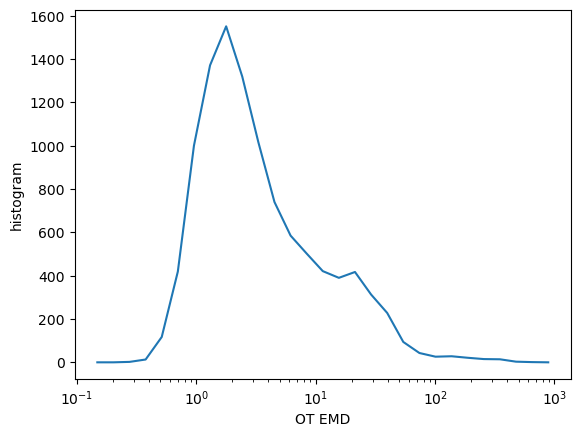

In [29]:
#review histogram of OT EMD costs to choose cutoff
ot_costs=[[np.inf]]*(np.max(indgood_models)+1)
linSets=[None]*(np.max(indgood_models)+1)
#cells_nchildren=[None]*(np.max(indgood_models)+1)
for i in indgood_models:
    print(f're-tracking {modelSet[i].h5filename}')
    sctm=modelSet[i]
    #ot_costs[i],linSets[i]=sctm.get_lineage_min_otcost(distcut=0.5*sctm.cellpose_diam,return_cost=True,ot_cost_cut=np.inf,border_resolution=1.33,visual=False,save_h5=True,overwrite=True)
    ot_costs[i]=sctm.ot_tracking_costs.copy()
    linSets[i]=sctm.linSet.copy()
    #cells_nchildren[i]=sctm.get_cells_nchildren()

ot_costs_all=np.concatenate(ot_costs)
#cells_nchildren_all=np.concatenate(cells_nchildren)
ot_hist,bins=np.histogram(ot_costs_all[np.isfinite(ot_costs_all)],bins=np.logspace(-3,10,num=30,base=2))
plt.plot(.5*bins[0:-1]+.5*bins[1:],ot_hist)
plt.xscale('log')
plt.ylabel('histogram')
plt.xlabel('OT EMD')

In [ ]:
#review tracks and segmentations by optimal control EMD (earth movers distance) metric, you can use this to help set the cutoff value ot_cut
trajl_future=0
trajl_past=1
fu=np.max(sctm.cells_frameSet-trajl_future)
fl=trajl_past
min_traj_len=1
min_size=sctm.cellpose_diam*sctm.cellpose_diam
#i_tm=np.where(np.array(tmSet)=='ctrl')[0][0]
#indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=indgood_models.copy()
indmodels=np.intersect1d(indmodels,indgood_models)
vals_seg_set=[None]*indmodels.size
inds_seg_set=[None]*indmodels.size
vals_track_set=[None]*indmodels.size
ot_cut=10.0
for iimodel in [1]: #range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm_fate=modelSet[imodel]
    inds_track=np.where(np.logical_and(sctm_fate.ot_tracking_costs>ot_cut,np.isfinite(sctm_fate.ot_tracking_costs)))[0]
    inds_sort=np.argsort(sctm_fate.ot_tracking_costs[inds_track])
    #inds_track=np.flip(inds_track[inds_sort])
    inds_track=inds_track[inds_sort]
    indstw=np.where(np.logical_and(sctm_fate.cells_frameSet[inds_track]<fu,sctm_fate.cells_frameSet[inds_track]>fl))[0]
    inds_track=inds_track[indstw]
    print(inds_track)
    print(sctm_fate.cells_frameSet[inds_track])
    trackval_dir=f'./{date}/trackot_val_m{imodel}/'
    os.system(f'mkdir {trackval_dir}')
    vals_seg_set[iimodel],inds_seg_set[iimodel],vals_track_set[iimodel]=sctm_fate.manual_fate_validation(inds_track,'seg',restart=False,val_tracks=True,trajl_past=trajl_past,trajl_future=trajl_future,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=True,msk_channel=cyto_msk_channel,pathto=trackval_dir,save_pic=True,boundary_expansion=[2,70,70],nuclow=90,save_h5=False,overwrite=False)

In [30]:
#break tracks based upon optimal transport EMD metric
ot_cut=10.0
for i in indgood_models:
    sctm=modelSet[i]
    inds_break=np.where(sctm.ot_tracking_costs>ot_cut)[0]
    print(f'breaking {inds_break.size} tracks from {modelSet[i].h5filename}')
    for ic in inds_break:
        iS=sctm.cells_frameSet[ic]
        sctm.linSet[iS][sctm.cells_indSet[ic]]=-1

breaking 116 tracks from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
breaking 1218 tracks from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5
breaking 444 tracks from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5
breaking 127 tracks from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy36_roi1.h5
breaking 305 tracks from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy37_roi0.h5
breaking 597 tracks from /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy38_roi0.h5


In [31]:
#Map all trajectories
all_trajSet=[None]*nmodels
for i in indgood_models:
    print(f'tracing trajectories for {modelSet[i].h5filename}')
    modelSet[i].get_unique_trajectories()
    all_trajSet[i]=modelSet[i].trajectories.copy()

tracing trajectories for /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy0_roi0.h5
tracked cell 459, 4 tracks, 400 left
tracked cell 370, 1 tracks, 300 left
tracked cell 198, 21 tracks, 100 left
tracked cell 0, 1 tracks, 0 left
tracing trajectories for /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy3_roi0.h5
tracked cell 3137, 12 tracks, 2800 left
tracked cell 2185, 3 tracks, 2100 left
tracked cell 2062, 1 tracks, 2000 left
tracked cell 1900, 1 tracks, 1900 left
tracked cell 1534, 1 tracks, 1300 left
tracked cell 1335, 1 tracks, 1100 left
tracked cell 971, 16 tracks, 800 left
tracked cell 1, 1 tracks, 0 left
tracing trajectories for /home/wsltools/projects/Rawan/20240810_PCLS_OS17_R6M1_inhset2_N1/20241216_segredo_last/20241004_OS17lungInh2_RM_xy35_roi0.h5
tracked cell 2153, 4 tracks, 1800 left
tracked cell 924, 8 tracks, 500 left
tracked cell 0, 1 tracks,

### validate deaths

In [208]:
#print(modelSet[18].inds_death)
np.where(indgood_models==18)

(array([12]),)

In [209]:
trajl_future=4
trajl_past=1
fu=np.max(sctm.cells_frameSet-trajl_future)
fl=trajl_past
min_traj_len=5
stride=4
min_size=sctm.cellpose_diam*sctm.cellpose_diam
#i_tm=np.where(np.array(tmSet)=='ctrl')[0][0]
#indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=indgood_models.copy()
indmodels=np.intersect1d(indmodels,indgood_models)
vals_death_set=[None]*indmodels.size
inds_death_set=[None]*indmodels.size
for iimodel in [12]: #range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm_fate=modelSet[imodel]
    inds_last=np.array([]).astype(int)
    for itraj in range(len(sctm_fate.trajectories)):
        ic_last=sctm_fate.trajectories[itraj][-1]
        if sctm_fate.cells_frameSet[ic_last] != np.max(sctm_fate.cells_frameSet) and sctm_fate.trajectories[itraj].size>min_traj_len:
            imgc_test,mskc_relabeled=sctm_fate.get_cell_data(ic_last,relabel_mskchannels=[cyto_msk_channel])
            size=np.sum(mskc_relabeled[...,cyto_msk_channel]==ic_last)
            print(f'cell {ic_last} size {size}, {itraj}/{len(sctm_fate.trajectories)}')
            if size>min_size:
                inds_last=np.append(inds_last,ic_last)
    indstw=np.where(np.logical_and(sctm_fate.cells_frameSet[inds_last]<fu,sctm_fate.cells_frameSet[inds_last]>fl))[0]
    inds_last=inds_last[indstw]
    print(inds_last)
    print(sctm_fate.cells_frameSet[inds_last])
    deathval_dir=f'./{date}/death_val_m{imodel}/'
    os.system(f'mkdir {deathval_dir}')
    vals_death_set[iimodel],inds_death_set[iimodel]=sctm_fate.manual_fate_validation(inds_last,'death',restart=False,val_tracks=False,trajl_past=trajl_past,trajl_future=trajl_future,stride=stride,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=True,msk_channel=cyto_msk_channel,pathto=deathval_dir,save_pic=True,boundary_expansion=[3,70,70],nuclow=90,save_h5=True,overwrite=True)

saving attributes ['inds_death', 'vals_death', 'indreviewed_death'] to /cell_data_m0/ in /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5
saved inds_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5//cell_data_m0/
saved vals_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5//cell_data_m0/
saved indreviewed_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy26_roi0.h5//cell_data_m0/


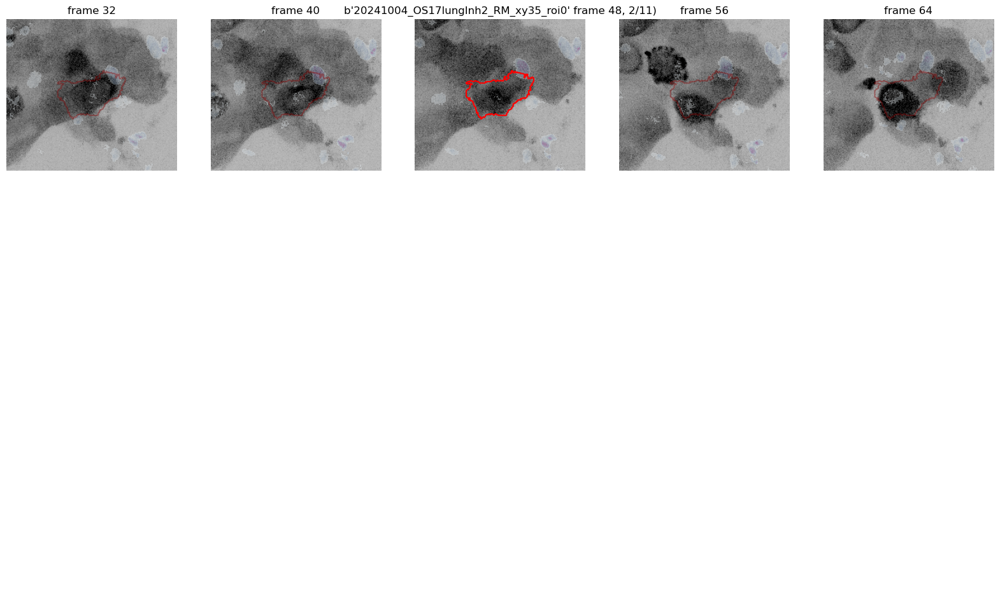

fate validation (q to quit, -1 can't tell, 0 not fate, 1 is fate):
 q


saving attributes ['inds_death', 'vals_death', 'indreviewed_death'] to /cell_data_m0/ in /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5
overwrote existing and saved inds_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5//cell_data_m0/
overwrote existing and saved vals_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5//cell_data_m0/
overwrote existing and saved indreviewed_death to /home/groups/CEDAR/copperma/dyn-cell-sys/makkawi/20241004_OS17lungInh2_RM/20241004_OS17lungInh2_RM_xy35_roi0.h5//cell_data_m0/


In [489]:
#review deaths again for a model, this does not save
imodel=1
inds_death=inds_death_set[imodel]
sctm_fate=modelSet[imodel]
deathval_dir=f'./{date}/death_test_m{imodel}/'
os.system(f'mkdir {deathval_dir}')
inds_test,vals_test=sctm_fate.manual_fate_validation(inds_death,'death',show_allcells=False,show_linked=False,val_tracks=False,restart=False,trajl_past=2,trajl_future=2,stride=8,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=True,msk_channel=cyto_msk_channel,pathto=deathval_dir,save_pic=True,boundary_expansion=[2,70,70],nuclow=90,save_h5=False,overwrite=False)

### randomly review segmentation and tracking to determine performance

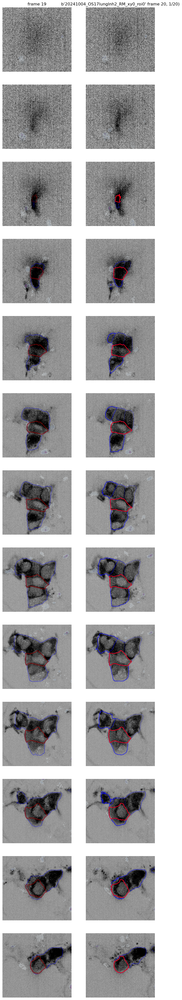

KeyboardInterrupt: Interrupted by user

In [34]:
# trajl_future=0
trajl_past=1
fu=np.max(sctm.cells_frameSet-trajl_future)
fl=trajl_past
min_traj_len=1
min_size=sctm.cellpose_diam*sctm.cellpose_diam
#i_tm=np.where(np.array(tmSet)=='ctrl')[0][0]
#indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=indgood_models.copy()
indmodels=np.intersect1d(indmodels,indgood_models)
vals_seg_set=[None]*indmodels.size
inds_seg_set=[None]*indmodels.size
vals_track_set=[None]*indmodels.size
n_val=20
for iimodel in [0]: #range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm=modelSet[imodel]
    indstw=np.where(np.logical_and(sctm.cells_frameSet<fu,sctm.cells_frameSet>fl))[0]
    inds_random = np.random.choice(indstw.size, n_val, replace=False)
    inds_test=indstw[inds_random]
    trackval_dir=f'./{date}/track_val_m{imodel}/'
    os.system(f'mkdir {trackval_dir}')
    print(f'validating {n_val} segs and tracks for {sctm.figid}, writing results to {trackval_dir}')
    vals_seg_set[iimodel],inds_seg_set[iimodel],vals_track_set[iimodel]=sctm.manual_fate_validation(inds_test,'seg',restart=False,val_tracks=True,trajl_past=trajl_past,trajl_future=trajl_future,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=False,msk_channel=cyto_msk_channel,pathto=trackval_dir,save_pic=True,boundary_expansion=[2,70,70],nuclow=90,save_h5=False,overwrite=False)

### validate divisions

[81, 82]


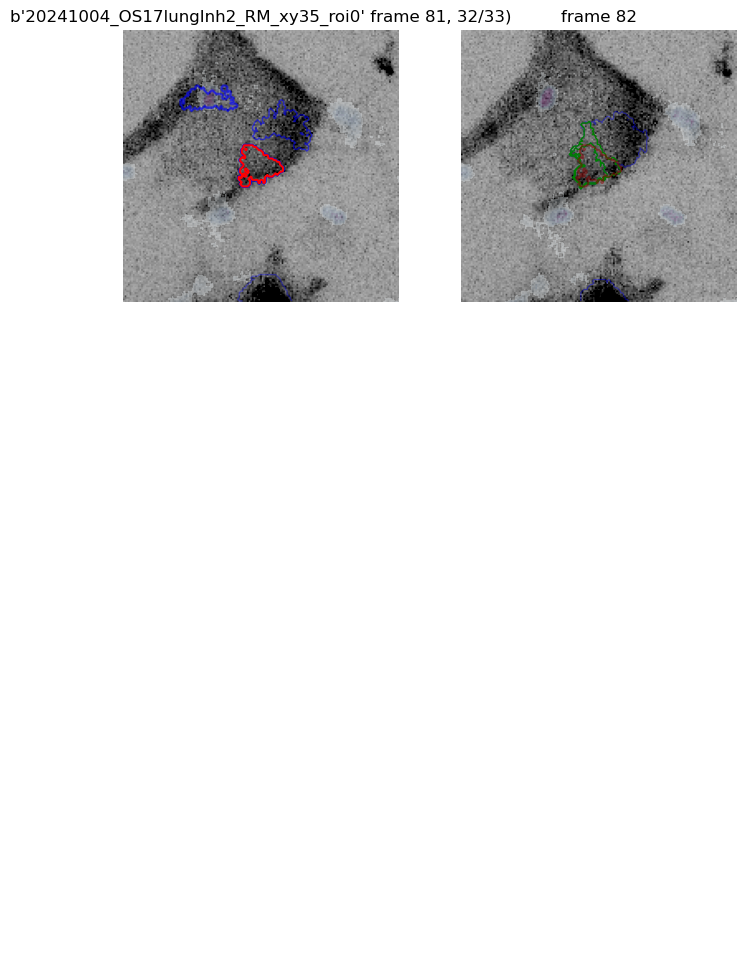

track validation (1 all good, -2 to break past link, 2 to break future link, 0 to break both):
 1
fate validation (q to quit, -1 can't tell, 0 not fate, 1 is fate):
 1


In [349]:
trajl_future=1
trajl_past=0
fu=np.max(sctm.cells_frameSet-trajl_future)
fl=trajl_past
min_traj_len=1
#i_tm=np.where(np.array(tmSet)=='ctrl')[0][0]
#indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=indgood_models.copy()
indmodels=np.intersect1d(indmodels,indgood_models)
vals_div_set=[None]*indmodels.size
inds_div_set=[None]*indmodels.size
vals_div_track_set=[None]*indmodels.size
for iimodel in [1]: #range(indmodels.size):
    imodel=indmodels[iimodel]
    sctm_fate=modelSet[imodel]
    cells_nchildren=sctm_fate.get_cells_nchildren()
    inds_div=np.where(cells_nchildren>1)[0]
    indstw=np.where(np.logical_and(sctm_fate.cells_frameSet[inds_div]<fu,sctm_fate.cells_frameSet[inds_div]>fl))[0]
    inds_div=inds_div[indstw]
    print(inds_div)
    print(sctm_fate.cells_frameSet[inds_div])
    div_val_dir=f'./{date}/div_val_m{imodel}/'
    os.system(f'mkdir {div_val_dir}')
    vals_div_set[iimodel],inds_div_set[iimodel],vals_div_track_set[iimodel]=sctm_fate.manual_fate_validation(inds_div,'div',restart=False,val_tracks=True,trajl_past=trajl_past,trajl_future=trajl_future,rep_channel=erk_img_channel,bf_channel=erk_img_channel,nuc_channel=nuc_img_channel,projection=True,msk_channel=cyto_msk_channel,pathto=div_val_dir,save_pic=True,boundary_expansion=[2,70,70],nuclow=90,save_h5=False,overwrite=False)

### death / persistors analysis

In [35]:
indmodels_death=indgood_models.copy()
print(np.array(tmSet)[inds_tmSet_models[indmodels_death]])

['Control' 'Control' 'Mcl1i' 'Mcl1i' 'Mcl1i' 'Mcl1i']


In [36]:
for i in indgood_models:
    sctm=modelSet[i]
    print(f'model {i} {sctm.figid} condition {tmSet[inds_tmSet_models[i]]} with {sctm.inds_death.size} deaths')

model 0 b'20241004_OS17lungInh2_RM_xy0_roi0' condition Control with 0 deaths
model 1 b'20241004_OS17lungInh2_RM_xy3_roi0' condition Control with 2 deaths
model 2 b'20241004_OS17lungInh2_RM_xy35_roi0' condition Mcl1i with 7 deaths
model 3 b'20241004_OS17lungInh2_RM_xy36_roi1' condition Mcl1i with 9 deaths
model 4 b'20241004_OS17lungInh2_RM_xy37_roi0' condition Mcl1i with 10 deaths
model 5 b'20241004_OS17lungInh2_RM_xy38_roi0' condition Mcl1i with 23 deaths


In [37]:
#image features stored in sctm.Xf, often Zernike polynomials, texture, shape, environment, etc
#print(modelSet[indgood_models[0]].Xf_feature_list)
ilast=np.where(modelSet[indgood_models[0]].Xf_feature_list==b'featBoundaryCB-14_msk0img0_fmsk')[0][0]
#print(modelSet[indgood_models[0]].Xf_feature_list[0:ilast])
indkeep_features=np.arange(ilast) #modelSet[indgood_models[0]].Xf.shape[1]).astype(int)
Xf_feature_list=modelSet[indgood_models[0]].Xf_feature_list[indkeep_features]
nfeat=indkeep_features.size
Xf=np.zeros((0,nfeat))
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
indcells_models=np.array([]).astype(int)
indframes=[]
for i in indgood_models:
    Xf=np.append(Xf,modelSet[i].Xf[:,indkeep_features],axis=0)
    indtreatment=np.append(indtreatment,inds_tmSet_models[i]*np.ones(modelSet[i].Xf.shape[0]).astype(int))
    indcellSet=np.append(indcellSet,modelSet[i].cells_indSet)
    indcells_models=np.append(indcells_models,i*np.ones(modelSet[i].Xf.shape[0]).astype(int))
    indframes.append(modelSet[i].cells_frameSet)

indframes=np.concatenate(indframes)

In [38]:
#signaling features
cratio_erk=np.array([]).astype(float)
for i in indmodels_death:
    sctm=modelSet[i]
    attr_str=f'img{erk_img_channel}_m{sctm.mskchannel}m{nuc_fmsk_channel}_ratio'
    cc=getattr(sctm,attr_str)
    cratio_erk=np.append(cratio_erk,cc)
    modelSet[i].x_signal=cc.copy()

cratio_erk_std=np.std(cratio_erk);cratio_erk_mean=np.mean(cratio_erk);#cratio_erk=imprep.znorm(cratio_erk)

In [39]:
#signaling features
cratio_akt=np.array([]).astype(float)
for i in indmodels_death:
    sctm=modelSet[i]
    attr_str=f'img{akt_img_channel}_m{sctm.mskchannel}m{nuc_fmsk_channel}_ratio'
    cc=getattr(sctm,attr_str)
    cratio_akt=np.append(cratio_akt,cc)
    modelSet[i].x_signal_akt=cc.copy()

cratio_akt_std=np.std(cratio_akt);cratio_akt_mean=np.mean(cratio_akt);#cratio_erk=imprep.znorm(cratio_erk)

In [174]:
nf

10

In [40]:
def get_death_erk_info(indmodels_death,modelSet):
    plt.figure()
    erk_trajs_death=[]
    for imodel in indmodels_death:
        sctm=modelSet[imodel]
        if not hasattr(sctm,'inds_death'):
            print(f'model {imodel} has no inds_death')
        print(f'{imodel} with {sctm.inds_death.size} deaths')
        for ideath in range(sctm.inds_death.size):
            ic=sctm.inds_death[ideath]
            cell_traj=sctm.get_cell_trajectory(ic)
            print(f'cell death at frame {sctm.cells_frameSet[ic]} traced for {cell_traj.size} frames')
            frames=sctm.cells_frameSet[cell_traj]
            erk_traj=sctm.x_signal[cell_traj]
            xtraj=np.ones(sctm.nt)*np.nan
            xtraj[frames]=erk_traj
            erk_trajs_death.append(xtraj)
            plt.plot(frames,erk_traj,color='black')
    
    erk_trajs_persist=[]
    for imodel in indmodels_death:
        sctm=modelSet[imodel]
        inds_persistors=np.where(sctm.cells_frameSet==np.max(sctm.cells_frameSet))[0]
        for ipersist in range(inds_persistors.size):
            ic=inds_persistors[ipersist]
            cell_traj=sctm.get_cell_trajectory(ic)
            print(f'cell persistor at frame {sctm.cells_frameSet[ic]} traced for {cell_traj.size} frames')
            frames=sctm.cells_frameSet[cell_traj]
            erk_traj=sctm.x_signal[cell_traj]
            xtraj=np.ones(sctm.nt)*np.nan
            xtraj[frames]=erk_traj
            erk_trajs_persist.append(xtraj)
            plt.plot(frames,erk_traj,color='red')
    
    erk_initial=np.array([])
    for imodel in indmodels_death:
        sctm=modelSet[imodel]
        inds_initial=np.where(sctm.cells_frameSet==0)[0]
        erk_initial=np.append(erk_initial,sctm.x_signal[inds_initial])
    
    erk_initial=np.array(erk_initial)
    plt.scatter(np.zeros_like(erk_initial),erk_initial,s=20,c='green',marker='o')
    plt.close()
    
    erk_trajs_persist=np.array(erk_trajs_persist)
    if erk_trajs_persist.size==0:
        erk_trajs_persist=np.zeros((0,0))
    erk_trajs_death=np.array(erk_trajs_death)
    if erk_trajs_death.size==0:
        erk_trajs_death=np.zeros((0,0))
    erk_initial=np.array(erk_initial)
    return erk_trajs_persist,erk_trajs_death,erk_initial

In [41]:
date='20dec25'
os.system(f'mkdir {date}')

0



 FGF2 with 0 models and 0 cells




/tmp/ipykernel_526333/1585443181.py:24: DeprecationWarning: Out of bound index found. This was previously ignored when the indexing result contained no elements. In the future the index error will be raised. This error occurs either due to an empty slice, or if an array has zero elements even before indexing.
(Use `warnings.simplefilter('error')` to turn this DeprecationWarning into an error and get more details on the invalid index.)
  xs=erk_trajs_death[:,fwindow].flatten()
/tmp/ipykernel_526333/1585443181.py:43: DeprecationWarning: Out of bound index found. This was previously ignored when the indexing result contained no elements. In the future the index error will be raised. This error occurs either due to an empty slice, or if an array has zero elements even before indexing.
(Use `warnings.simplefilter('error')` to turn this DeprecationWarning into an error and get more details on the invalid index.)
  xs=erk_trajs_persist[:,fwindow].flatten()


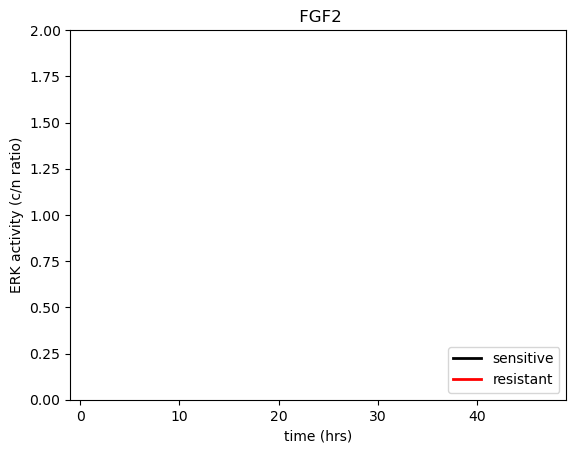



Control with 2 models and 45 cells


0 with 0 deaths
1 with 2 deaths
cell death at frame 36 traced for 22 frames
cell death at frame 22 traced for 23 frames
cell persistor at frame 96 traced for 37 frames
cell persistor at frame 96 traced for 48 frames
cell persistor at frame 96 traced for 8 frames
cell persistor at frame 96 traced for 3 frames
cell persistor at frame 96 traced for 37 frames
cell persistor at frame 96 traced for 48 frames
cell persistor at frame 96 traced for 48 frames
cell persistor at frame 96 traced for 15 frames
cell persistor at frame 96 traced for 48 frames
cell persistor at frame 96 traced for 48 frames
cell persistor at frame 96 traced for 1 frames
cell persistor at frame 96 traced for 7 frames
cell persistor at frame 96 traced for 31 frames
cell persistor at frame 96 traced for 3 frames
cell persistor at frame 96 traced for 31 frames
cell persistor at frame 96 traced for 4 frames
cell persistor at frame 96 traced for 2 frames
cell persistor at frame 96 trace

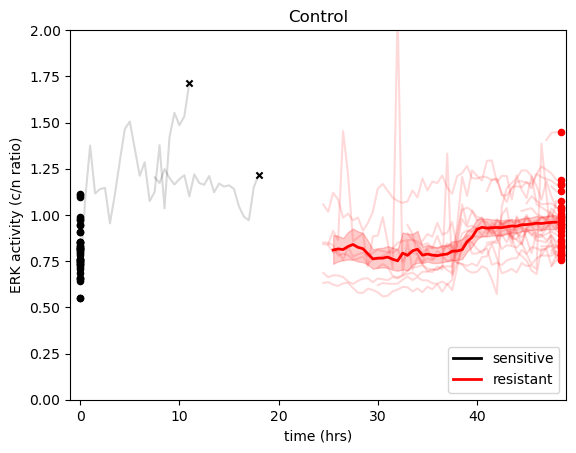



ERKi with 0 models and 0 cells




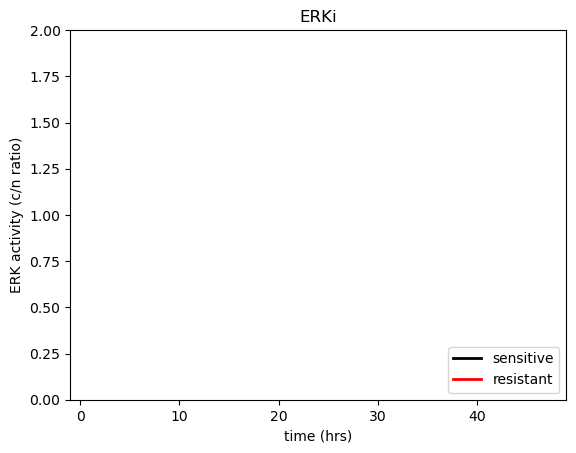



ERKi+MCl1i with 0 models and 0 cells




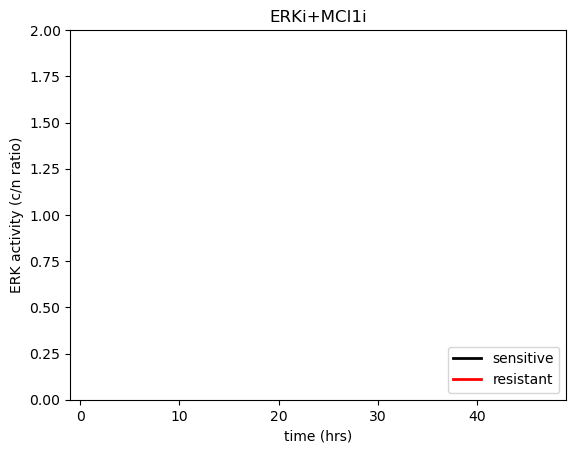



FGF2+Mcl1i with 0 models and 0 cells




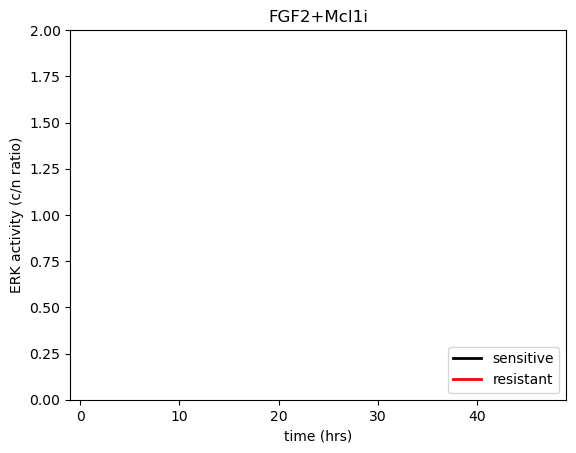



MEKi with 0 models and 0 cells




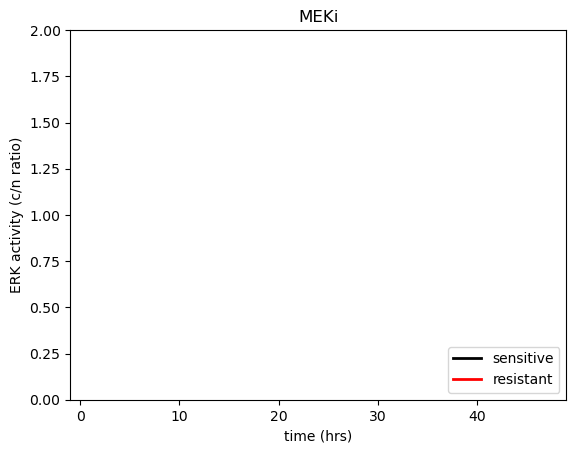



MEKi+Mcl1i with 0 models and 0 cells




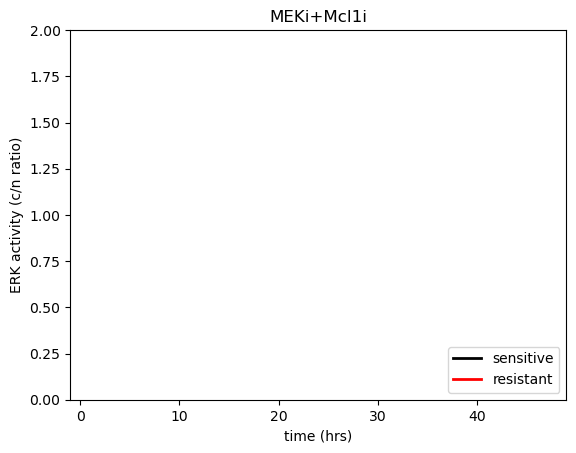



Mcl1i with 4 models and 87 cells


2 with 7 deaths
cell death at frame 85 traced for 37 frames
cell death at frame 44 traced for 41 frames
cell death at frame 41 traced for 33 frames
cell death at frame 37 traced for 8 frames
cell death at frame 34 traced for 22 frames
cell death at frame 31 traced for 14 frames
cell death at frame 29 traced for 7 frames
3 with 9 deaths
cell death at frame 89 traced for 34 frames
cell death at frame 77 traced for 78 frames
cell death at frame 77 traced for 22 frames
cell death at frame 68 traced for 20 frames
cell death at frame 62 traced for 7 frames
cell death at frame 54 traced for 55 frames
cell death at frame 54 traced for 37 frames
cell death at frame 51 traced for 14 frames
cell death at frame 48 traced for 32 frames
4 with 10 deaths
cell death at frame 77 traced for 13 frames
cell death at frame 60 traced for 12 frames
cell death at frame 59 traced for 11 frames
cell death at frame 56 traced for 8 frames
cell death at frame 52 traced for 15 f

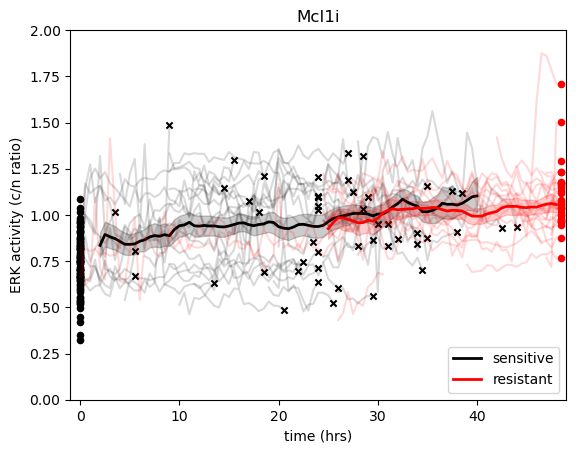



Palbociclib with 0 models and 0 cells




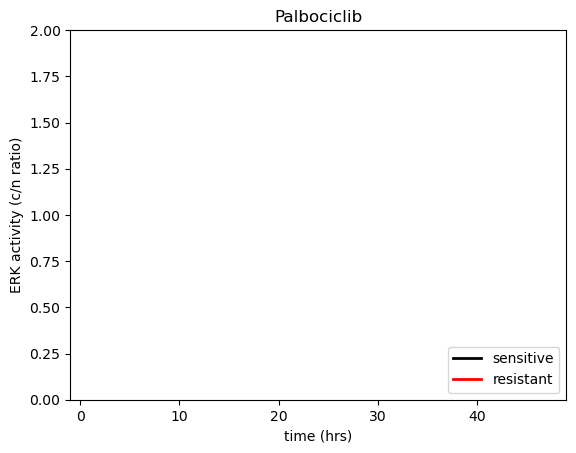



Palbociclib+Mcl1i with 0 models and 0 cells




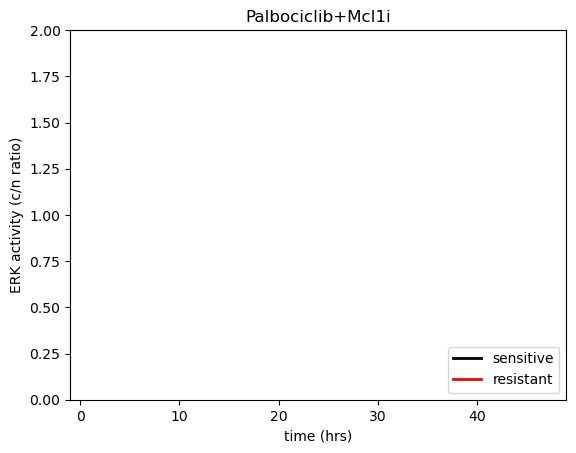

In [42]:
sys.path.append('/home/wsltools/dynamical-cell-systems-group/BayesianBootstrap')
import bootstrap
import bootstrapN
scipy.average=np.mean
scipy.percentile=np.percentile
fw=4
nframes=sctm.nt
timestep=.5

for i_tm in range(nf):
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    ncells=0
    for imodel in indmodels:
        ncells=ncells+np.sum(modelSet[imodel].cells_frameSet==0)
    print('\n');print(f'{tmSet[i_tm]} with {indmodels.size} models and {ncells} cells');print('\n')
    erk_trajs_persist,erk_trajs_death,erk_initial=get_death_erk_info(indmodels,modelSet)
    plt.figure()
    ax=plt.gca()
    x_means_death=np.ones(nframes)*np.nan
    x_bounds_death=np.ones((nframes,2))*np.nan
    for iframe in range(fw,nframes):
        fwindow=np.arange(iframe-fw,iframe).astype(int)
        xs=erk_trajs_death[:,fwindow].flatten()
        xs=xs[np.isfinite(xs)]
        if xs.size>10:
            x_bounds_death[iframe,:]=bootstrap.get_CI(xs,1000)
            x_means_death[iframe]=np.nanmean(xs)
    
    for itraj in range(len(erk_trajs_death)):
        frames=np.where(np.isfinite(erk_trajs_death[itraj,:]))[0]
        if frames.size>0:
            ax.plot(frames*timestep,erk_trajs_death[itraj,frames],'-',color='black',alpha=.15)
            ax.scatter([frames[-1]*timestep],[erk_trajs_death[itraj,frames[-1]]],s=20,c='black',marker='x')
    
    ax.plot(np.arange(nframes)*timestep,x_means_death,'-',color='black',linewidth=2,label='sensitive')
    ax.fill_between(np.arange(nframes)*timestep,x_bounds_death[:,0],x_bounds_death[:,1],color='black',alpha=.2)
    
    x_means_persist=np.ones(nframes)*np.nan
    x_bounds_persist=np.ones((nframes,2))*np.nan
    for iframe in range(fw,nframes):
        fwindow=np.arange(iframe-fw,iframe).astype(int)
        xs=erk_trajs_persist[:,fwindow].flatten()
        xs=xs[np.isfinite(xs)]
        if xs.size>10:
            x_bounds_persist[iframe,:]=bootstrap.get_CI(xs,1000)
            x_means_persist[iframe]=np.nanmean(xs)

    plt.scatter(np.zeros_like(erk_initial),erk_initial,s=20,c='black',marker='o')
    for itraj in range(len(erk_trajs_persist)):
        ax.plot(np.where(np.isfinite(erk_trajs_persist[itraj,:]))[0]*timestep,erk_trajs_persist[itraj,np.where(np.isfinite(erk_trajs_persist[itraj,:]))[0]],'-',color='red',alpha=.15)
        ax.scatter([nframes*timestep],[erk_trajs_persist[itraj,-1]],s=20,c='red',marker='o')
        
    ax.plot(np.arange(nframes)*timestep,x_means_persist,'-',color='red',linewidth=2,label='resistant')
    ax.fill_between(np.arange(nframes)*timestep,x_bounds_persist[:,0],x_bounds_persist[:,1],color='red',alpha=.2)
    
    #plt.scatter(np.ones_like(erk_initial),erk_initial,s=20,c='green',marker='o')
    
    plt.ylabel('ERK activity (c/n ratio)')
    plt.xlabel('time (hrs)')
    plt.ylim(0,2.0)
    plt.xlim(-1,(nframes+1)*timestep)
    plt.legend(loc='lower right') #(bbox_to_anchor=(1.1, 1.0))
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/{tmSet[i_tm]}_erk_activity_dead_alive.png')
    plt.show()

In [43]:
def generate_xcoords_violin(violinplot, sample_data):
    """
    Generate random x-coordinates within the width of each violin plot at the corresponding y-values.

    Args:
        violinplot: The matplotlib Violin plot object returned by ax.violinplot().
        sample_data: List or array of sample data used to create the violin plot.
    
    Returns:
        A list of (x, y) coordinates representing random points within the violin's width.
    """
    x_coords = []
    y_coords = []

    # Extract the collection of paths for each violin
    for i, body in enumerate(violinplot["bodies"]):
        # The violin's outline consists of a collection of paths
        path = body.get_paths()[0]
        vertices = path.vertices
        x, y = vertices[:, 0], vertices[:, 1]
        
        # For each y-value in the sample data, find the width of the violin
        y_sample = sample_data[i]
        for y_val in y_sample:
            # Find the x-coordinates where the violin intersects the y_val
            y_diff = np.abs(y - y_val)
            close_indices = np.where(y_diff == np.min(y_diff))[0]
            
            # Ensure we get the leftmost and rightmost bounds at this y-value
            x_bounds = x[close_indices]
            x_left = np.min(x_bounds)
            x_right = np.max(x_bounds)
            
            # Generate random x-coordinates within the bounds
            random_x = np.random.uniform(x_left, x_right, size=1)
            
            x_coords.append(random_x[0])
            y_coords.append(y_val)

    return x_coords



 FGF2 with 0 models and 0 cells




Control with 2 models and 45 cells




ERKi with 0 models and 0 cells




ERKi+MCl1i with 0 models and 0 cells




FGF2+Mcl1i with 0 models and 0 cells




MEKi with 0 models and 0 cells




MEKi+Mcl1i with 0 models and 0 cells




/tmp/ipykernel_526333/478882416.py:165: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig=plt.figure(figsize=(6,6))




Mcl1i with 4 models and 87 cells




Palbociclib with 0 models and 0 cells




Palbociclib+Mcl1i with 0 models and 0 cells




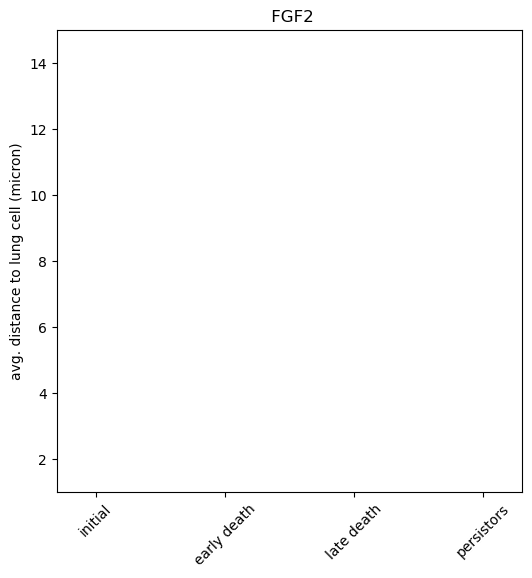

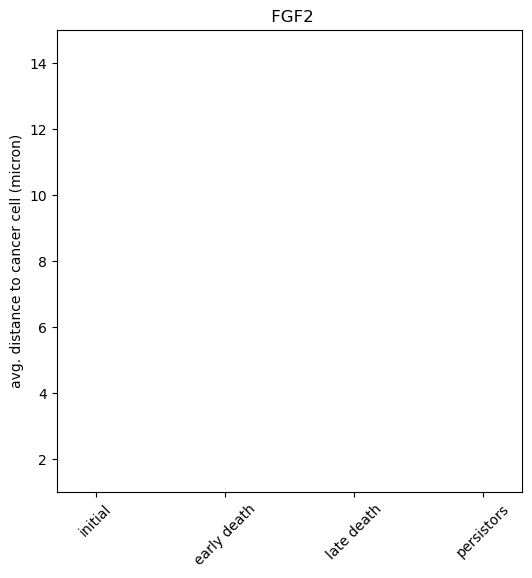

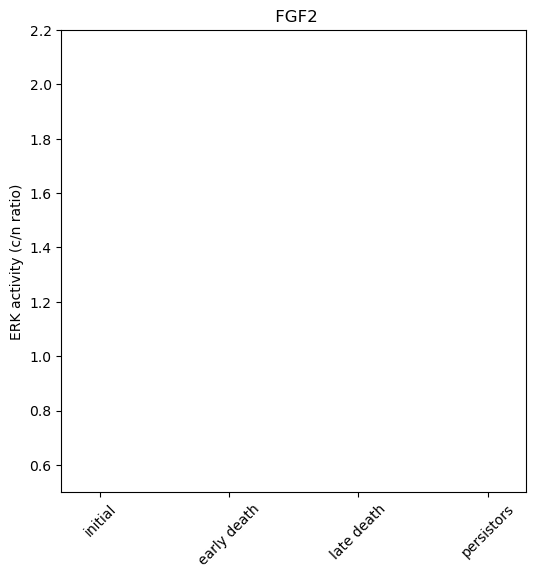

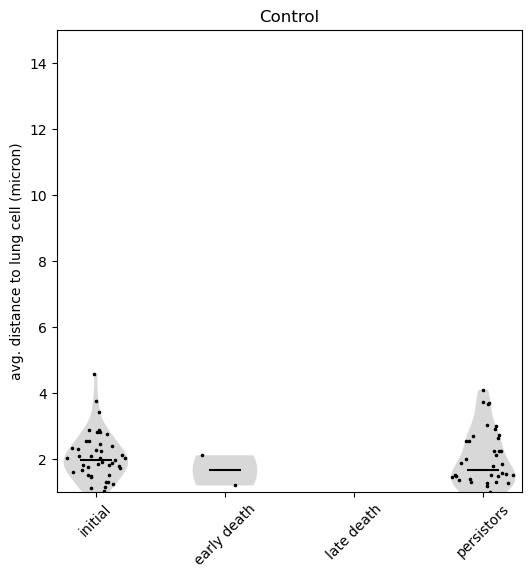

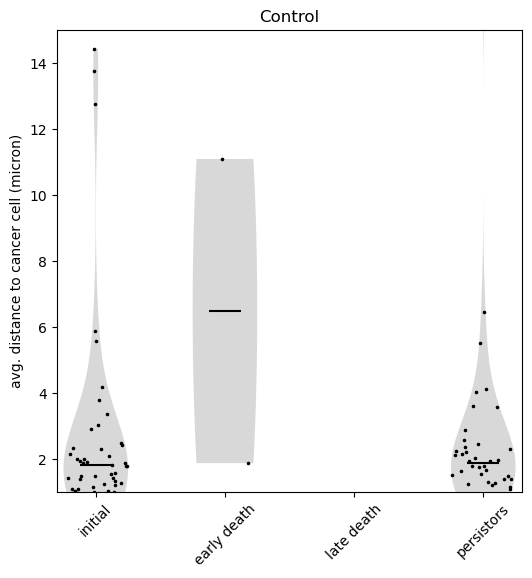

...

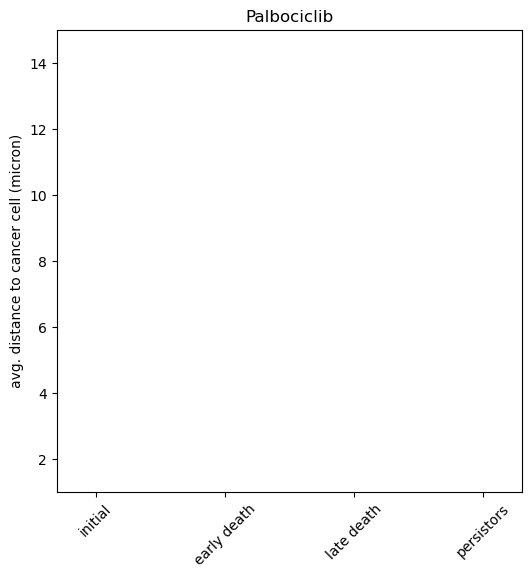

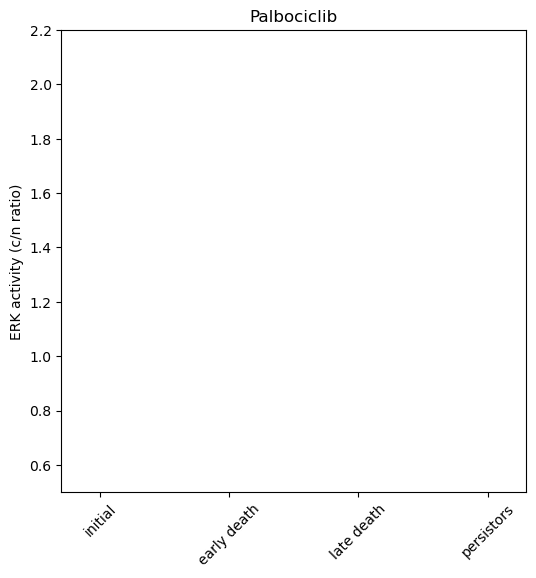

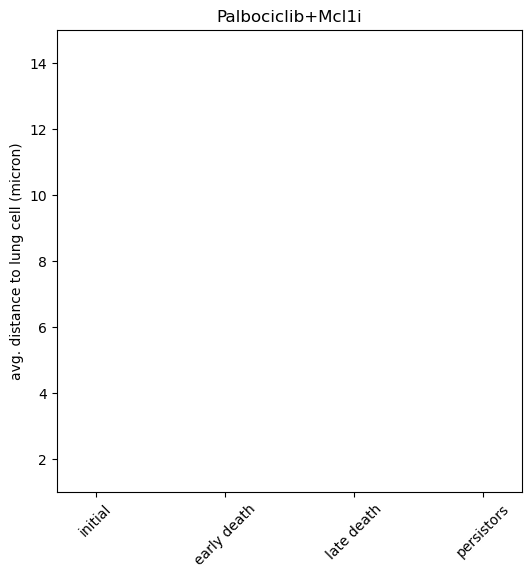

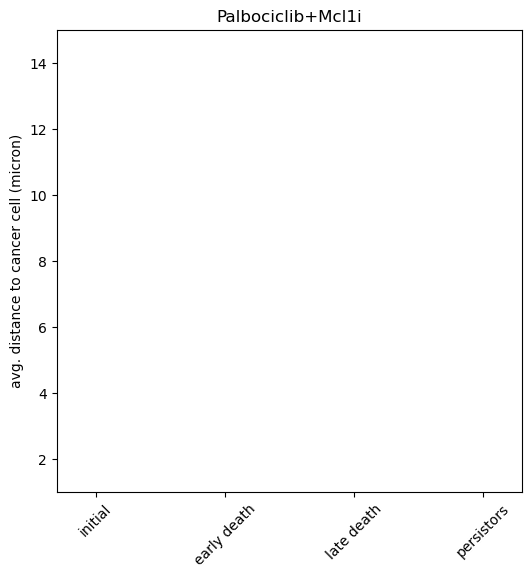

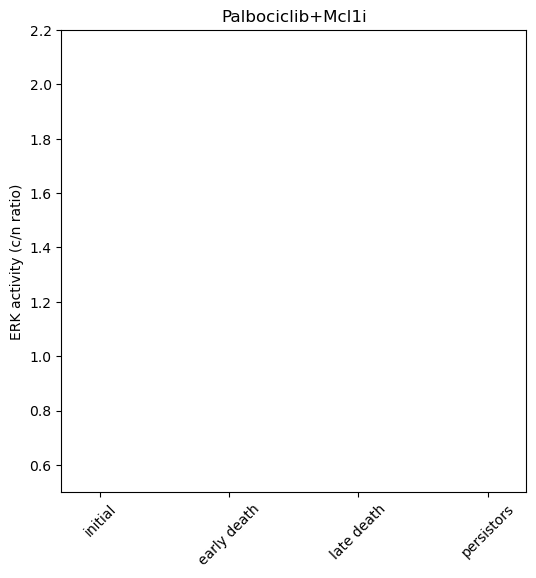

In [44]:
framecut_early=56
for i_tm in range(nf):
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    ncells=0
    for imodel in indmodels:
        ncells=ncells+np.sum(modelSet[imodel].cells_frameSet==0)
    print('\n');print(f'{tmSet[i_tm]} with {indmodels.size} models and {ncells} cells');print('\n')
    
    frames_death=[]
    erk_death=[]
    akt_death=[]
    lungf_death=[]
    cc_death=[]
    for imodel in indmodels:
        sctm=modelSet[imodel]
        for ideath in range(sctm.inds_death.size):
            ic=sctm.inds_death[ideath]
            frames_death.append(sctm.cells_frameSet[ic])
            erk_death.append(sctm.x_signal[ic])
            akt_death.append(sctm.x_signal_akt[ic])
            indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
            rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            lungf_death.append(np.nanmean(rdx_lung))
            cc_death.append(np.nanmean(rdx_cc))
            
    frames_persist=[]
    erk_persist=[]
    akt_persist=[]
    lungf_persist=[]
    cc_persist=[]
    for imodel in indmodels:
        sctm=modelSet[imodel]
        inds_persistors=np.where(sctm.cells_frameSet==np.max(sctm.cells_frameSet))[0]
        for ipersist in range(inds_persistors.size):
            ic=inds_persistors[ipersist]
            frames_persist.append(sctm.cells_frameSet[ic])
            erk_persist.append(sctm.x_signal[ic])
            akt_persist.append(sctm.x_signal_akt[ic])
            indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
            rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            lungf_persist.append(np.nanmean(rdx_lung))
            cc_persist.append(np.nanmean(rdx_cc))
    
    frames_initial=[]
    erk_initial=[]
    akt_initial=[]
    lungf_initial=[]
    cc_initial=[]
    for imodel in indmodels:
        sctm=modelSet[imodel]
        inds_initial=np.where(sctm.cells_frameSet==0)[0]
        for icell in range(inds_initial.size):
            ic=inds_initial[icell]
            frames_initial.append(sctm.cells_frameSet[ic])
            erk_initial.append(sctm.x_signal[ic])
            akt_initial.append(sctm.x_signal_akt[ic])
            indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
            rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
            lungf_initial.append(np.nanmean(rdx_lung))
            cc_initial.append(np.nanmean(rdx_cc))
        
    #lung contacts
    fig=plt.figure(figsize=(6,6))
    ax=plt.gca()
    setv=np.array(lungf_initial)/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_early=np.where(np.array(frames_death)<framecut_early)[0]
    setv=np.array(lungf_death)[inds_early]/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
    setv=np.array(lungf_death)[inds_late]/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    setv=np.array(lungf_persist)/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
        
    ax.set_xlim(-.3,3.3)
    ax.set_ylim(1,15)
    ax.set_xticks(range(0,3+1))
    ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
    ax.set_ylabel('avg. distance to lung cell (micron)')
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/{tmSet[i_tm]}_lung_contact_earlylate.png')
    
    #cc contact
    fig=plt.figure(figsize=(6,6))
    ax=plt.gca()
    setv=np.array(cc_initial)/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_early=np.where(np.array(frames_death)<framecut_early)[0]
    setv=np.array(cc_death)[inds_early]/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
    setv=np.array(cc_death)[inds_late]/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    setv=np.array(cc_persist)/sctm.boundary_library['border_resolution']
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    ax.set_xlim(-.3,3.3)
    ax.set_ylim(1,15)
    ax.set_xticks(range(0,3+1))
    ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
    ax.set_ylabel('avg. distance to cancer cell (micron)')
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/{tmSet[i_tm]}_cancer_contact_earlylate.png')
    
    #erk
    fig=plt.figure(figsize=(6,6))
    ax=plt.gca()
    setv=np.array(erk_initial)
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_early=np.where(np.array(frames_death)<framecut_early)[0]
    setv=np.array(erk_death)[inds_early]
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
    setv=np.array(erk_death)[inds_late]
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    setv=np.array(erk_persist)
    if setv[np.isfinite(setv)].size>0:
        vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmedians'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('gray')
        xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
        plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
    ax.set_xlim(-.3,3.3)
    ax.set_ylim(.5,2.2)
    ax.set_xticks(range(0,3+1))
    ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
    ax.set_ylabel('ERK activity (c/n ratio)')
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/{tmSet[i_tm]}_erk_activity_earlylate.png')



 FGF2 with 0 models and 0 cells




Control with 2 models and 45 cells




ERKi with 0 models and 0 cells




ERKi+MCl1i with 0 models and 0 cells




FGF2+Mcl1i with 0 models and 0 cells




MEKi with 0 models and 0 cells




MEKi+Mcl1i with 0 models and 0 cells




Mcl1i with 4 models and 87 cells




Palbociclib with 0 models and 0 cells




Palbociclib+Mcl1i with 0 models and 0 cells




Text(0.5, 0, 'time (hrs)')

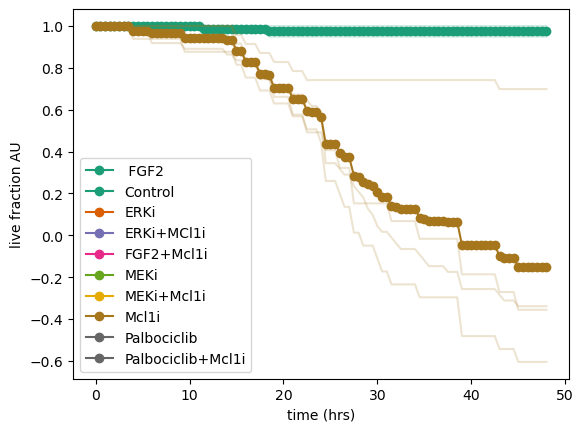

In [48]:
nframes0=5
for i_tm in range(nf):
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    ncells=0
    for imodel in indmodels:
        ncells=ncells+np.sum(modelSet[imodel].cells_frameSet==0)
    print('\n');print(f'{tmSet[i_tm]} with {indmodels.size} models and {ncells} cells');print('\n')
    frames_death=[[]]*indmodels.size
    live_fraction=np.zeros((indmodels.size,sctm.nt))
    i=0
    for imodel in indmodels:
        sctm=modelSet[imodel]
        n0=np.zeros(nframes0)
        for iframe in range(nframes0):
            n0[iframe]=np.sum(sctm.cells_frameSet==iframe)
        avn0=np.nanmean(n0)
        for ideath in range(sctm.inds_death.size):
            ic=sctm.inds_death[ideath]
            frames_death[i].append(sctm.cells_frameSet[ic])
        frames_death[i]=np.sort(frames_death[i])
        for iframe in range(sctm.nt):
            live_fraction[i,iframe]=(avn0-np.sum(frames_death[i]<iframe))/avn0
        plt.plot(np.arange(sctm.nt)*timestep,live_fraction[i,:],'-',alpha=.2,color=colorSet[i_tm])
        i=i+1
    plt.plot(np.arange(sctm.nt)*timestep,np.mean(live_fraction,axis=0),'o-',color=colorSet[i_tm],label=tmSet[i_tm])

plt.legend(loc='lower left')
plt.ylabel('live fraction AU')
plt.xlabel('time (hrs)')
 

In [45]:
tmSet

[' FGF2',
 'Control',
 'ERKi',
 'ERKi+MCl1i',
 'FGF2+Mcl1i',
 'MEKi',
 'MEKi+Mcl1i',
 'Mcl1i',
 'Palbociclib',
 'Palbociclib+Mcl1i']



9 models and 224 cells




/tmp/ipykernel_1105285/587928169.py:29: RuntimeWarning: Mean of empty slice
  lungf_death.append(np.nanmean(rdx_lung))
/tmp/ipykernel_1105285/587928169.py:49: RuntimeWarning: Mean of empty slice
  cc_persist.append(np.nanmean(rdx_cc))
/tmp/ipykernel_1105285/587928169.py:68: RuntimeWarning: Mean of empty slice
  cc_initial.append(np.nanmean(rdx_cc))


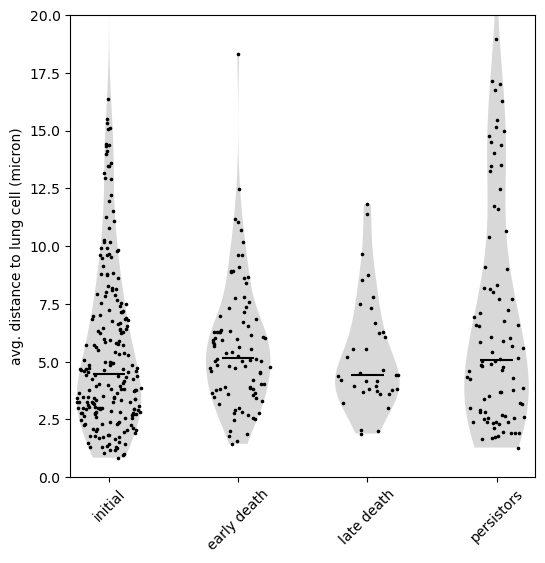

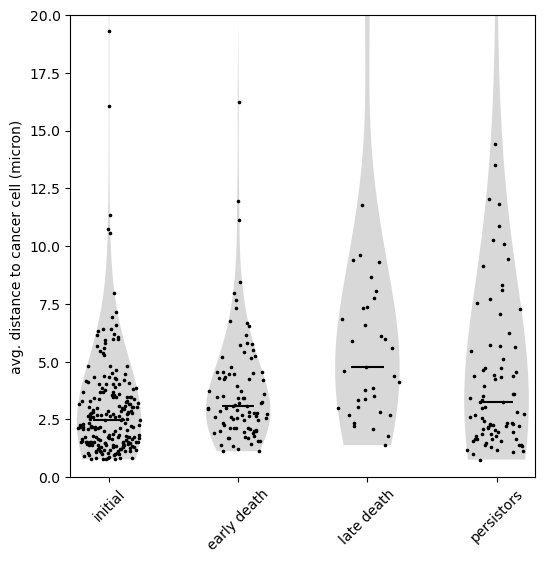

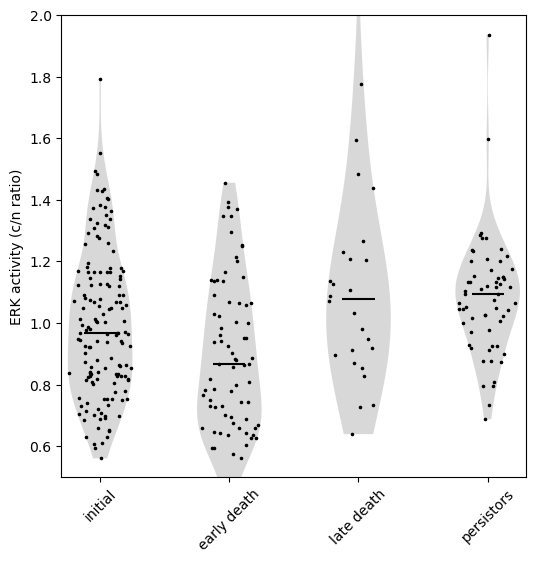

In [316]:
indmodels=[]   #Do not run, what is this?
for i_tm in range(nf):
    if 'Mcl1i' in tmSet[i_tm]:
        indmodels.append(np.where(inds_tmSet_models==i_tm)[0])

indmodels=np.concatenate(indmodels)

indmodels=np.intersect1d(indmodels,indgood_models)
ncells=0
for imodel in indmodels:
    ncells=ncells+np.sum(modelSet[imodel].cells_frameSet==0)
print('\n');print(f'{indmodels.size} models and {ncells} cells');print('\n')

frames_death=[]
erk_death=[]
akt_death=[]
lungf_death=[]
cc_death=[]
for imodel in indmodels:
    sctm=modelSet[imodel]
    for ideath in range(sctm.inds_death.size):
        ic=sctm.inds_death[ideath]
        frames_death.append(sctm.cells_frameSet[ic])
        erk_death.append(sctm.x_signal[ic])
        akt_death.append(sctm.x_signal_akt[ic])
        indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
        rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        lungf_death.append(np.nanmean(rdx_lung))
        cc_death.append(np.nanmean(rdx_cc))
        
frames_persist=[]
erk_persist=[]
akt_persist=[]
lungf_persist=[]
cc_persist=[]
for imodel in indmodels:
    sctm=modelSet[imodel]
    inds_persistors=np.where(sctm.cells_frameSet==np.max(sctm.cells_frameSet))[0]
    for ipersist in range(inds_persistors.size):
        ic=inds_persistors[ipersist]
        frames_persist.append(sctm.cells_frameSet[ic])
        erk_persist.append(sctm.x_signal[ic])
        akt_persist.append(sctm.x_signal_akt[ic])
        indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
        rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        lungf_persist.append(np.nanmean(rdx_lung))
        cc_persist.append(np.nanmean(rdx_cc))

frames_initial=[]
erk_initial=[]
akt_initial=[]
lungf_initial=[]
cc_initial=[]
for imodel in indmodels:
    sctm=modelSet[imodel]
    inds_initial=np.where(sctm.cells_frameSet==0)[0]
    for icell in range(inds_initial.size):
        ic=inds_initial[icell]
        frames_initial.append(sctm.cells_frameSet[ic])
        erk_initial.append(sctm.x_signal[ic])
        akt_initial.append(sctm.x_signal_akt[ic])
        indboundary=np.where(sctm.boundary_library['global_index']==ic)[0]
        rdx_cc=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,1,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        rdx_lung=np.linalg.norm(sctm.boundary_library['nn_pts_states'][indboundary,3,:]-sctm.boundary_library['pts'][indboundary,:],axis=1)
        lungf_initial.append(np.nanmean(rdx_lung))
        cc_initial.append(np.nanmean(rdx_cc))
    
#lung contacts
fig=plt.figure(figsize=(6,6))
ax=plt.gca()
setv=np.array(lungf_initial)/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(lungf_death)[inds_early]/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(lungf_death)[inds_late]/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

setv=np.array(lungf_persist)/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    
ax.set_xlim(-.3,3.3)
ax.set_ylim(0,20)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('avg. distance to lung cell (micron)')
plt.savefig(f'{date}/lung_contact_earlylate.png')

#cc contact
fig=plt.figure(figsize=(6,6))
ax=plt.gca()
setv=np.array(cc_initial)/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(cc_death)[inds_early]/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(cc_death)[inds_late]/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

setv=np.array(cc_persist)/sctm.boundary_library['border_resolution']
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

ax.set_xlim(-.3,3.3)
ax.set_ylim(0,20)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('avg. distance to cancer cell (micron)')
plt.savefig(f'{date}/cancer_contact_earlylate.png')

#erk
fig=plt.figure(figsize=(6,6))
ax=plt.gca()
setv=np.array(erk_initial)
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(erk_death)[inds_early]
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(erk_death)[inds_late]
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

setv=np.array(erk_persist)
if setv[np.isfinite(setv)].size>0:
    vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
    vplot['cmedians'].set_color('black')
    for pc in vplot['bodies']:
        pc.set_facecolor('gray')
    xpoints=generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')

ax.set_xlim(-.3,3.3)
ax.set_ylim(.5,2)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('ERK activity (c/n ratio)')
plt.savefig(f'{date}/erk_activity_earlylate.png')

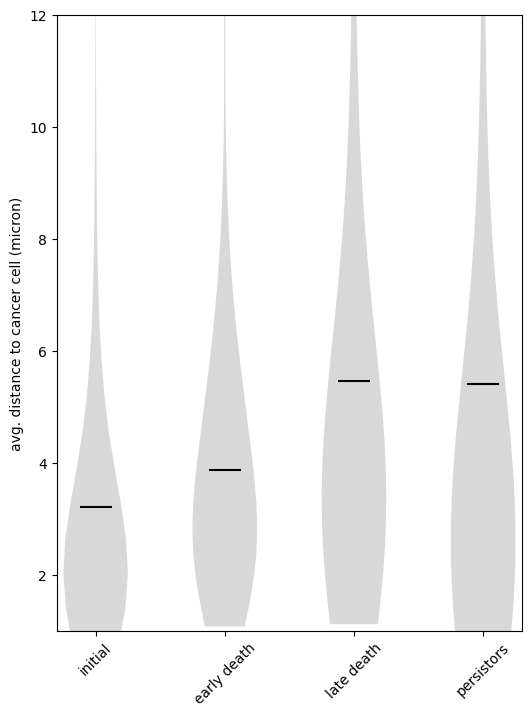

In [116]:
framecut_early=50
fig=plt.figure(figsize=(6,8))
ax=plt.gca()
setv=np.array(cc_initial)/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(cc_death)[inds_early]/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(cc_death)[inds_late]/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

setv=np.array(cc_persist)/sctm.boundary_library['border_resolution']
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

ax.set_xlim(-.3,3.3)
ax.set_ylim(1,12)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('avg. distance to cancer cell (micron)')
plt.savefig(f'{date}/cancer_contact_earlylate.png')

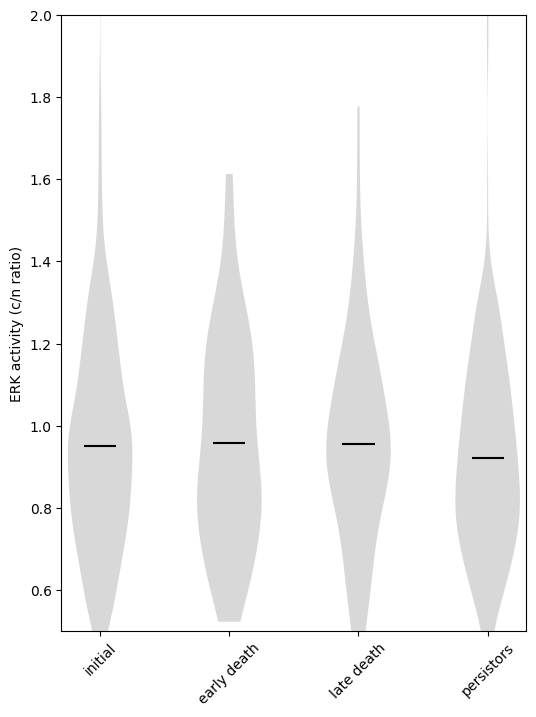

In [117]:
framecut_early=50
fig=plt.figure(figsize=(6,8))
ax=plt.gca()
setv=np.array(erk_initial)
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[0],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_early=np.where(np.array(frames_death)<framecut_early)[0]
setv=np.array(erk_death)[inds_early]
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[1],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

inds_late=np.where(np.array(frames_death)>=framecut_early)[0]
setv=np.array(erk_death)[inds_late]
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[2],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

setv=np.array(erk_persist)
vplot=ax.violinplot(setv[np.isfinite(setv)],positions=[3],showmedians=True,showextrema=False) #,quantiles=[.05,.95])
vplot['cmedians'].set_color('black')
for pc in vplot['bodies']:
    pc.set_facecolor('gray')

ax.set_xlim(-.3,3.3)
ax.set_ylim(.5,2)
ax.set_xticks(range(0,3+1))
ax.set_xticklabels(['initial','early death','late death','persistors'],rotation=45)
ax.set_ylabel('ERK activity (c/n ratio)')
plt.savefig(f'{date}/erk_activity_earlylate.png')

cell death at frame 48 traced for 15 frames
cell death at frame 39 traced for 27 frames
cell death at frame 38 traced for 7 frames
cell death at frame 29 traced for 9 frames
cell death at frame 8 traced for 9 frames
cell death at frame 91 traced for 92 frames
cell death at frame 90 traced for 12 frames
cell death at frame 77 traced for 29 frames
cell death at frame 69 traced for 6 frames
cell death at frame 60 traced for 6 frames
cell death at frame 59 traced for 7 frames
cell death at frame 55 traced for 7 frames
cell death at frame 45 traced for 46 frames
cell death at frame 44 traced for 26 frames
cell death at frame 22 traced for 23 frames
cell death at frame 20 traced for 21 frames
cell death at frame 20 traced for 7 frames
cell death at frame 17 traced for 7 frames
cell death at frame 17 traced for 9 frames
cell death at frame 13 traced for 12 frames
cell death at frame 10 traced for 7 frames
cell death at frame 10 traced for 7 frames
cell death at frame 9 traced for 10 frames
ce

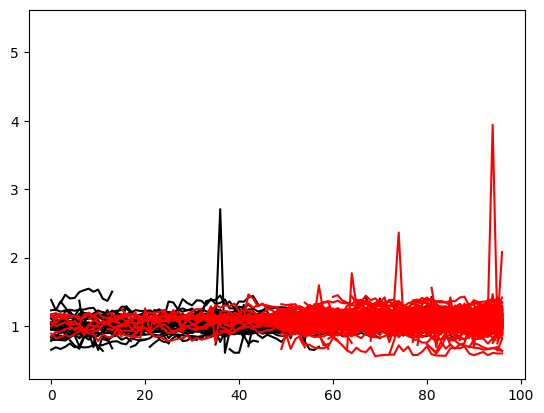

In [115]:
for imodel in indmodels_death:
    sctm=modelSet[imodel]
    for ideath in range(sctm.inds_death.size):
        ic=sctm.inds_death[ideath]
        cell_traj=sctm.get_cell_trajectory(ic)
        print(f'cell death at frame {sctm.cells_frameSet[ic]} traced for {cell_traj.size} frames')
        frames=sctm.cells_frameSet[cell_traj]
        akt_traj=sctm.x_signal_akt[cell_traj]
        plt.plot(frames,akt_traj,color='black')

for imodel in indmodels_death:
    sctm=modelSet[imodel]
    inds_persistors=np.where(sctm.cells_frameSet==np.max(sctm.cells_frameSet))[0]
    for ipersist in range(inds_persistors.size):
        ic=inds_persistors[ipersist]
        cell_traj=sctm.get_cell_trajectory(ic)
        print(f'cell death at frame {sctm.cells_frameSet[ic]} traced for {cell_traj.size} frames')
        frames=sctm.cells_frameSet[cell_traj]
        akt_traj=sctm.x_signal_akt[cell_traj]
        plt.plot(frames,akt_traj,color='red')